In [1]:
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.core.display import display, HTML
%matplotlib inline

In [2]:
import geopandas as gpd

In [3]:
# Notebook Styling 
sns.set()
pd.options.display.max_columns = None
display(HTML("<style>.container { width:100% !important; }</style>"))

# Data Sources

The Chicago crimes data set used in this notebook is publicly available on the [Chicago Data Portal](https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-present/ijzp-q8t2), as are the shapefiles for the current [Chicago police beats](https://data.cityofchicago.org/Public-Safety/Boundaries-Police-Beats-current-/aerh-rz74).


In [4]:
def process_chicrimes(chi_crimes):
    chi_crimes['Date'] = pd.to_datetime(chi_crimes['Date'], format='%m/%d/%Y %I:%M:%S %p')
    chi_crimes['Updated On'] = pd.to_datetime(chi_crimes['Updated On'], format='%m/%d/%Y %I:%M:%S %p')
    chi_crimes.drop(['Location', 'X Coordinate', 'Y Coordinate'], axis=1, inplace=True)
    chi_crimes['Block'] = chi_crimes['Block'].astype('category')
    chi_crimes['IUCR'] = chi_crimes['IUCR'].astype('category')
    chi_crimes['Primary Type'] = chi_crimes['Primary Type'].astype('category')
    chi_crimes['Description'] = chi_crimes['Description'].astype('category')
    chi_crimes['Location Description'] = chi_crimes['Primary Type'].astype('category')
    chi_crimes['Beat'] = chi_crimes['Beat'].astype(int)
    chi_crimes['District'] = chi_crimes['District'].astype('category')
    chi_crimes['Ward'] = chi_crimes['Ward'].astype('category')
    chi_crimes['Community Area'] = chi_crimes['Community Area'].astype('category')
    chi_crimes['FBI Code'] = chi_crimes['FBI Code'].astype('category')
    chi_crimes['Hour'] = chi_crimes['Date'].dt.hour
    chi_crimes['Week'] = chi_crimes['Date'].dt.weekofyear
    chi_crimes['Day'] = chi_crimes['Date'].dt.dayofyear
    chi_crimes['Weekday_name'] = chi_crimes['Date'].dt.day_name()
    chi_crimes['Weekday'] = chi_crimes['Date'].dt.dayofweek
    chi_crimes['Month'] = chi_crimes['Date'].dt.month
    chi_crimes['Hour'] = chi_crimes['Hour'].astype('category')
    chi_crimes['Week'] = chi_crimes['Week'].astype('category')
    chi_crimes['Day'] = chi_crimes['Day'].astype('category')
    chi_crimes['Weekday'] = chi_crimes['Weekday'].astype('category')
    chi_crimes['Month'] = chi_crimes['Month'].astype('category')
    return chi_crimes

In [5]:
CSV_PATH = os.path.join('..', 'data_raw', 'Crimes_-_2001_to_present.csv')
crime_dtypes = {'District':str,
                'Ward':str, 
                'Community Area':str}
chi_crimes = pd.read_csv(CSV_PATH, dtype=crime_dtypes, encoding='latin1') 

C:\Users\mattt\Anaconda3\envs\geo_env\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning: Columns (21) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [6]:
chi_crimes.head(2)

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,Beat,District,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,11034701,JA366925,01/01/2001 11:00:00 AM,016XX E 86TH PL,1153,DECEPTIVE PRACTICE,FINANCIAL IDENTITY THEFT OVER $ 300,RESIDENCE,False,False,412,004,8,45,11,NaN,NaN,2001,08/05/2017 03:50:08 PM,NaN,NaN,NaN
1,11227287,JB147188,10/08/2017 03:00:00 AM,092XX S RACINE AVE,0281,CRIM SEXUAL ASSAULT,NON-AGGRAVATED,RESIDENCE,False,False,2222,022,21,73,02,NaN,NaN,2017,02/11/2018 03:57:41 PM,NaN,NaN,NaN


In [7]:
chi_crimes = process_chicrimes(chi_crimes)

In [8]:
def freq_selector(freq):
    freq = freq.lower()
    if freq == 'month':
        return 'M'
    elif freq == 'quarter':
        return 'Q'
    else:
        return 'Y'

In [9]:
def arrest_plot(crime_descr, crime_df=chi_crimes, crime_col='Description', start_date='2001-01-01', 
                end_date='today', frequency='Year', arrest=True, figsize=(14,6), more_label='', plot_Laquan=False):
    lable_descr = crime_descr.title()
    
    if isinstance(crime_descr, list):
        df = crime_df.loc[(chi_crimes[crime_col].isin(crime_descr)) & (chi_crimes['Date'] >= start_date) & 
                          (chi_crimes['Date'] <= end_date)]
    else:
        df = crime_df.loc[(chi_crimes[crime_col] == crime_descr) & (chi_crimes['Date'] >= start_date) & 
                          (chi_crimes['Date'] <= end_date)]
    
    fig, ax = plt.subplots(sharex=True, figsize=figsize)
    count_df = df.groupby([pd.Grouper(key='Date', freq=freq_selector(frequency))]).count()['Case Number']
    count_df.plot(ax=ax, kind='line', legend=None, label=f"{lable_descr} Cases", color='#0570b0')
    arr_count_df = df.loc[df['Arrest'] == True].groupby([pd.Grouper(key='Date', freq=freq_selector(frequency))]).count()['Case Number']
    arr_count_df.plot(ax=ax, kind='line', legend=None, label=f"{lable_descr} Cases w/ Arrest", color='#41ae76')
    
    ax.set_ylabel(f"{lable_descr} Cases \n(per {frequency})", fontsize=18)
    ax.set_title(f"{more_label}{lable_descr} Cases per {frequency} from {start_date} to {end_date}", fontsize=18)
    ax.set_xlabel('Date', fontsize=18)
    
    ax.set_ylim([0, 1.1 * max([count_df.max(), arr_count_df.max()])])
    if plot_Laquan:
        if freq_selector(frequency) == 'Y':
            ax.axvline(x='2015-04-15', label='Laquan McDonald becomes major News', linestyle='--', color='#b30000')
#             ax.axvline(x='2015', label='Laquan McDonald Shooting', linestyle='--', color='#ef6548')
        else:
            ax.axvline(x='2014-11-01', label='Laquan McDonald Shooting', linestyle='--', color='#ef6548')
            ax.axvline(x='2015-04-15', label='Laquan McDonald becomes major News', linestyle='--', color='#b30000')
    ax.legend()    

In [10]:
ZIP_SHP_PATH = os.path.join('zip://', '..', 'data_raw', 'Boundaries - Police Beats (current).zip')
beats = gpd.read_file(ZIP_SHP_PATH)
beats['beat_num'] = beats['beat_num'].astype('int64')

In [11]:
def map_counts(crime_descr, crime_col='Primary Type', df_=chi_crimes, start_date='2001-01-01', more_label='',
               end_date='2019-01-03', gdf=beats, figsize=(10,10), my_cmap='YlGn', scale=0.6, tight=True, title_fs=None):
    df = df_[(df_['Date'] >= start_date) & (df_['Date'] <= end_date) & (df_[crime_col] == crime_descr.upper())]
    count_df = df.groupby(['Beat', crime_col]).count()['Case Number'].unstack(fill_value=0).stack().reset_index()
    count_df.rename({0:'Count'}, axis=1, inplace=True)
    
    map_df = pd.merge(left=gdf, right=count_df.loc[count_df[crime_col] == crime_descr.upper()], right_on='Beat', left_on='beat_num', how='left')
    map_df['Count'] = map_df['Count'].fillna(0)
    vmin = map_df['Count'].min()
    vmax = map_df['Count'].max()
    fig, ax = plt.subplots(figsize=figsize)
    base = gdf.plot(figsize=figsize, color='white', edgecolor='black', linewidth=2, ax=ax)
    map_df.plot(column='Count', ax=base, edgecolor='grey', linewidth=0.4, cmap=my_cmap)
    _ = ax.axis('off')
    title = f"{more_label}{crime_descr} cases per police beat\nfrom {start_date} to {end_date}"
    if len(title) >= 60:
        title = f"{more_label}{crime_descr} cases\nper police beat from {start_date} to {end_date}"
        if not title_fs:
            title_fs = 22
    if not title_fs:
        title_fs = 25
    _ = ax.set_title(title, fontdict={'fontsize': title_fs, 'fontweight':'3'})
    
    sm = plt.cm.ScalarMappable(cmap=my_cmap, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    sm._A = []
    cbar = fig.colorbar(sm, shrink=scale)
    if tight:
        plt.tight_layout()

In [12]:
def plot_crime_freq_heatmap(crime_descr, crime_col='Primary Type', x_ax='Weekday', y_ax='Hour',  more_label='',
                            start_date='2001-01-01', end_date='today', df=chi_crimes, cmap='YlGn', figsize=None):
    tmp_df = chi_crimes.loc[(chi_crimes['Date'] >= start_date) & (chi_crimes['Date'] <= end_date) & (chi_crimes[crime_col] == crime_descr)]
    tmp_counts = tmp_df.groupby([tmp_df[y_ax], tmp_df[x_ax]])['ID'].count()
    tmp_counts = tmp_counts.unstack(level=1, fill_value=0)
    
    weekday_names = {0:'Mon', 1:'Tue', 2:'Wed', 3:'Thu', 4:'Fri', 5:'Sat', 6:'Sun'}
    month_names = {1:'Jan', 2:'Feb', 3:'Mar', 4:'Apr', 5:'May', 6:'Jun', 7:'Jul', 8:'Aug', 9:'Sep', 10:'Oct', 11:'Nov', 12:'Dec'}
    if x_ax == 'Weekday':
        tmp_counts.columns = tmp_counts.columns.rename_categories(weekday_names)
    if x_ax == 'Month':
        tmp_counts.columns = tmp_counts.columns.rename_categories(month_names)
    if y_ax == 'Weekday':
        if not figsize:
            figsize=(14,4)
        tmp_counts.index = tmp_counts.index.rename_categories(weekday_names)
        y_top = 7
        y_bot = 0
    if y_ax == 'Month':
        if not figsize:
            figsize=(14,6)
        tmp_counts.index = tmp_counts.index.rename_categories(month_names)
        y_top = 12
        y_bot = 1
    if y_ax == 'Hour':
        if not figsize:
            figsize=(14,7)
        y_top = max(list(tmp_counts.index))+1
        y_bot = min(list(tmp_counts.index))
    
    fig, ax = plt.subplots(figsize=figsize)
    ax = sns.heatmap(tmp_counts, ax=ax, annot=False, fmt='d', cmap=cmap)
    ax.tick_params(axis='y', rotation=0)
    ax.set_ylim([y_top, y_bot])
    ax.set_xlabel(x_ax, fontsize=14)
    ax.set_ylabel(y_ax, fontsize=14)
    title = f"Frequency of crime: '{more_label}{crime_descr}' by {y_ax} and {x_ax} from {start_date} to {end_date}"
    if len(title) > 70:
        title = f"Frequency of crime: '{more_label}{crime_descr}' by\n{y_ax} and {x_ax} from {start_date} to {end_date}"
    ax.set_title(title, fontsize=16)
    plt.tight_layout()

## Primary types of crimes in the public Chicago Crimes data set

In [13]:
chi_crimes['Primary Type'].value_counts()

THEFT                                1481310
BATTERY                              1281979
CRIMINAL DAMAGE                       798547
NARCOTICS                             725576
ASSAULT                               439325
OTHER OFFENSE                         435699
BURGLARY                              397897
MOTOR VEHICLE THEFT                   323415
DECEPTIVE PRACTICE                    282748
ROBBERY                               263831
CRIMINAL TRESPASS                     200272
WEAPONS VIOLATION                      76925
PROSTITUTION                           68996
PUBLIC PEACE VIOLATION                 49367
OFFENSE INVOLVING CHILDREN             47930
CRIM SEXUAL ASSAULT                    28952
SEX OFFENSE                            26469
INTERFERENCE WITH PUBLIC OFFICER       16679
GAMBLING                               14565
LIQUOR LAW VIOLATION                   14295
ARSON                                  11528
HOMICIDE                                9982
KIDNAPPING

## Crime frequency by time of day, day of week, day of month, and police beat 

## HOMICIDE

In [14]:
crime_descr='HOMICIDE'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [15]:
# Number of Homicide Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 0) & (query < 1000000)]

FIRST DEGREE MURDER         9932
RECKLESS HOMICIDE             47
INVOLUNTARY MANSLAUGHTER       3
Name: Description, dtype: int64

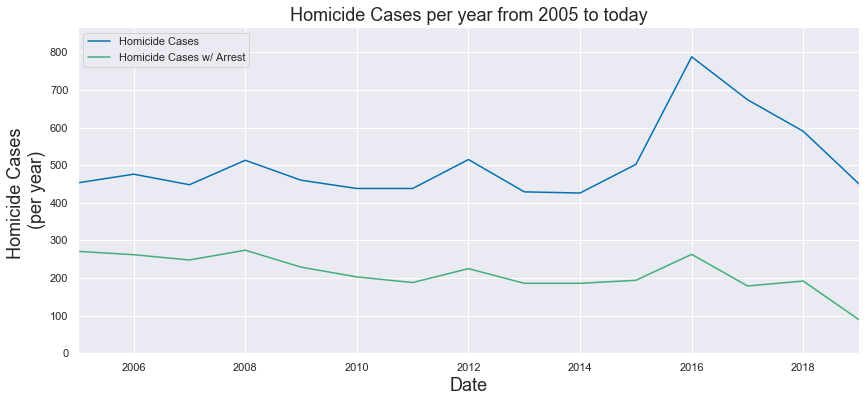

In [16]:
arrest_plot(crime_descr=crime_descr, crime_col='Primary Type', frequency='year', start_date='2005')

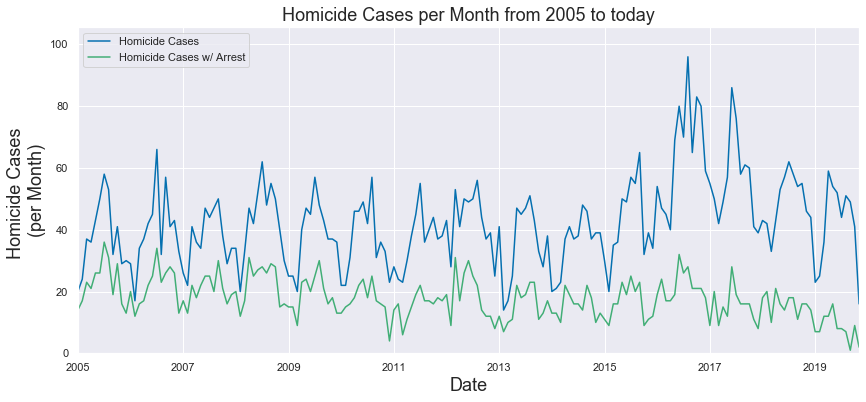

In [17]:
arrest_plot(crime_descr=crime_descr, crime_col='Primary Type', frequency='Month', start_date='2005')

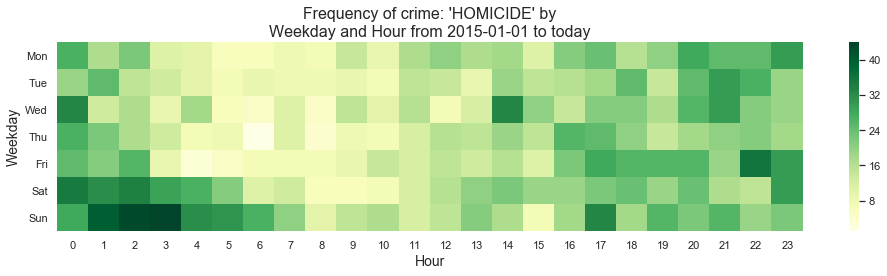

In [18]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col='Primary Type', x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

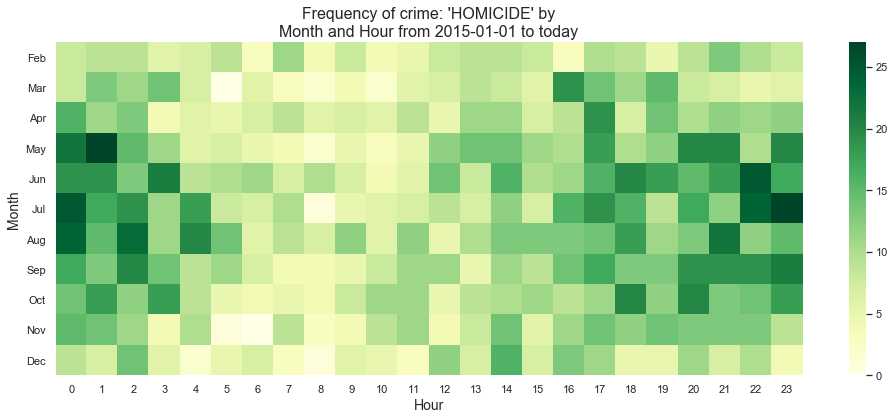

In [19]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col='Primary Type', x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

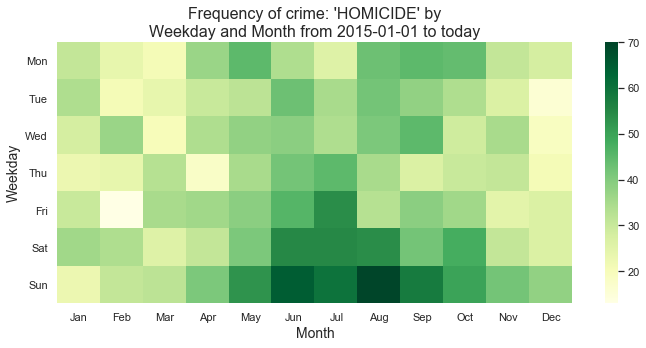

In [20]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col='Primary Type', x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

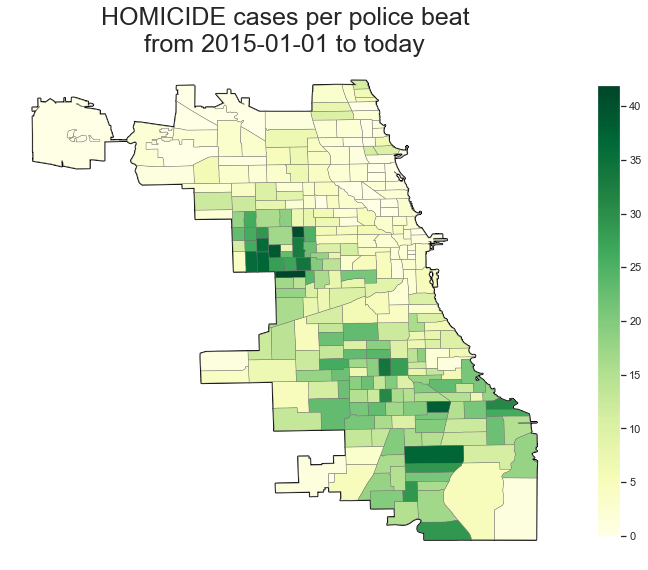

In [21]:
map_counts(crime_descr=crime_descr, crime_col='Primary Type', start_date=start_date, end_date=end_date, scale=0.65)

## BATTERY: All

In [22]:
crime_descr='BATTERY'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [23]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

DOMESTIC BATTERY SIMPLE                                        541084
SIMPLE                                                         519304
AGGRAVATED: OTHER DANG WEAPON                                   69819
AGGRAVATED: HANDGUN                                             38015
AGGRAVATED:KNIFE/CUTTING INSTR                                  27765
AGGRAVATED DOMESTIC BATTERY: OTHER DANG WEAPON                  19442
PRO EMP HANDS NO/MIN INJURY                                     15858
AGG PO HANDS NO/MIN INJURY                                      13828
AGGRAVATED DOMESTIC BATTERY: KNIFE/CUTTING INST                 13315
AGG: HANDS/FIST/FEET NO/MINOR INJURY                             5105
AGGRAVATED DOMESTIC BATTERY: HANDS/FIST/FEET SERIOUS INJURY      4311
AGGRAVATED OF A SENIOR CITIZEN                                   2480
AGG: HANDS/FIST/FEET SERIOUS INJURY                              2457
AGGRAVATED PO: OTHER DANG WEAP                                   1615
AGGRAVATED DOMESTIC 

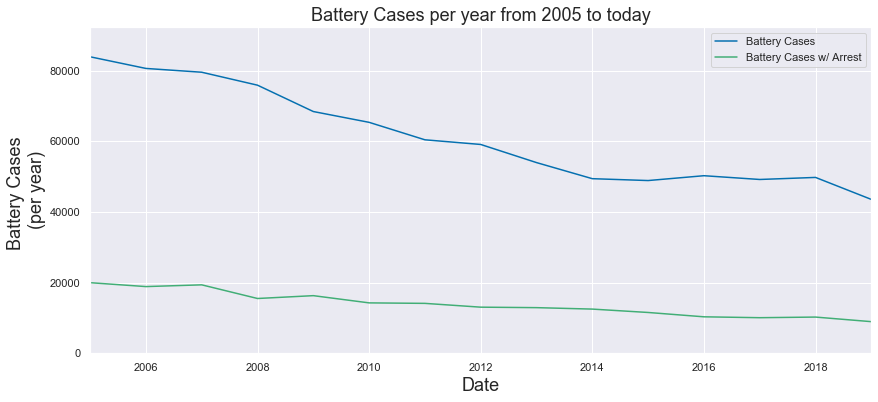

In [24]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

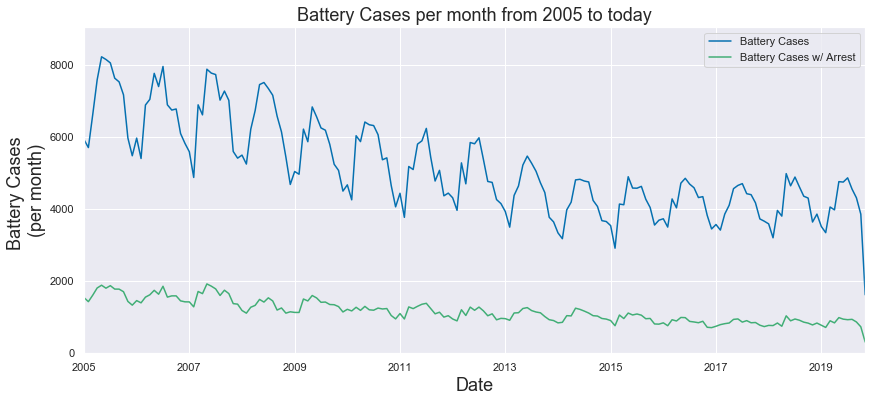

In [25]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

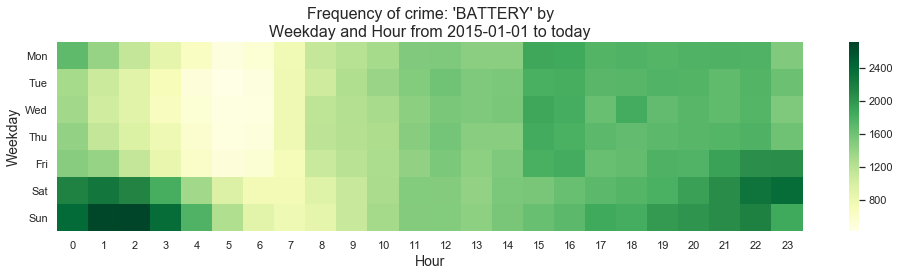

In [26]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

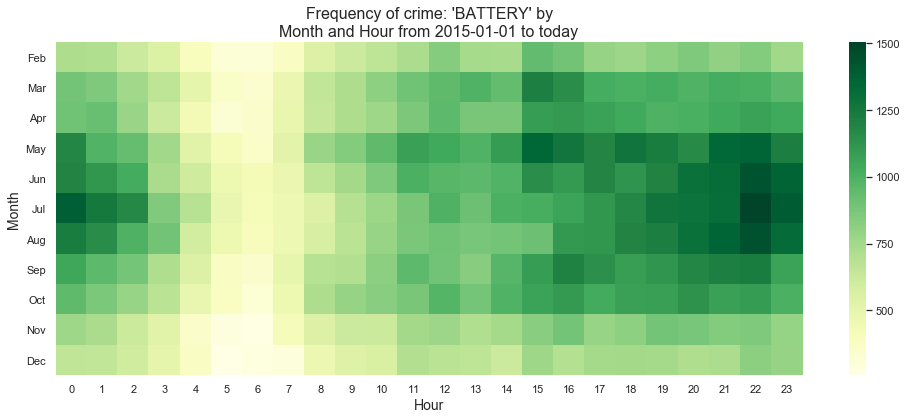

In [27]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

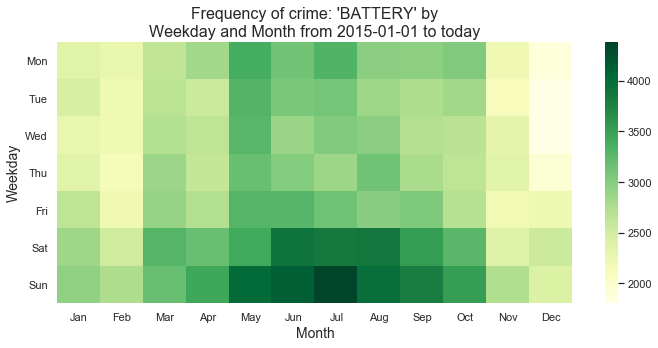

In [28]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

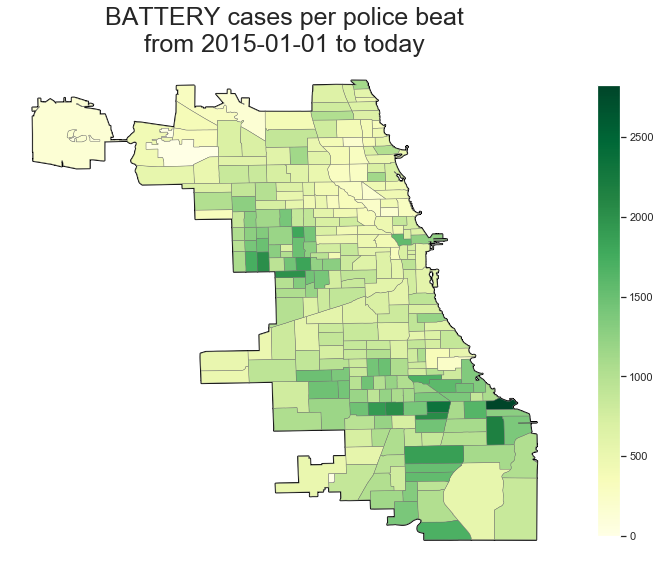

In [29]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## BATTERY: Domestic Battery without weapons or serious physical injury

In [30]:
crime_descr='DOMESTIC BATTERY SIMPLE'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

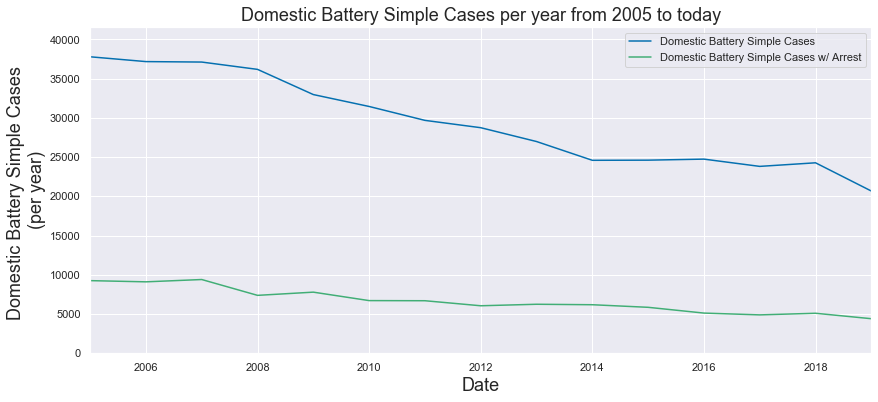

In [31]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

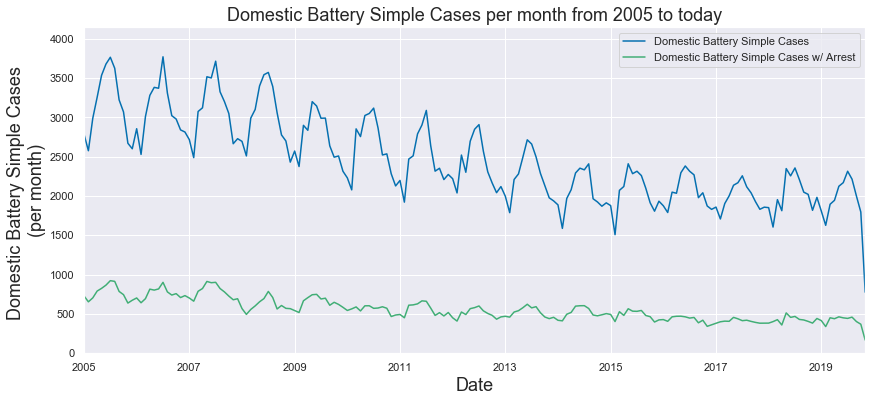

In [32]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

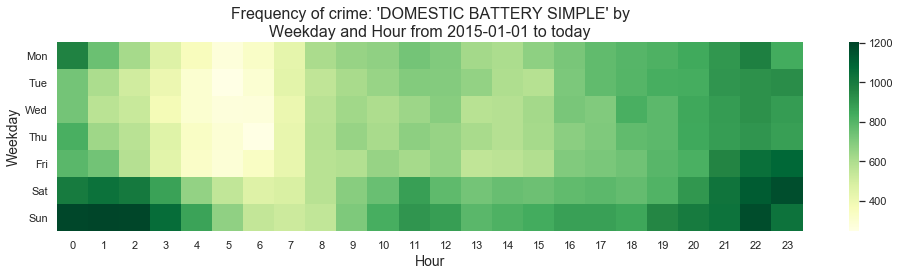

In [33]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

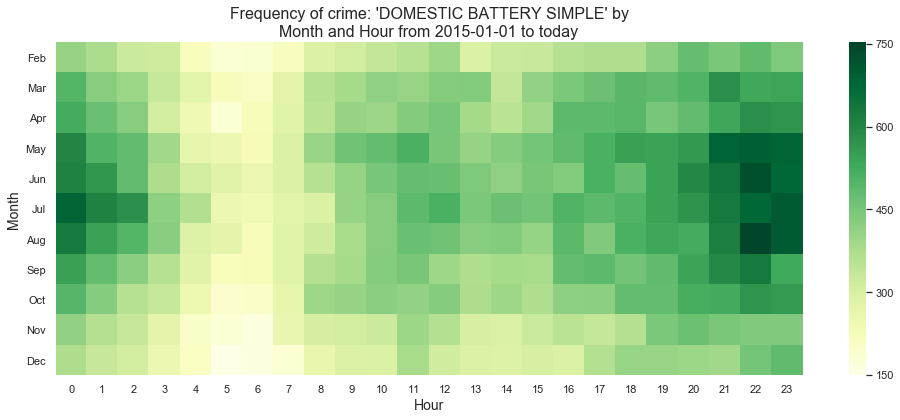

In [34]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

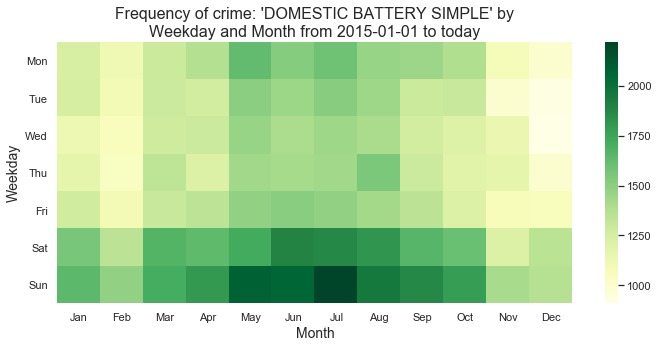

In [35]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

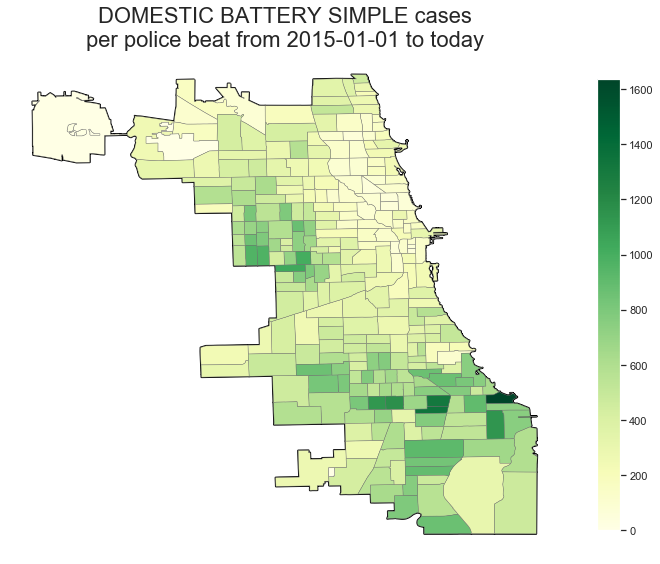

In [36]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## BATTERY: Aggravated Battery with a handgun

In [37]:
crime_descr='AGGRAVATED: HANDGUN'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

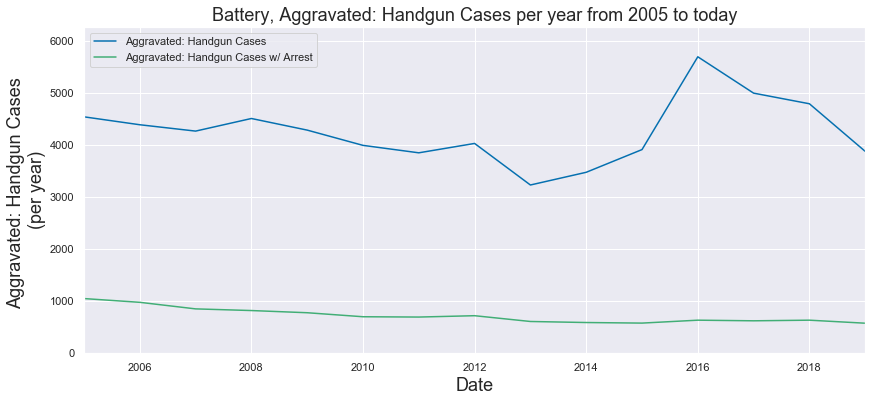

In [38]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', more_label='Battery, ')

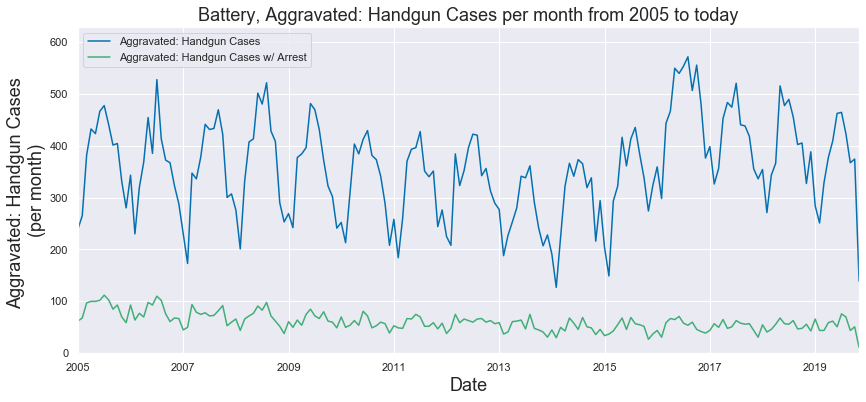

In [39]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', more_label='Battery, ')

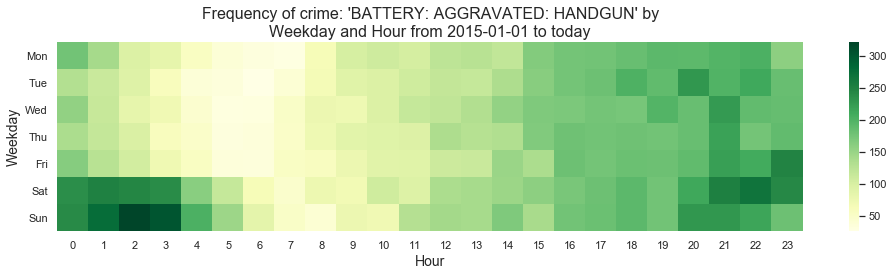

In [40]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='BATTERY: ')

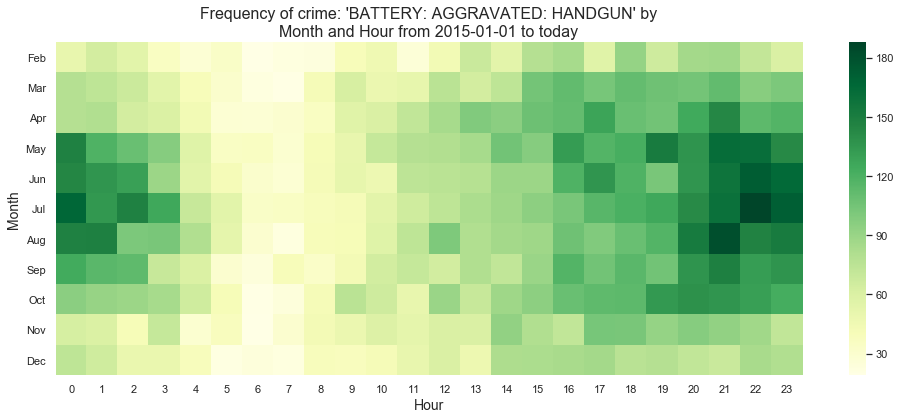

In [41]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='BATTERY: ')

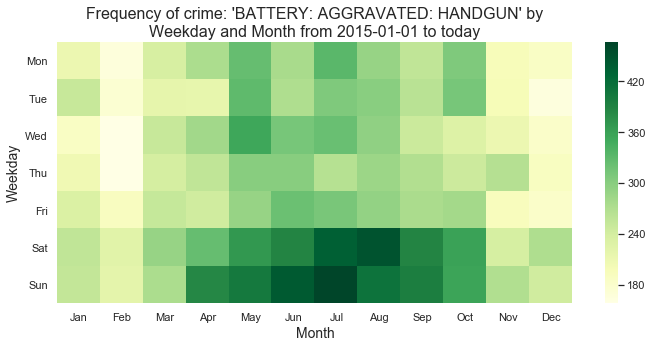

In [42]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='BATTERY: ')

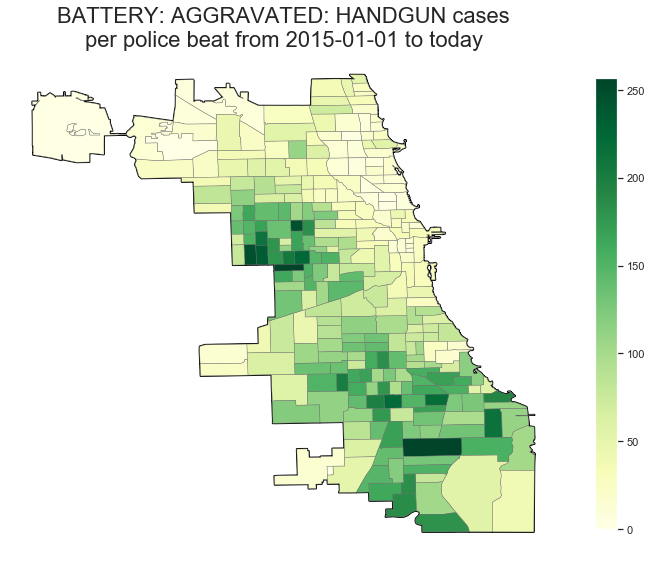

In [43]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='BATTERY: ')

## BATTERY: Aggravated Battery with an other dangerous weapon

In [44]:
crime_descr='AGGRAVATED: OTHER DANG WEAPON'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

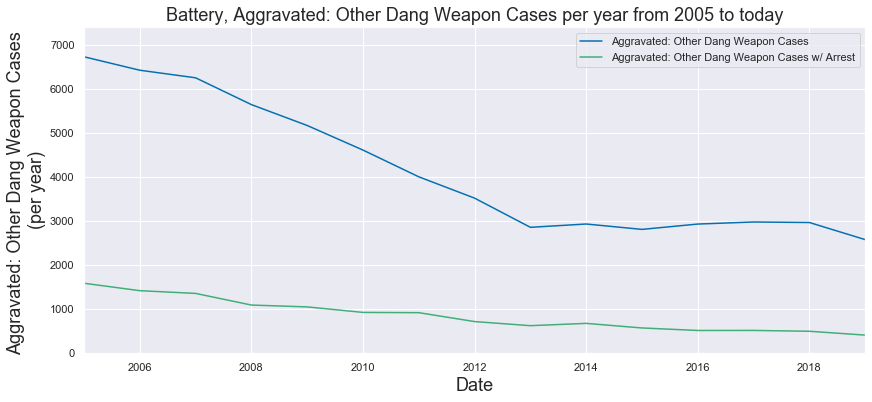

In [45]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', more_label='Battery, ')

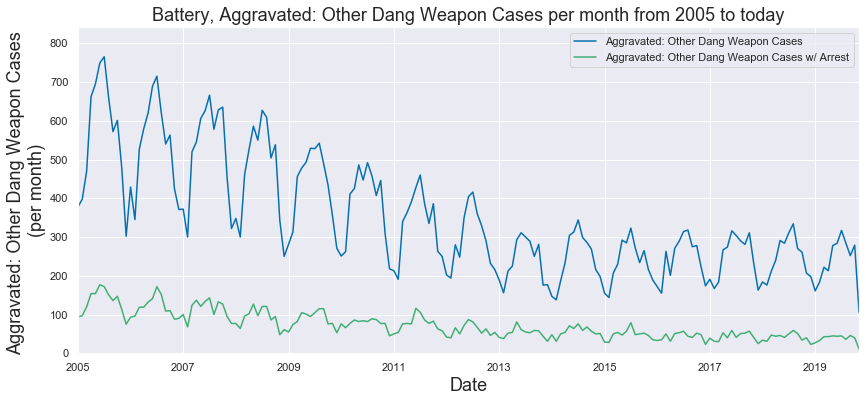

In [46]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', more_label='Battery, ')

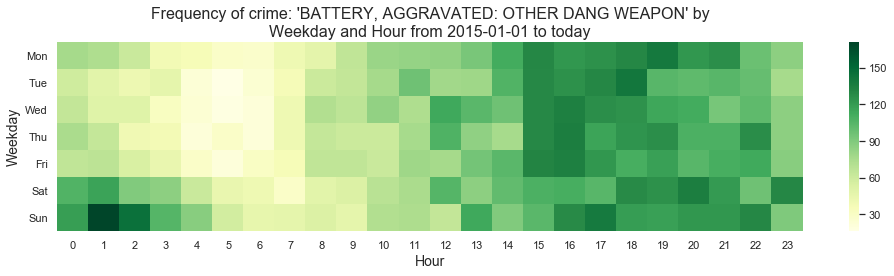

In [47]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='BATTERY, ')

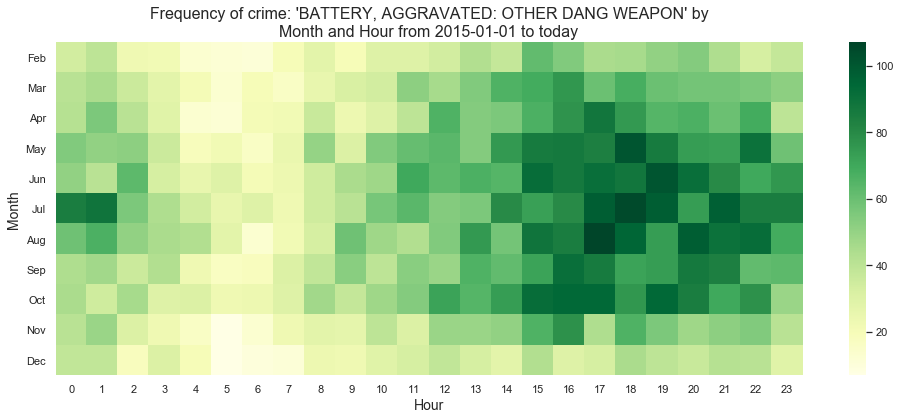

In [48]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='BATTERY, ')

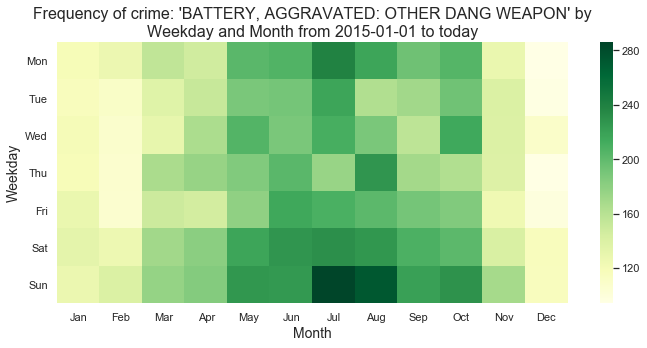

In [49]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='BATTERY, ')

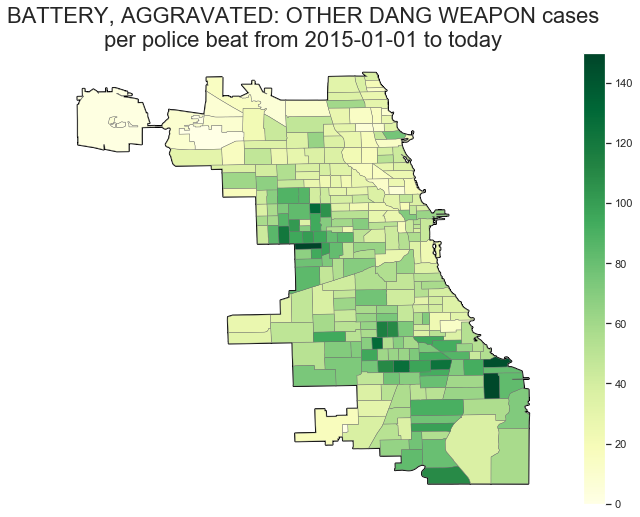

In [50]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='BATTERY, ')

## CRIMINAL SEXUAL ASSAULT: All

In [51]:
crime_descr='CRIM SEXUAL ASSAULT'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [52]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 100) & (query < 1000000)]

NON-AGGRAVATED                   16283
AGGRAVATED: OTHER                 4677
PREDATORY                         2893
AGGRAVATED: HANDGUN               1736
ATTEMPT NON-AGGRAVATED            1310
AGGRAVATED: KNIFE/CUT INSTR       1072
AGGRAVATED: OTHER DANG WEAPON      310
ATTEMPT AGG: OTHER                 257
ATTEMPT AGG: KNIFE/CUT INSTR       177
ATTEMPT AGG: HANDGUN               150
Name: Description, dtype: int64

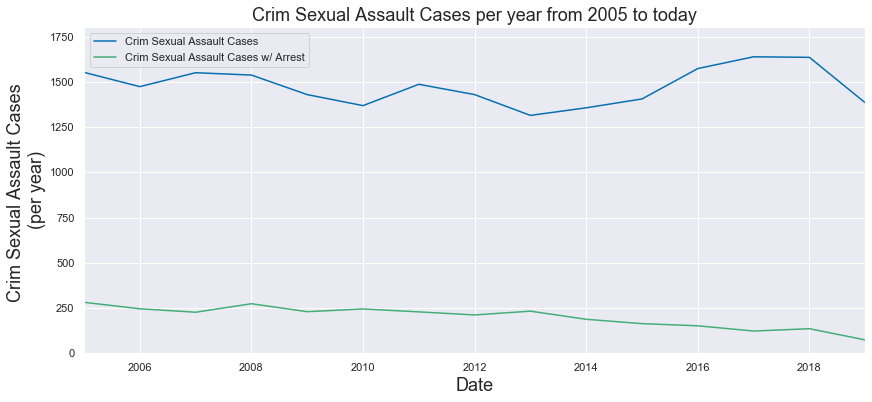

In [53]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

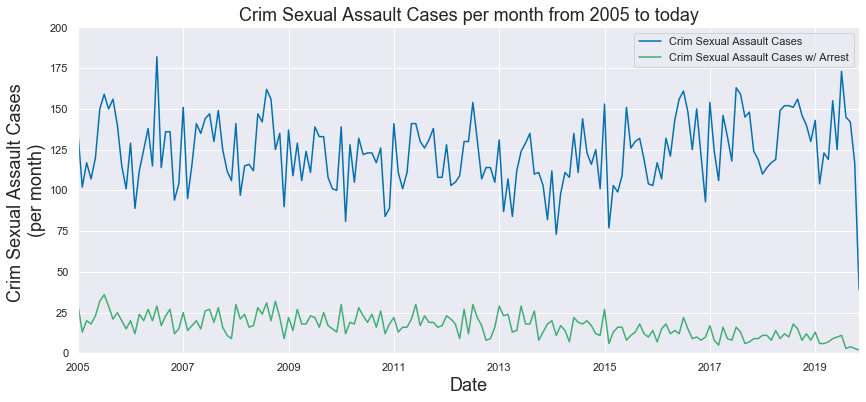

In [54]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

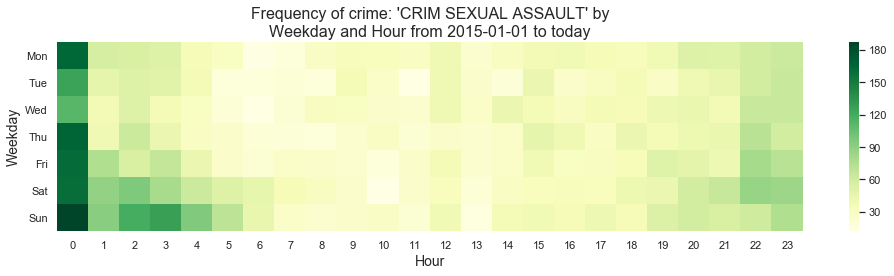

In [55]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

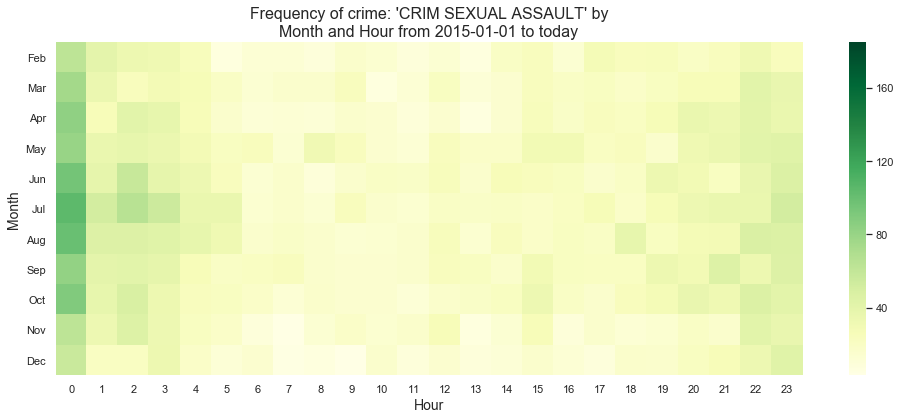

In [56]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

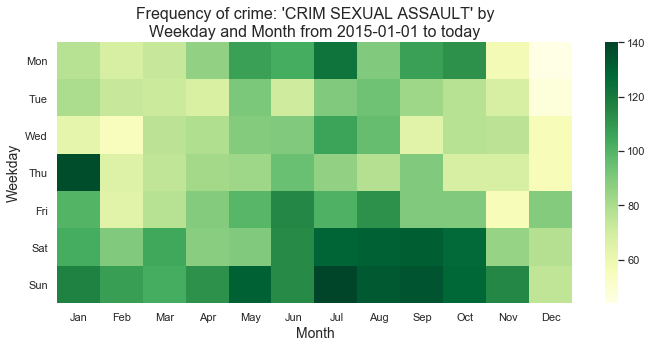

In [57]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

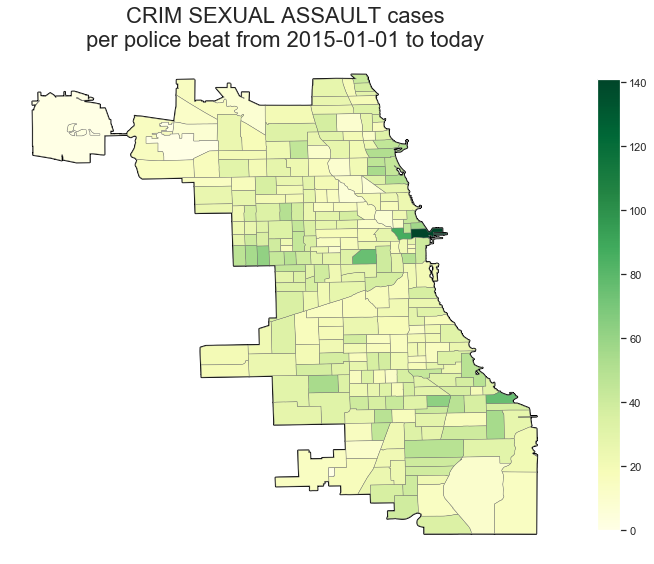

In [58]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## CRIMINAL SEXUAL ASSAULT: Aggravated

In [59]:
crime_descr='AGGRAVATED: OTHER'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

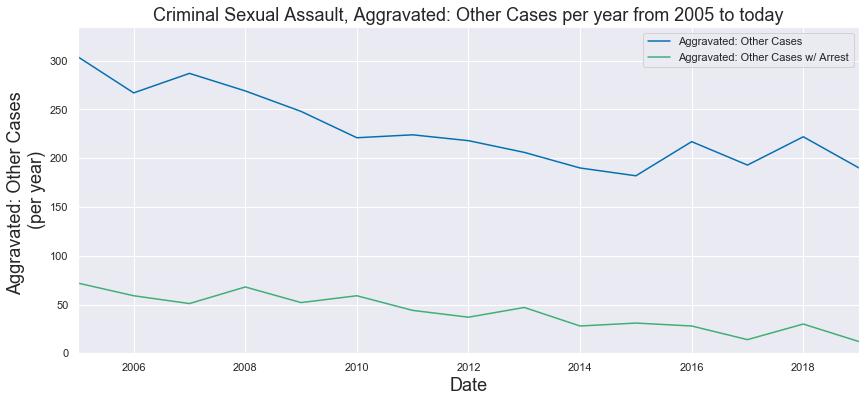

In [60]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', 
            more_label='Criminal Sexual Assault, ')

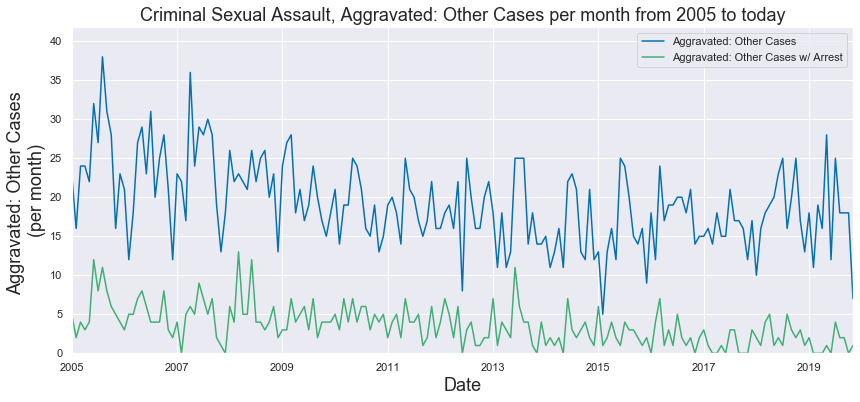

In [61]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', 
            more_label='Criminal Sexual Assault, ')

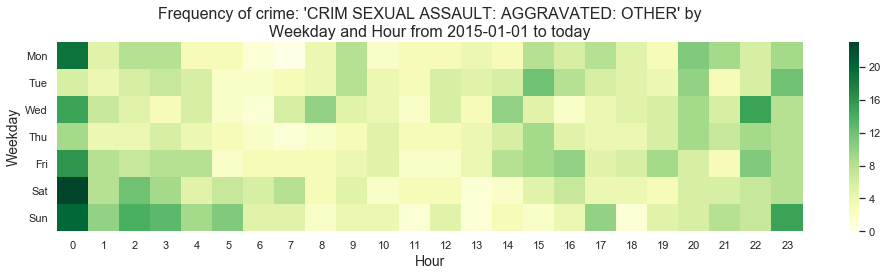

In [62]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='CRIM SEXUAL ASSAULT: ')

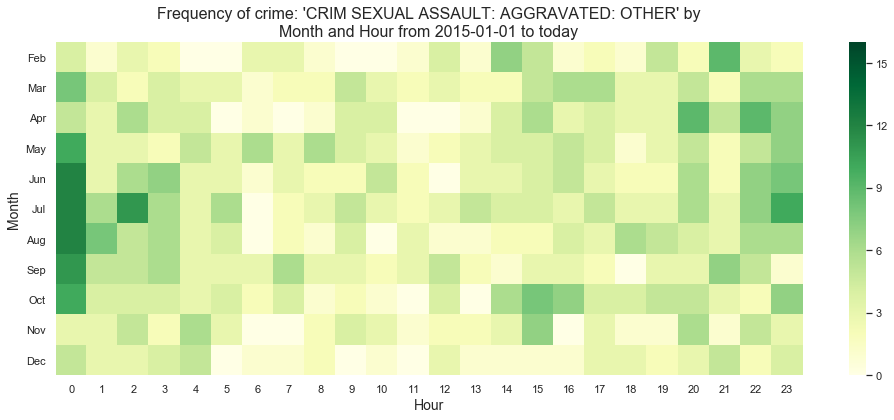

In [63]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='CRIM SEXUAL ASSAULT: ')

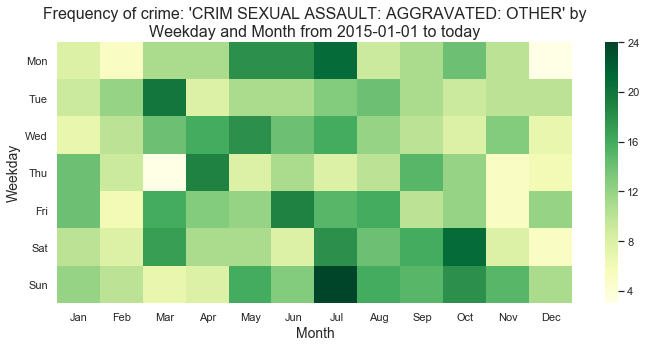

In [64]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='CRIM SEXUAL ASSAULT: ')

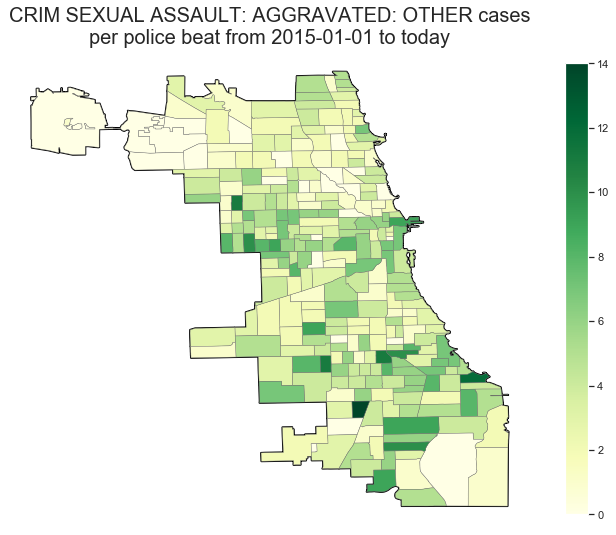

In [65]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='CRIM SEXUAL ASSAULT: ', title_fs=20)

## CRIMINAL SEXUAL ASSAULT: Predatory (Victim age <= 13, offender age >= 17)

In [66]:
crime_descr='PREDATORY'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

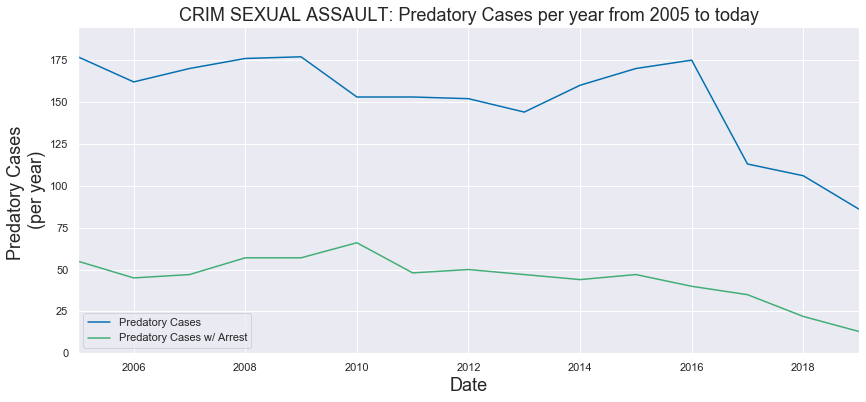

In [67]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', 
            more_label='CRIM SEXUAL ASSAULT: ')

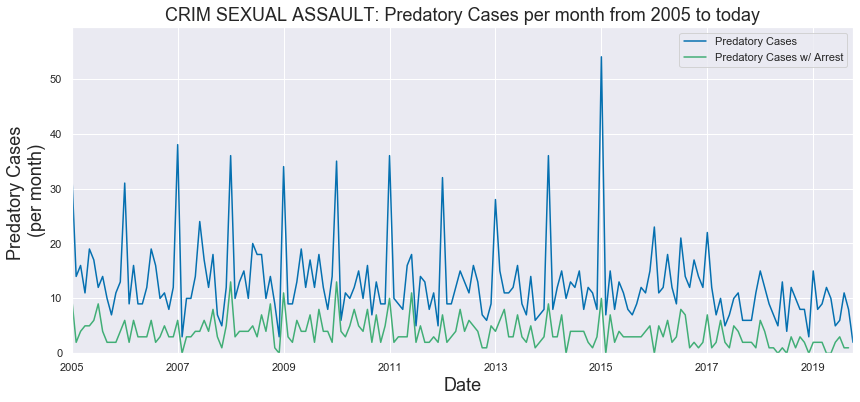

In [68]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', 
            more_label='CRIM SEXUAL ASSAULT: ')

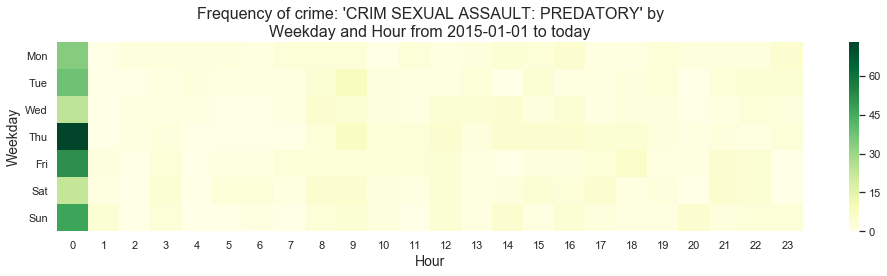

In [69]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='CRIM SEXUAL ASSAULT: ')

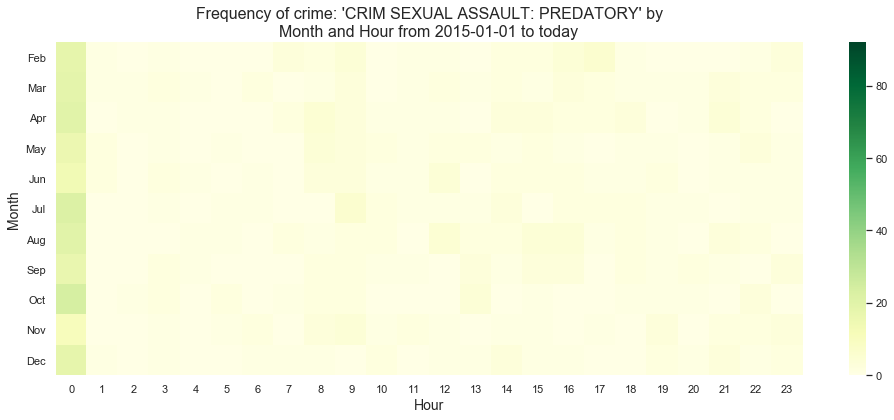

In [70]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='CRIM SEXUAL ASSAULT: ')

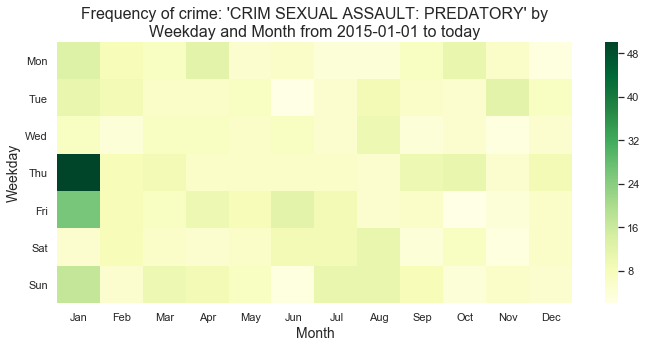

In [71]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='CRIM SEXUAL ASSAULT: ')

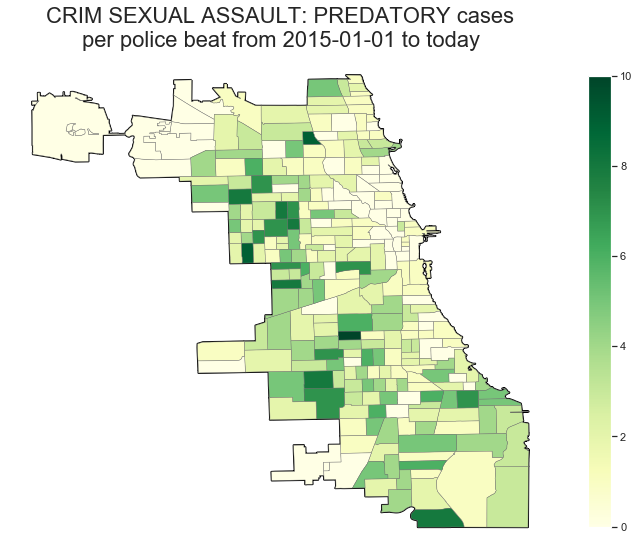

In [72]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='CRIM SEXUAL ASSAULT: ')

## OFFENSE INVOLVING CHILDREN: All

In [73]:
crime_descr='OFFENSE INVOLVING CHILDREN'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [74]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 100) & (query < 1000000)]

CHILD ABUSE                             14432
OTHER OFFENSE                            9317
ENDANGERING LIFE/HEALTH CHILD            7026
CHILD ABDUCTION                          3687
AGG CRIM SEX ABUSE FAM MEMBER            3591
AGG SEX ASSLT OF CHILD FAM MBR           3044
CRIM SEX ABUSE BY FAM MEMBER             2208
SEX ASSLT OF CHILD BY FAM MBR            1536
CHILD PORNOGRAPHY                        1121
CHILD ABANDONMENT                         872
CONTRIBUTE DELINQUENCY OF A CHILD         600
HARBOR RUNAWAY                            257
CONTRIBUTE CRIM DELINQUENCY JUVENILE      130
Name: Description, dtype: int64

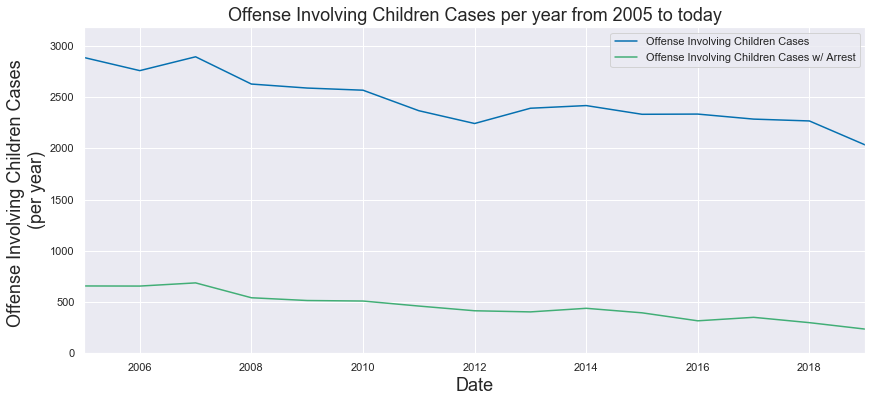

In [75]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

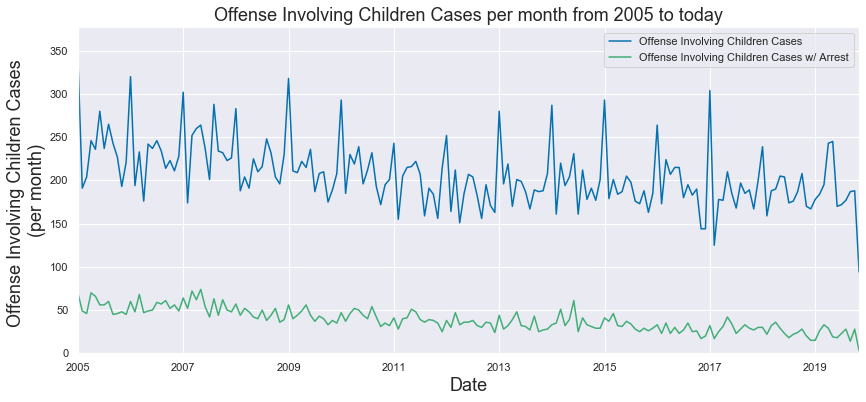

In [76]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

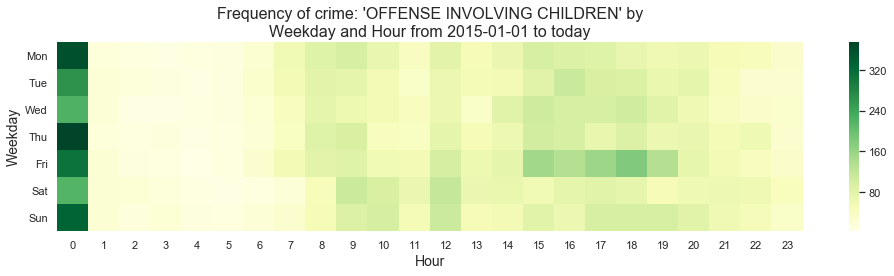

In [77]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

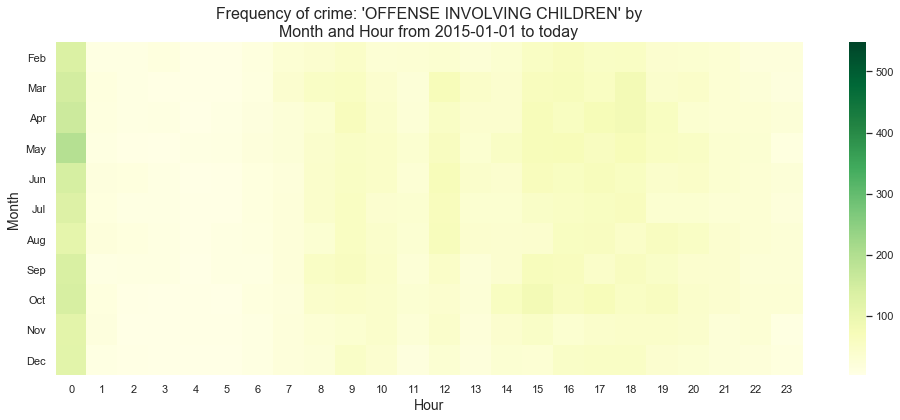

In [78]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

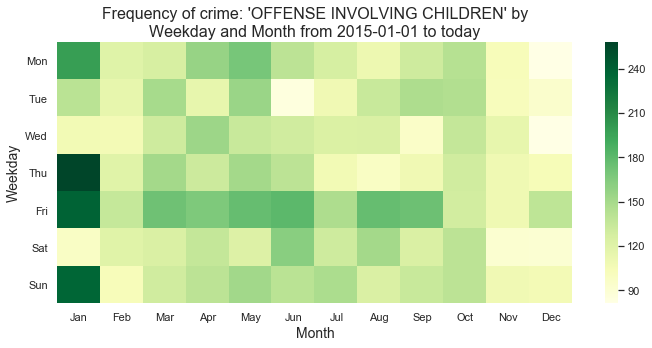

In [79]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

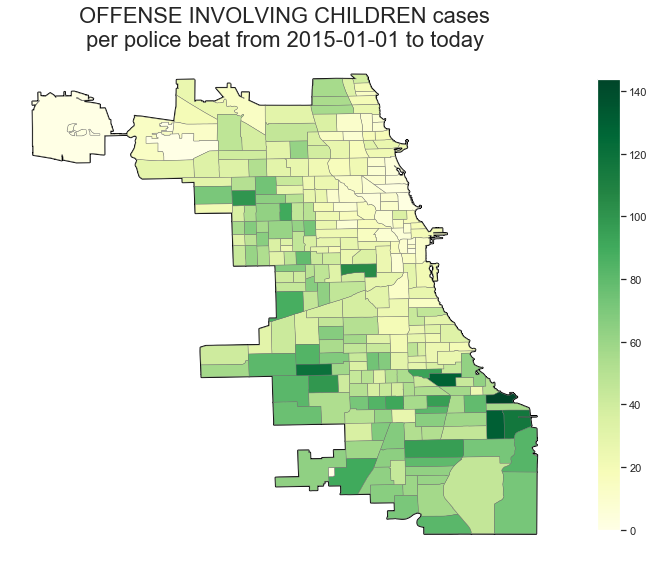

In [80]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## OFFENSE INVOLVING CHILDREN: Aggravated criminal sexual abuse by a family member

In [81]:
crime_descr='AGG CRIM SEX ABUSE FAM MEMBER'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

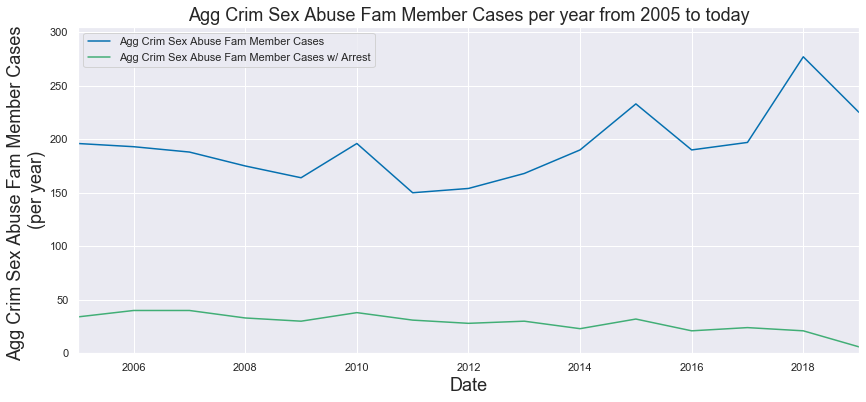

In [82]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

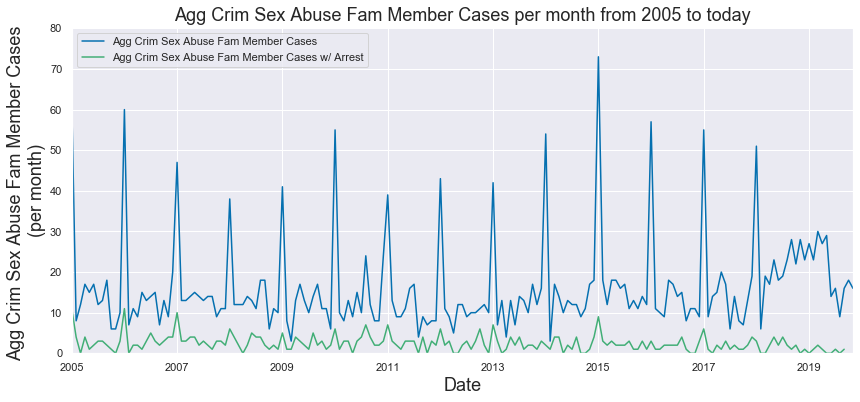

In [83]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

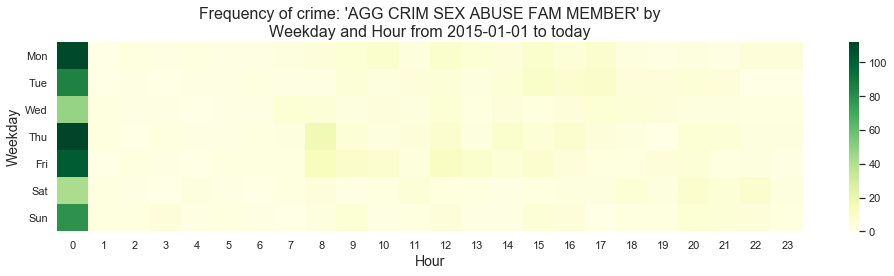

In [84]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

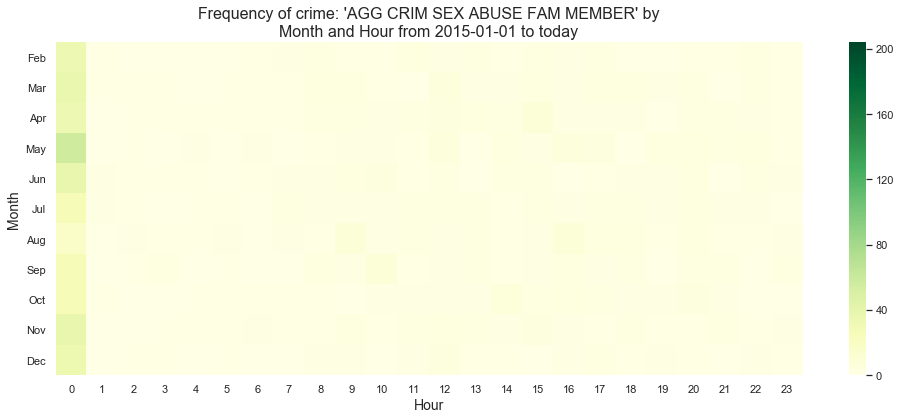

In [85]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

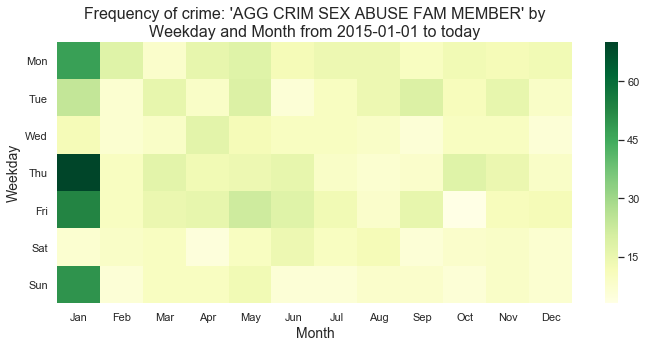

In [86]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

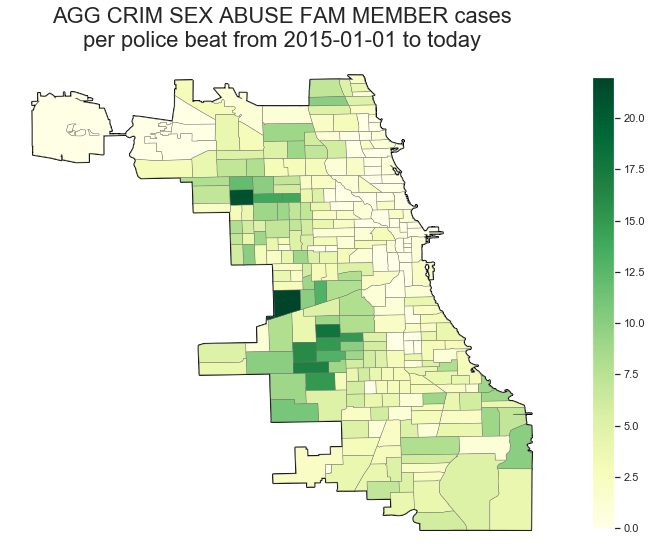

In [87]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## WEAPONS VIOLATIONS: All

In [88]:
crime_descr='WEAPONS VIOLATION'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [89]:
# Number of Weapons Violation Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 0) & (query < 1000000)]

UNLAWFUL POSS OF HANDGUN                       51074
UNLAWFUL USE OTHER DANG WEAPON                  8581
UNLAWFUL USE HANDGUN                            4038
RECKLESS FIREARM DISCHARGE                      3083
UNLAWFUL POSS OTHER FIREARM                     2821
UNLAWFUL USE/SALE AIR RIFLE                     2452
POSS FIREARM/AMMO:NO FOID CARD                  2087
UNLAWFUL POSS AMMUNITION                        1579
UNLAWFUL USE OTHER FIREARM                       696
UNLAWFUL SALE HANDGUN                            225
UNLAWFUL SALE/DELIVERY OF FIREARM AT SCHOOL      153
UNLAWFUL SALE OTHER FIREARM                       89
DEFACE IDENT MARKS OF FIREARM                     38
REGISTER OF SALES BY DEALER                        5
USE OF METAL PIERCING BULLETS                      4
Name: Description, dtype: int64

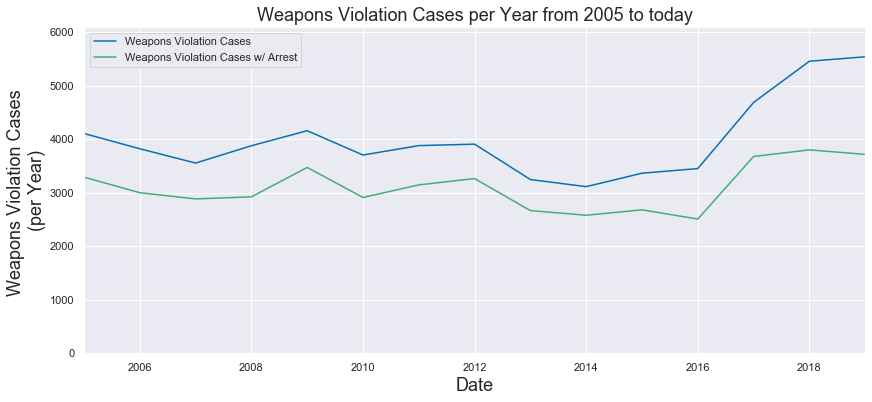

In [90]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Year', start_date='2005')

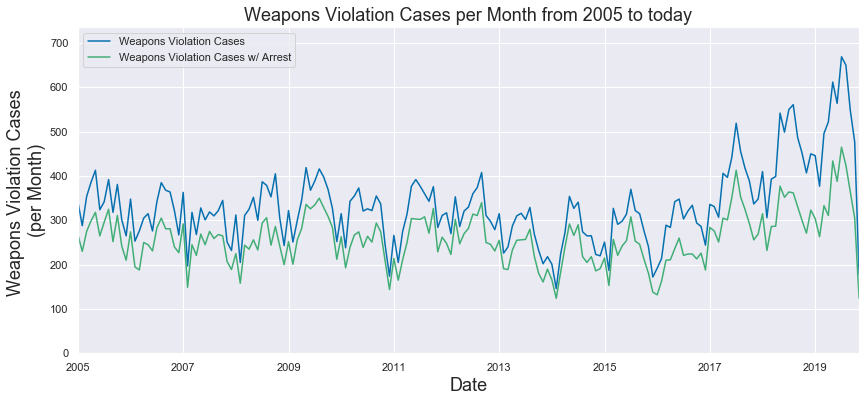

In [91]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Month', start_date='2005')

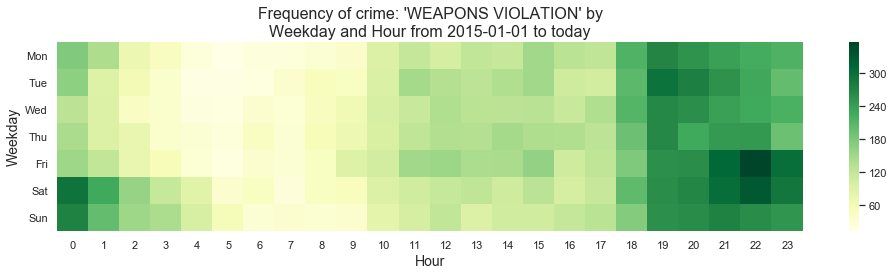

In [92]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

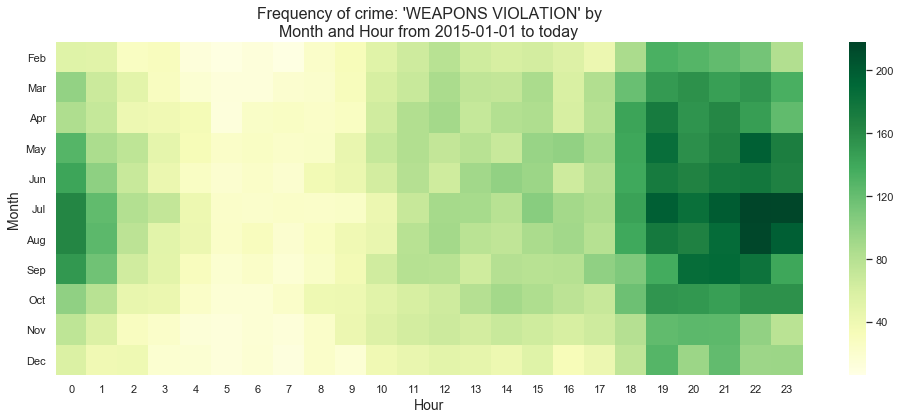

In [93]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

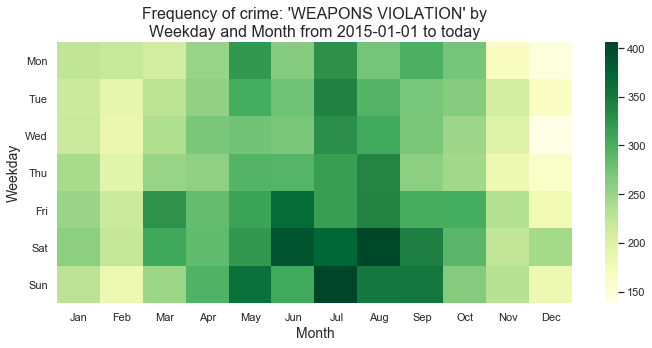

In [94]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

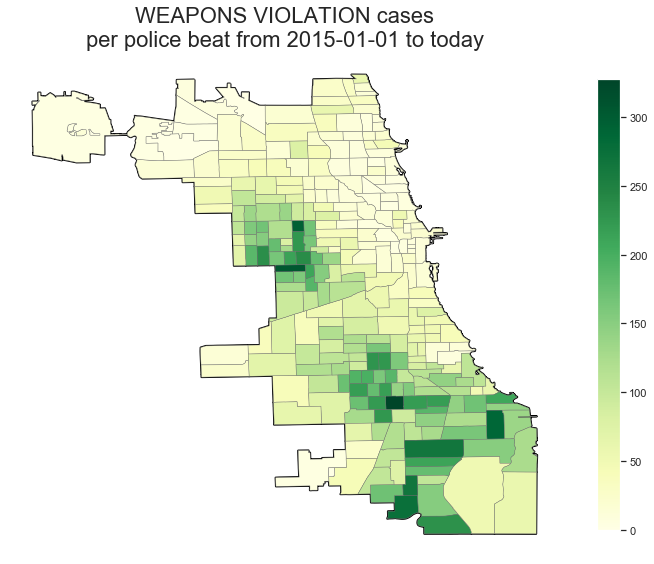

In [95]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## Weapons Violation: Unlawful Possession of a Handgun

In [96]:
crime_descr='UNLAWFUL POSS OF HANDGUN'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

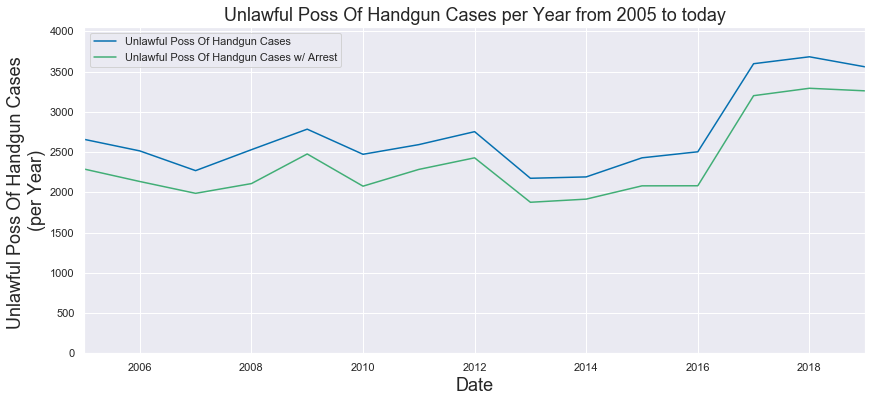

In [97]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Year', start_date='2005')

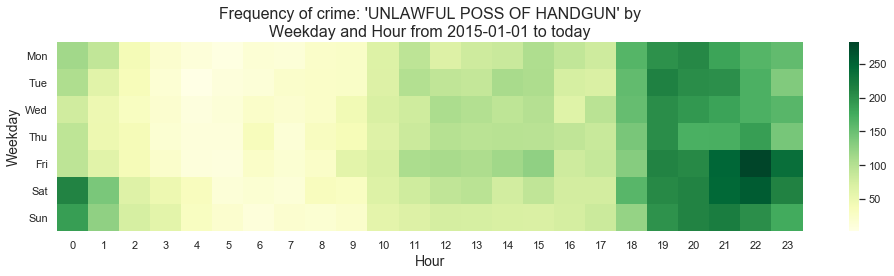

In [98]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

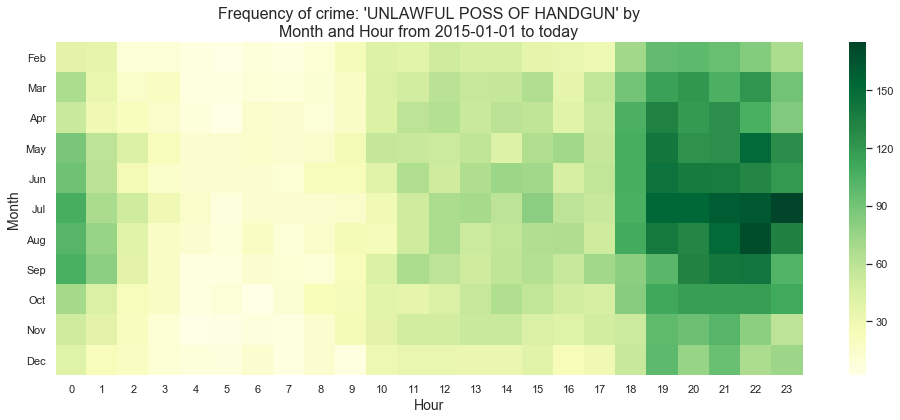

In [99]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

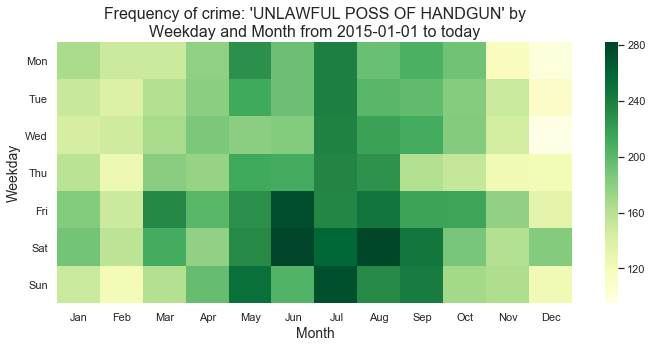

In [100]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

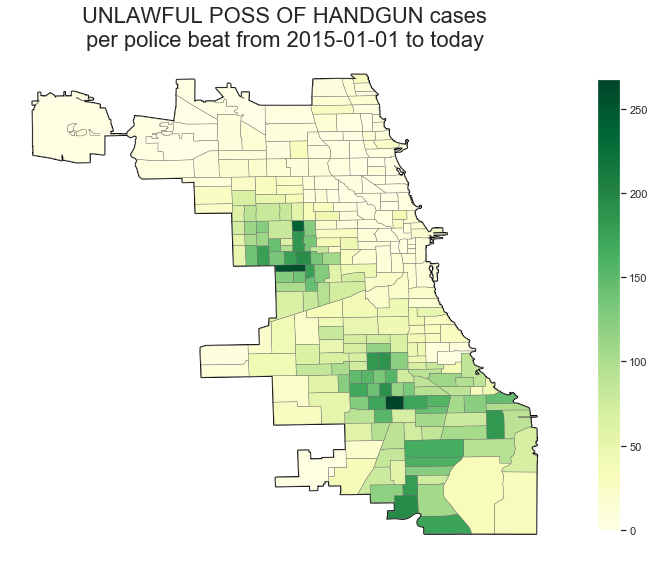

In [101]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## Weapons Violation: Unlawful use of a dangerous (non-handgun) weapon

In [102]:
crime_descr='UNLAWFUL USE OTHER DANG WEAPON'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

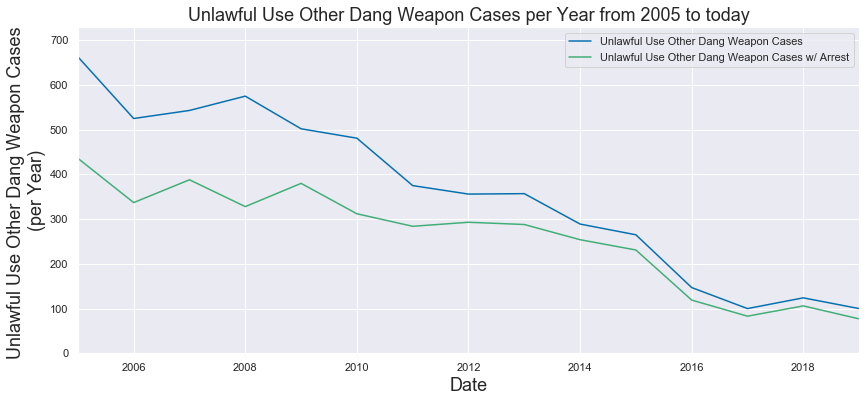

In [103]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Year', start_date='2005')

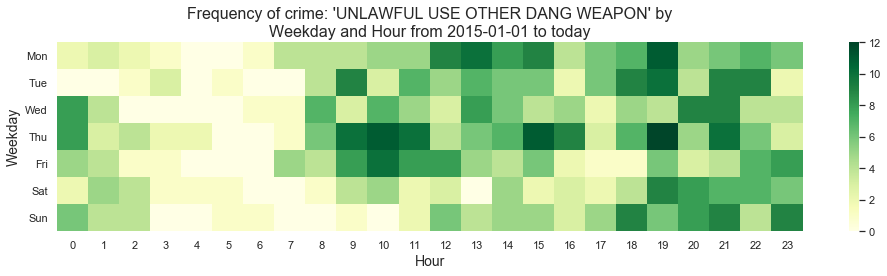

In [104]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

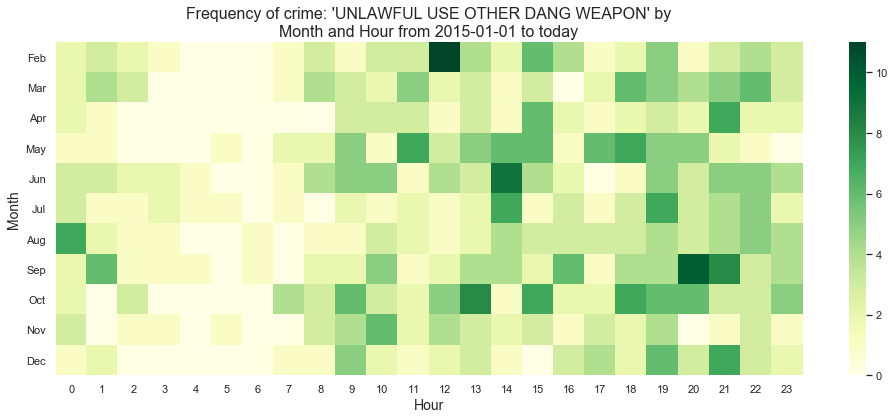

In [105]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

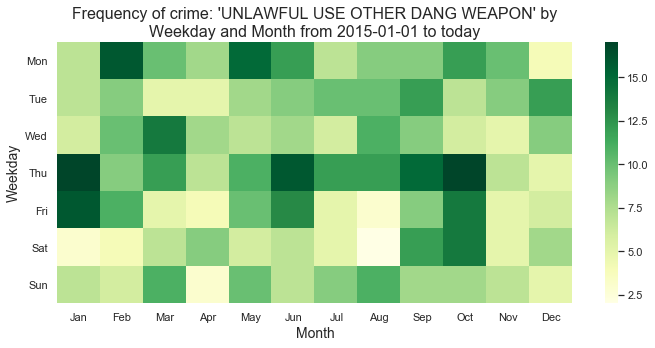

In [106]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

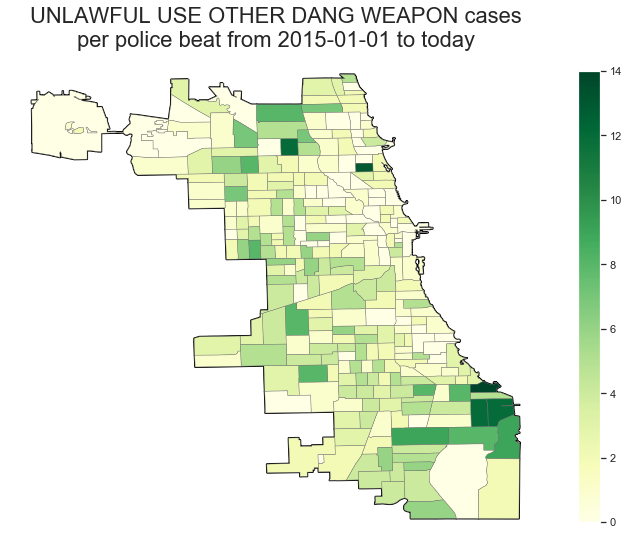

In [107]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## Weapons Violation: Unlawful use of a handgun

In [108]:
crime_descr='UNLAWFUL USE HANDGUN'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

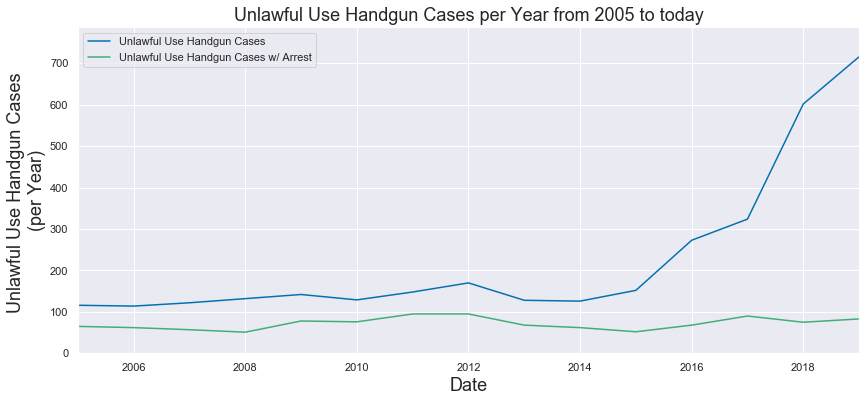

In [109]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Year', start_date='2005')

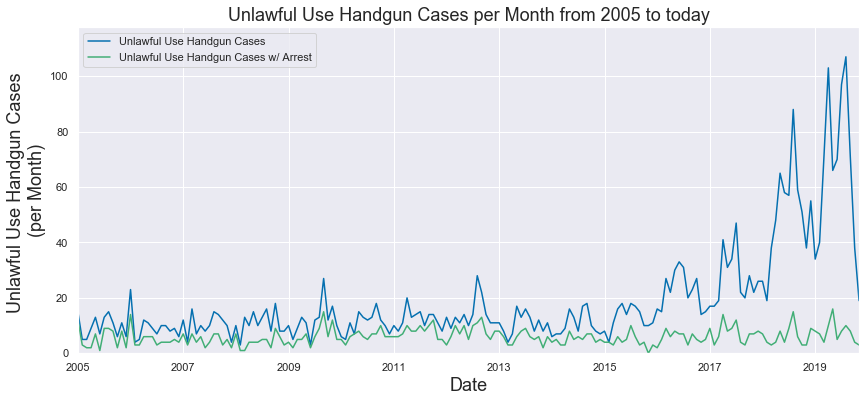

In [110]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='Month', start_date='2005')

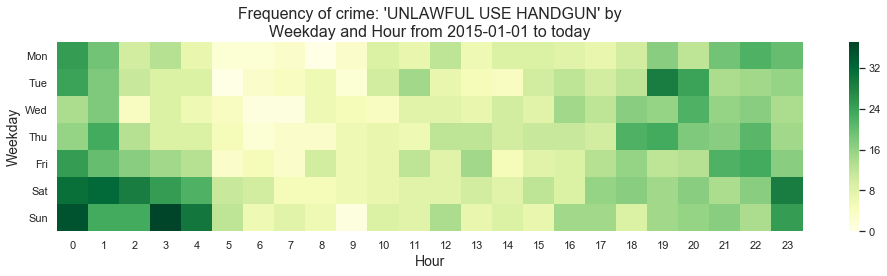

In [111]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

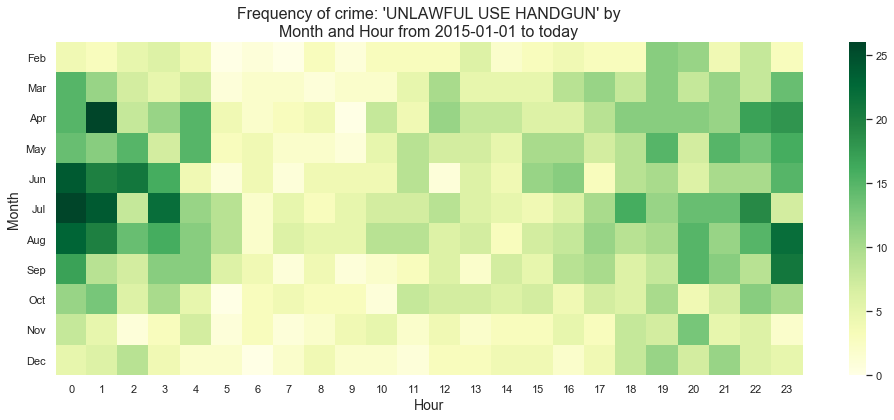

In [112]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

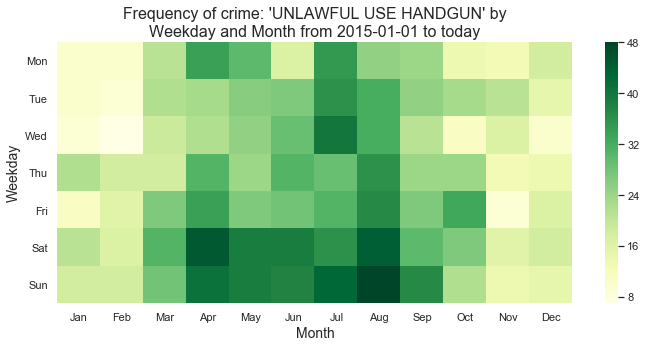

In [113]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

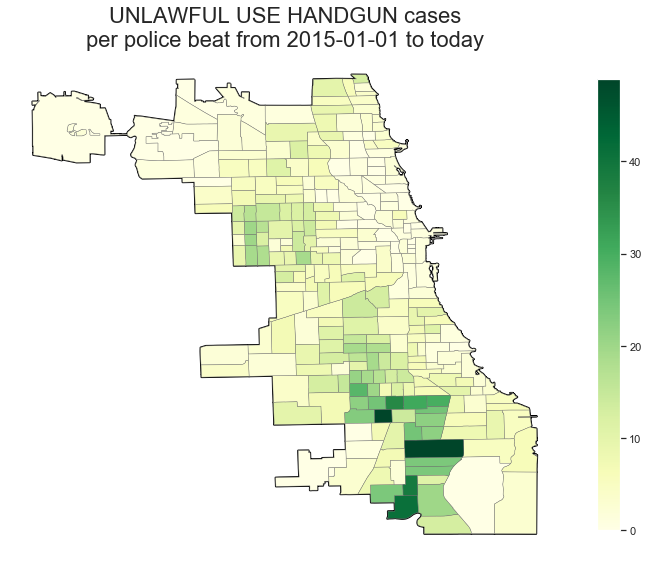

In [114]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## ROBBERY: All

In [115]:
crime_descr='ROBBERY'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [116]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

ARMED: HANDGUN                    93293
STRONGARM - NO WEAPON             91525
AGGRAVATED                        13248
ARMED: OTHER DANGEROUS WEAPON     12944
ARMED:KNIFE/CUTTING INSTRUMENT    12201
ATTEMPT: STRONGARM-NO WEAPON      10178
AGGRAVATED VEHICULAR HIJACKING     9801
ATTEMPT: ARMED-HANDGUN             8502
VEHICULAR HIJACKING                5239
ATTEMPT: ARMED-KNIFE/CUT INSTR     2231
ATTEMPT: ARMED-OTHER DANG WEAP     2039
ARMED: OTHER FIREARM               1366
ATTEMPT: AGGRAVATED                 975
Name: Description, dtype: int64

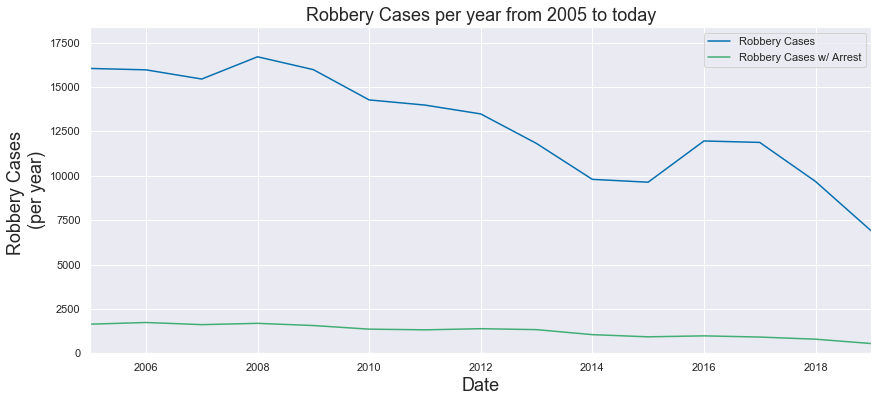

In [117]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

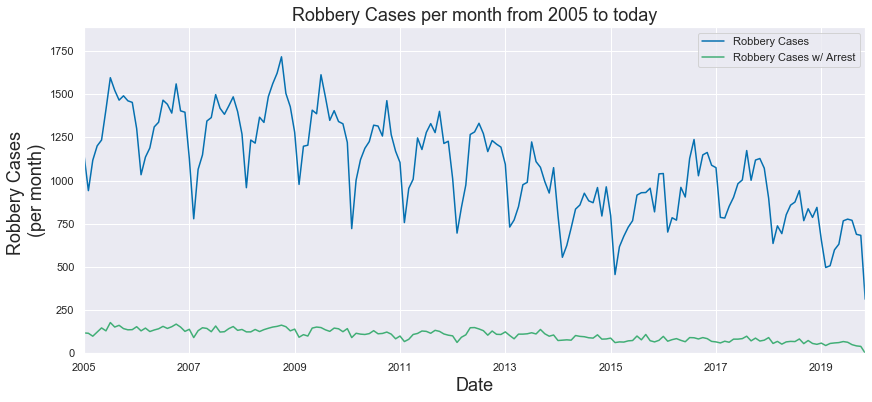

In [118]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

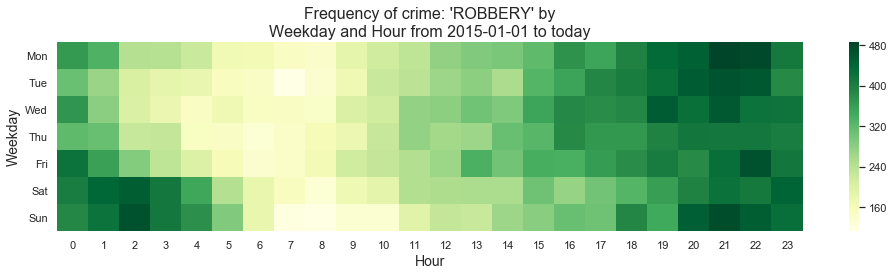

In [119]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

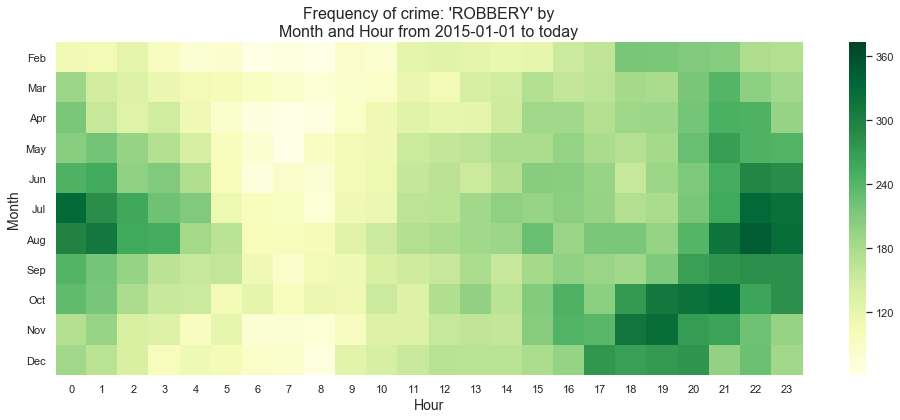

In [120]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

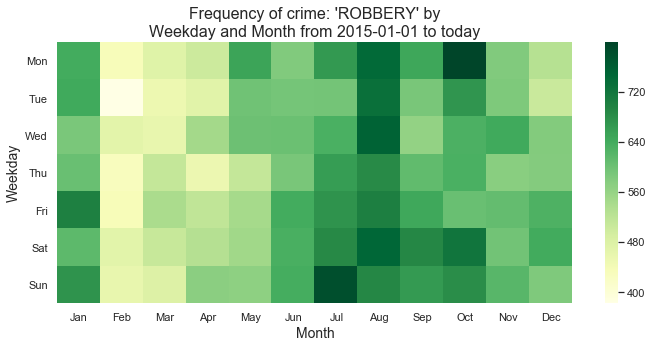

In [121]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

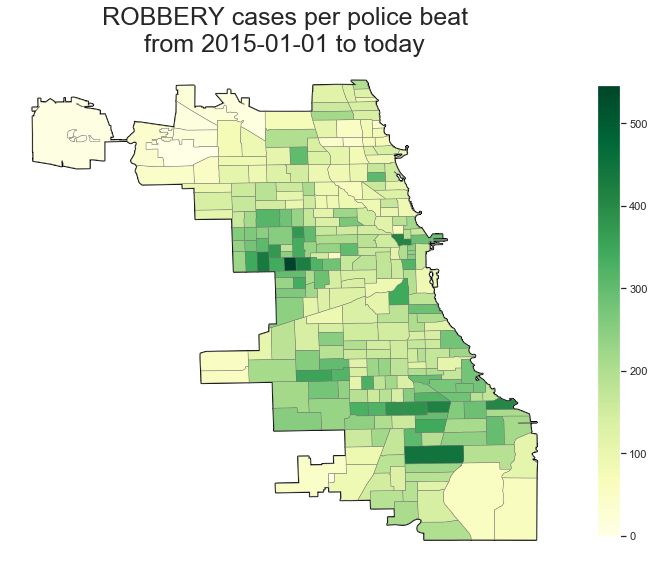

In [122]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## ROBBERY: Armed with a handgun

In [123]:
crime_descr='ARMED: HANDGUN'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

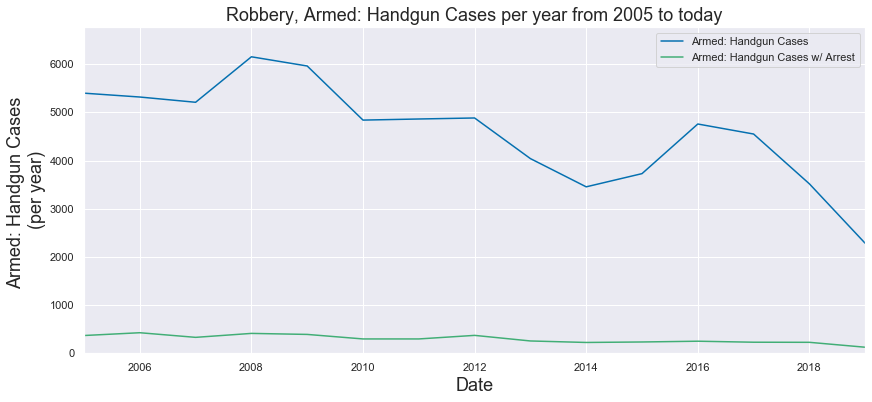

In [128]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', 
            more_label='Robbery, ')

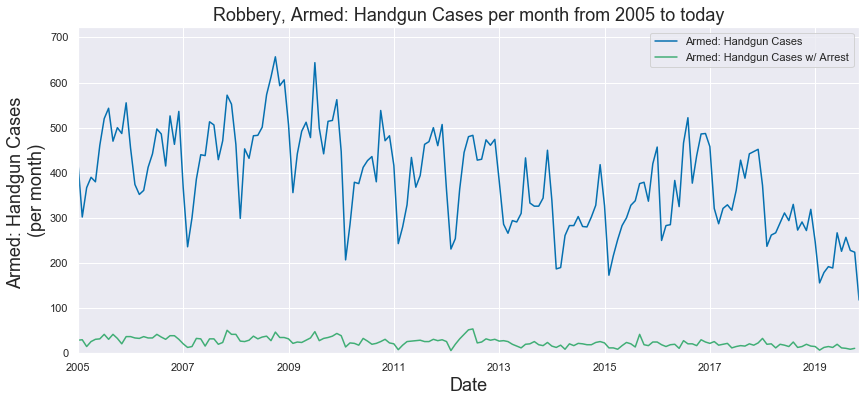

In [129]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', 
            more_label='Robbery, ')

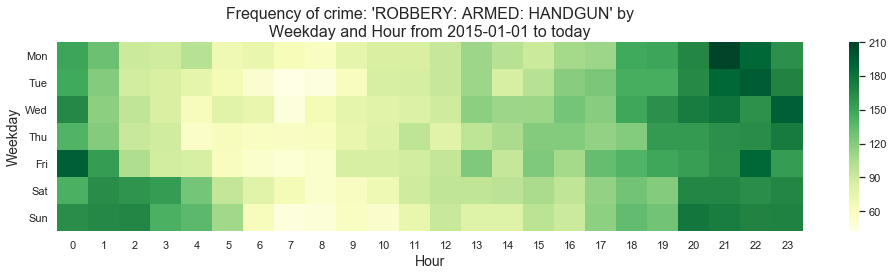

In [130]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='ROBBERY: ')

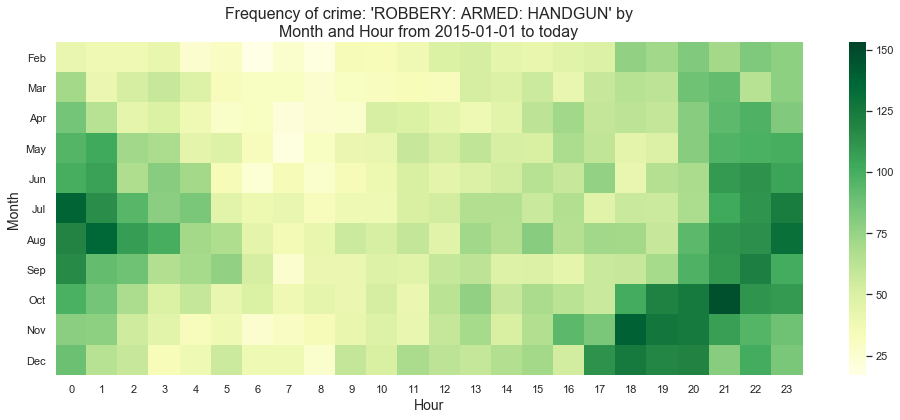

In [131]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='ROBBERY: ')

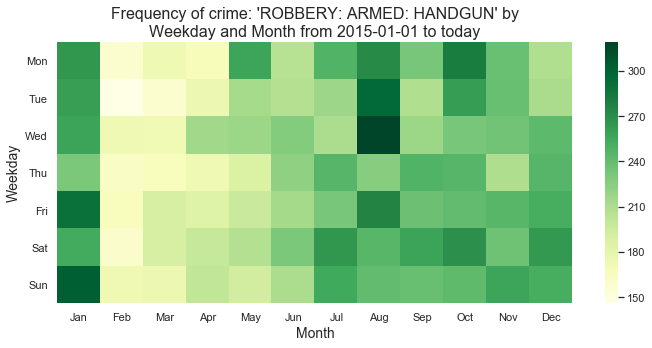

In [132]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='ROBBERY: ')

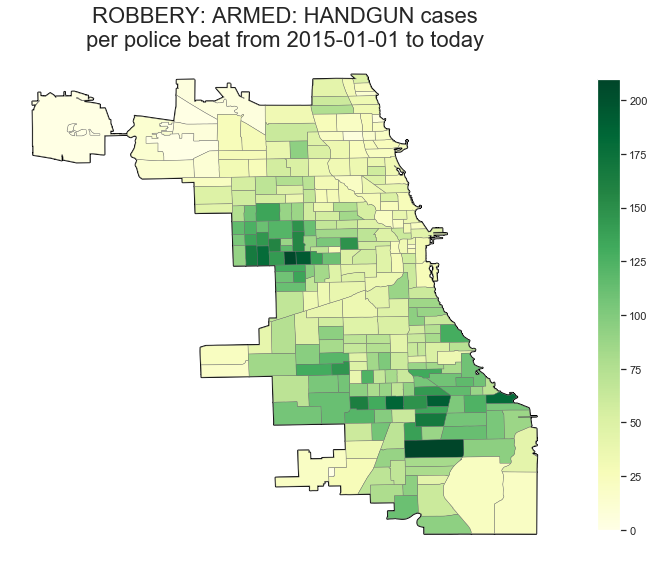

In [133]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='ROBBERY: ')

## ROBBERY: Strongarm

In [135]:
crime_descr='STRONGARM - NO WEAPON'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

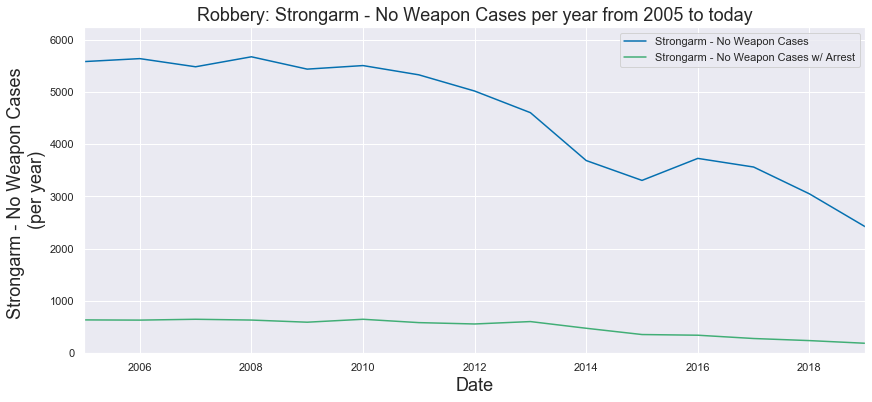

In [136]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', more_label='Robbery: ')

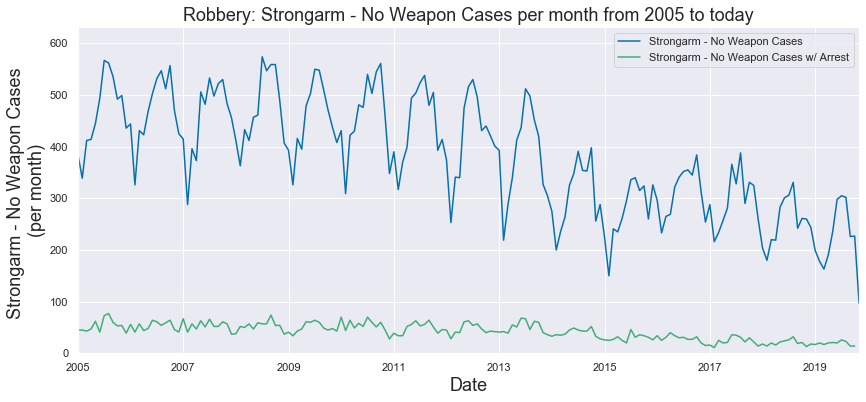

In [137]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', more_label='Robbery: ')

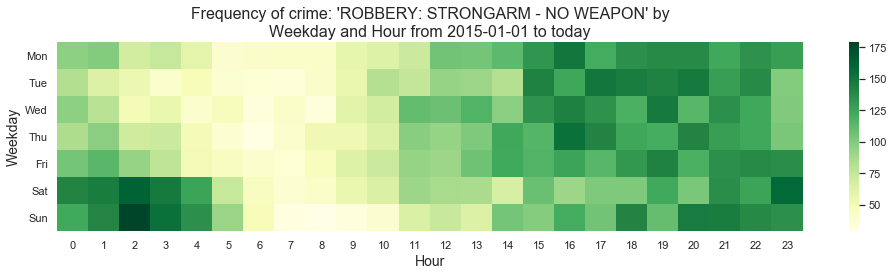

In [138]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='ROBBERY: ')

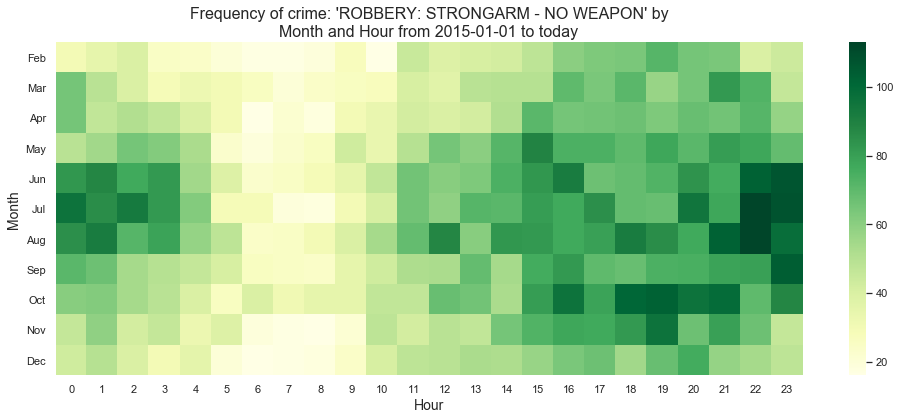

In [139]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='ROBBERY: ')

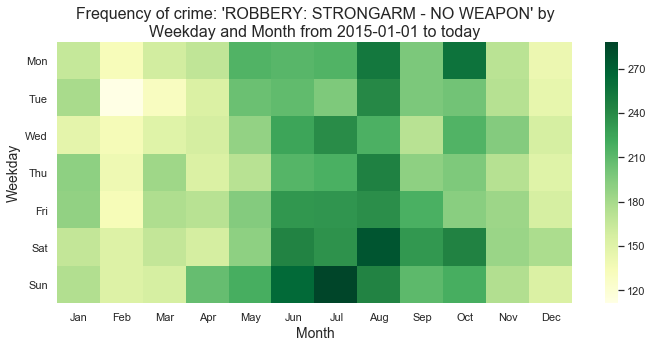

In [140]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='ROBBERY: ')

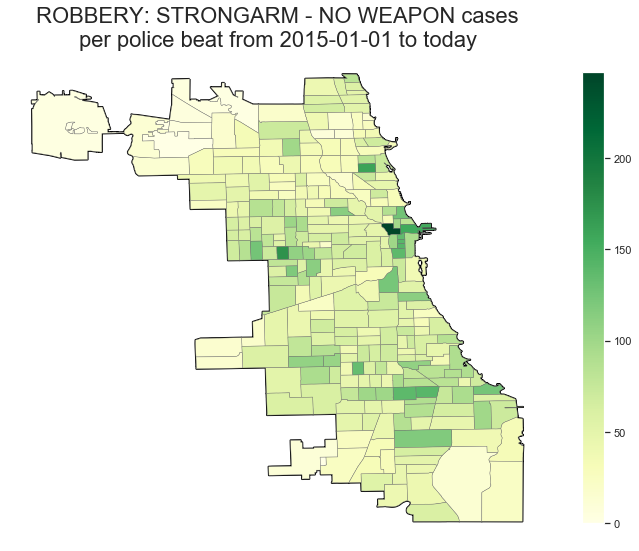

In [142]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='ROBBERY: ', title_fs=22)

## ROBBERY: Aggravated Vehicular Hijacking 

In [143]:
crime_descr='AGGRAVATED VEHICULAR HIJACKING'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

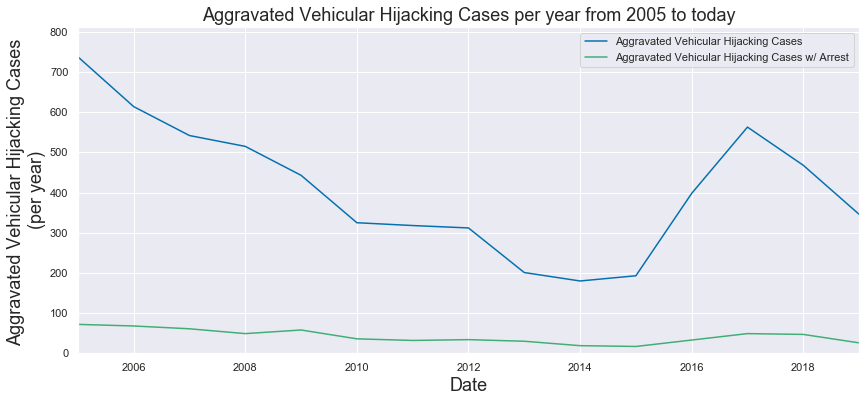

In [144]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

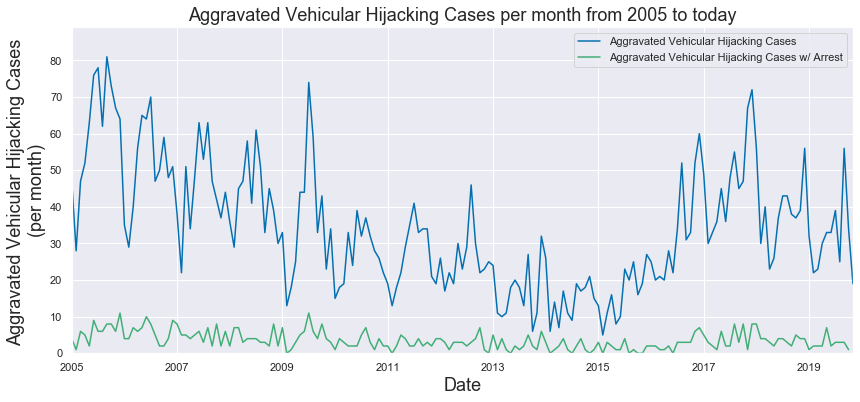

In [145]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

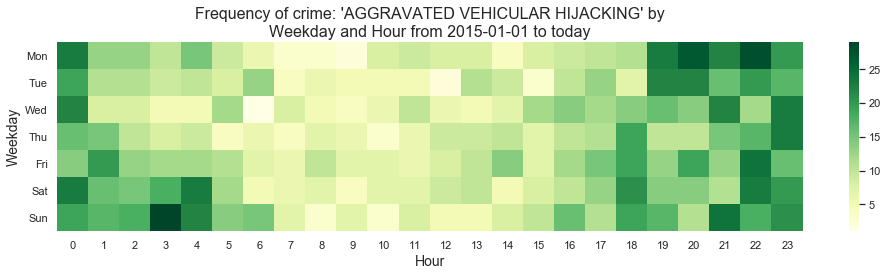

In [146]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

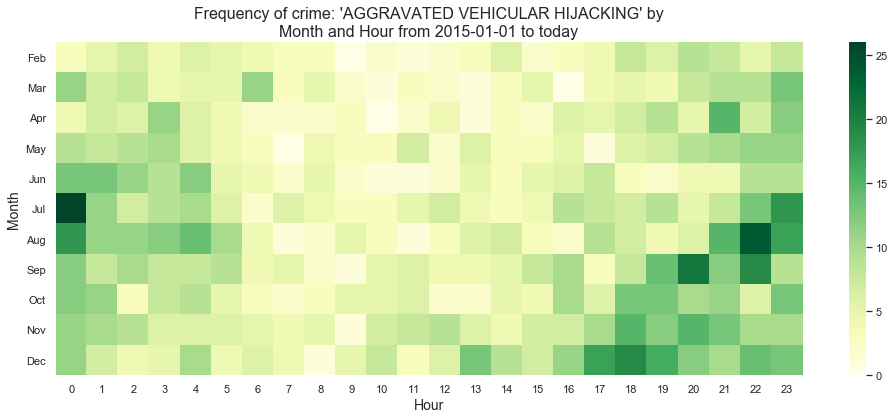

In [147]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

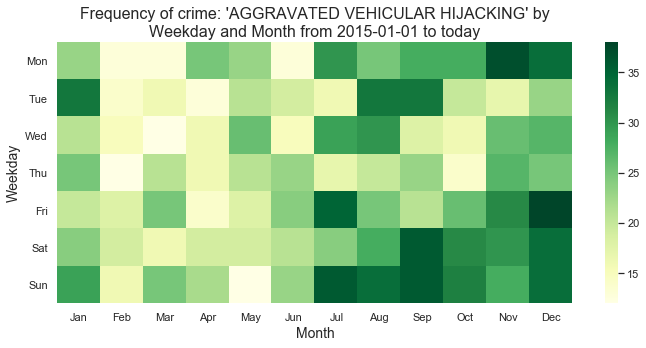

In [148]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

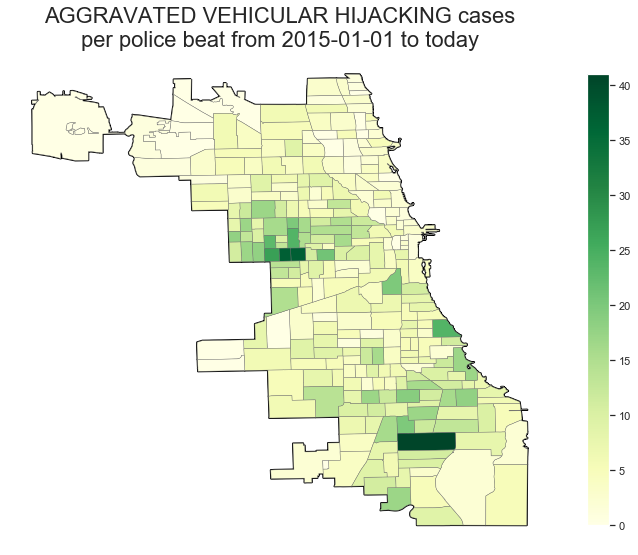

In [149]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## MOTOR VEHICLE THEFT: All

Motor vehicle theft is often a precursor to a shooting, as the vehicle is used in the shooting and then discarded.

In [150]:
crime_descr='MOTOR VEHICLE THEFT'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [151]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

AUTOMOBILE                         254297
TRUCK, BUS, MOTOR HOME              24717
THEFT/RECOVERY: AUTOMOBILE          23167
ATT: AUTOMOBILE                     11601
CYCLE, SCOOTER, BIKE W-VIN           5196
THEFT/RECOVERY: TRUCK,BUS,MHOME      2822
ATT: TRUCK, BUS, MOTOR HOME          1156
Name: Description, dtype: int64

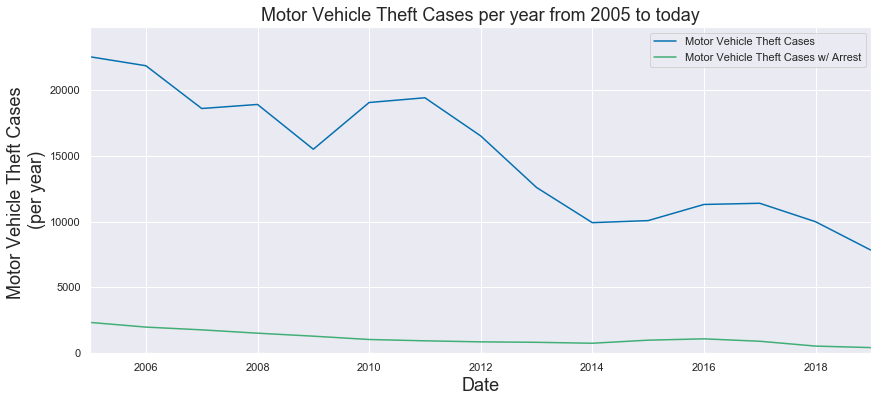

In [152]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

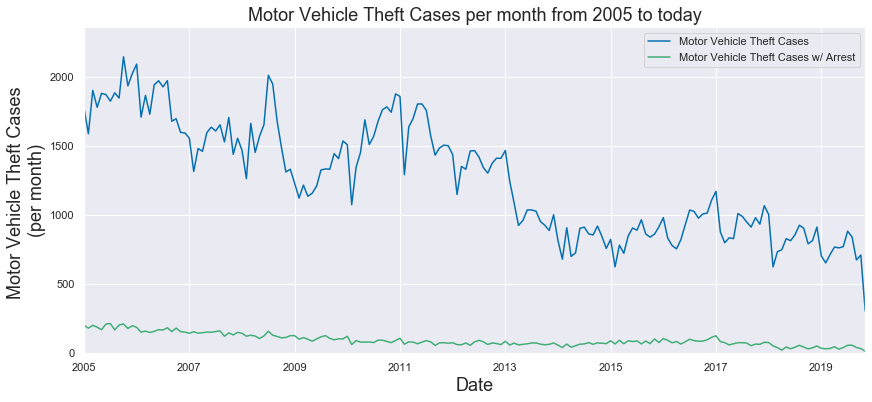

In [153]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

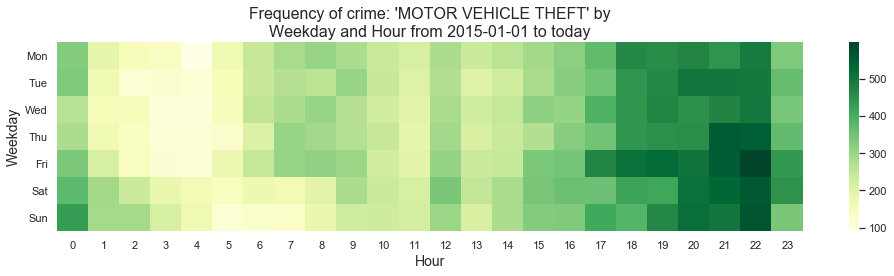

In [154]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

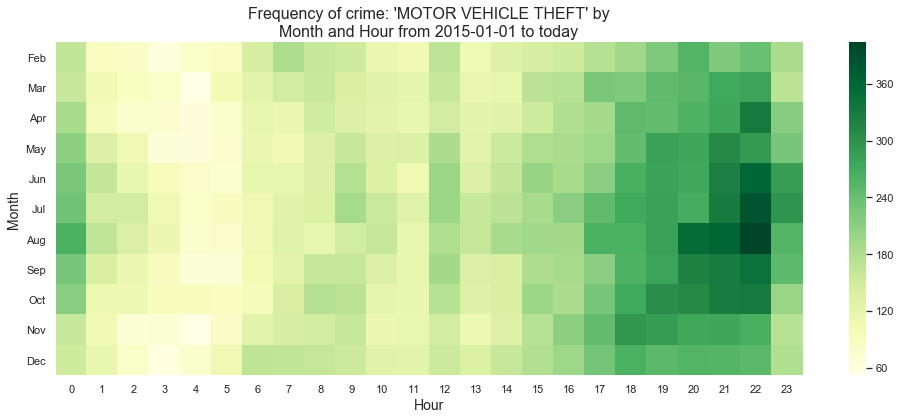

In [155]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

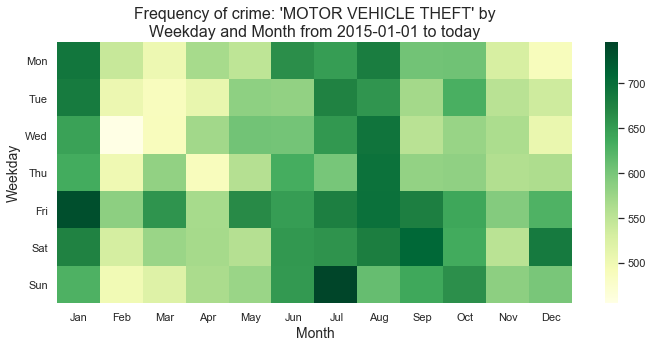

In [156]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

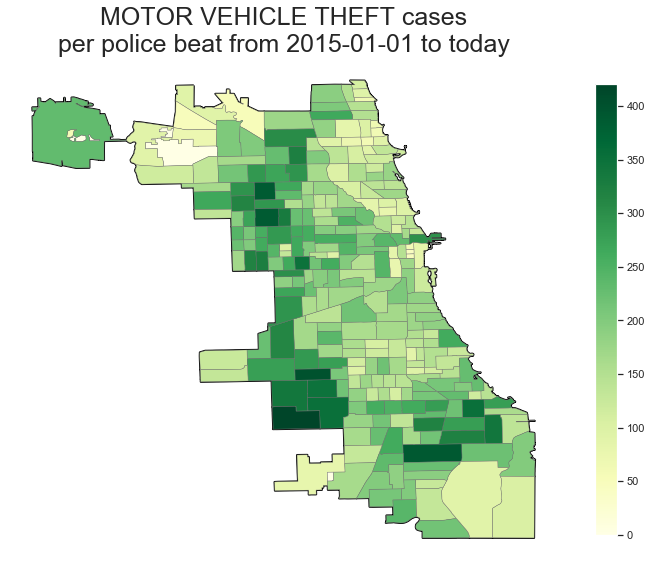

In [151]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics

In [157]:
crime_descr='NARCOTICS'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [158]:
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 3000) & (query < 1000000)]

POSS: CANNABIS 30GMS OR LESS      277920
POSS: CRACK                       120672
POSS: HEROIN(WHITE)                94812
SOLICIT NARCOTICS ON PUBLICWAY     27649
MANU/DELIVER: HEROIN (WHITE)       26042
POSS: COCAINE                      25269
MANU/DELIVER:CRACK                 24779
ATTEMPT POSSESSION NARCOTICS       21345
POSS: CANNABIS MORE THAN 30GMS     18785
FOUND SUSPECT NARCOTICS            17479
MANU/DEL:CANNABIS OVER 10 GMS      12173
MANU/DEL:CANNABIS 10GM OR LESS     11826
POSSESSION OF DRUG EQUIPMENT        9010
ATTEMPT POSSESSION CANNABIS         4619
POSS: HALLUCINOGENS                 4031
FORFEIT PROPERTY                    3868
POSS: SYNTHETIC DRUGS               3794
POSS: PCP                           3716
POSS: HEROIN(BRN/TAN)               3473
Name: Description, dtype: int64

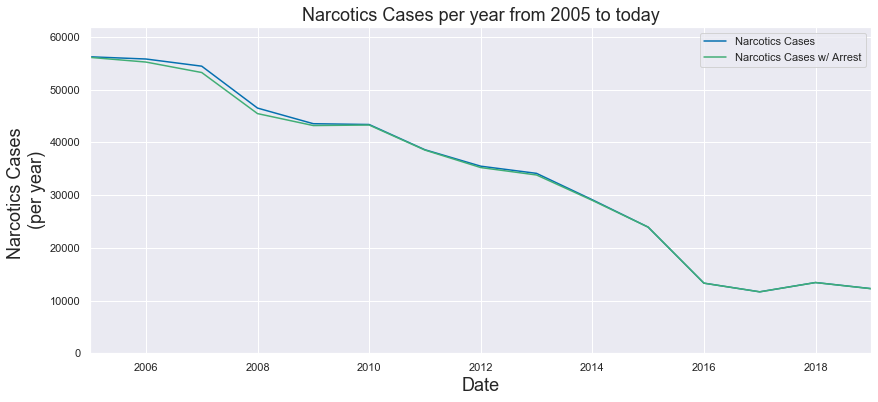

In [159]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

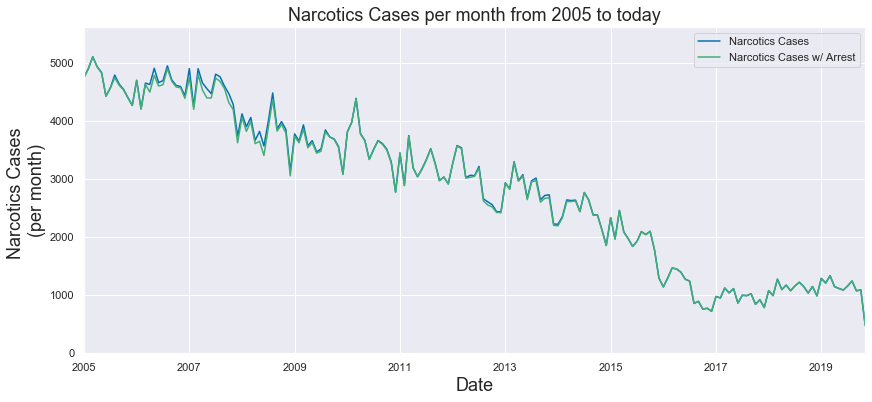

In [160]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

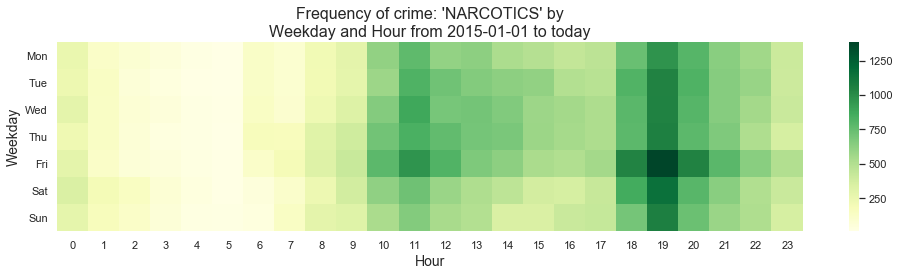

In [161]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

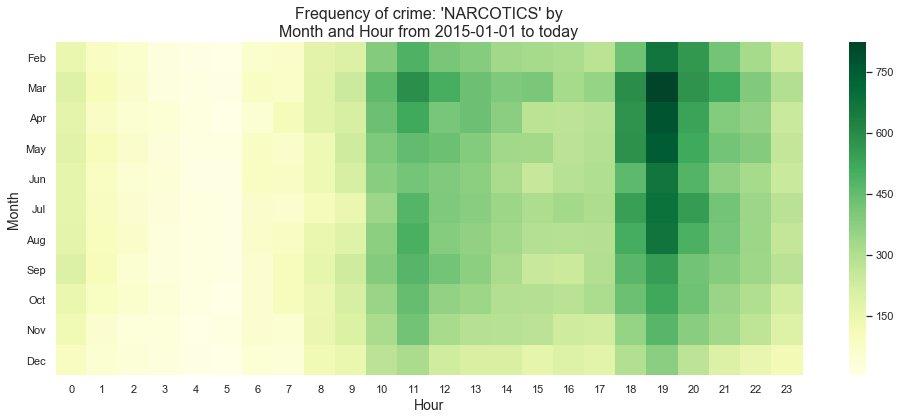

In [162]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

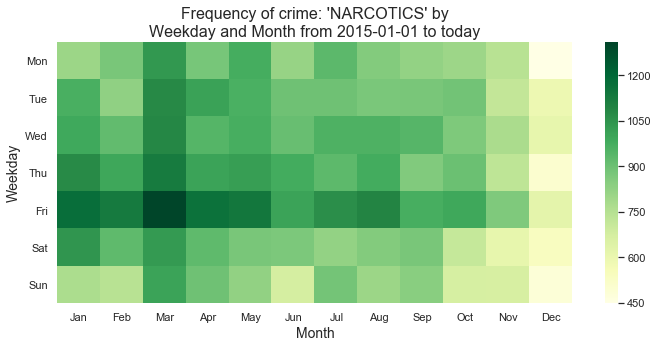

In [163]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

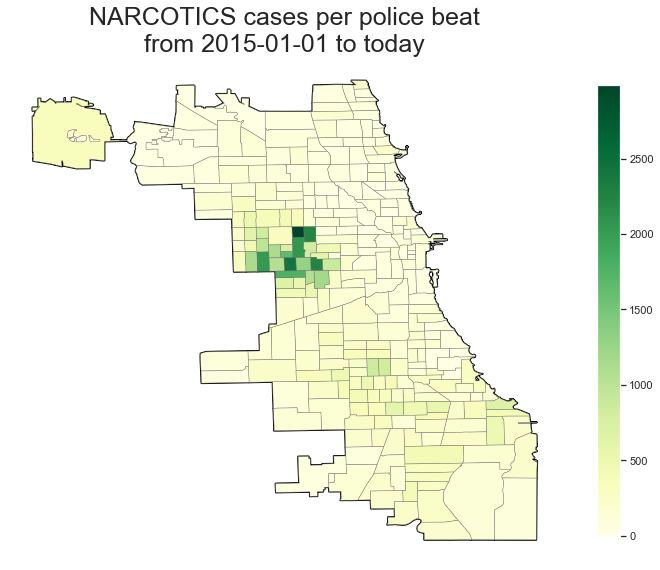

In [164]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics: Cannabis Possession (under 30 grams)

In [165]:
crime_descr='POSS: CANNABIS 30GMS OR LESS'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

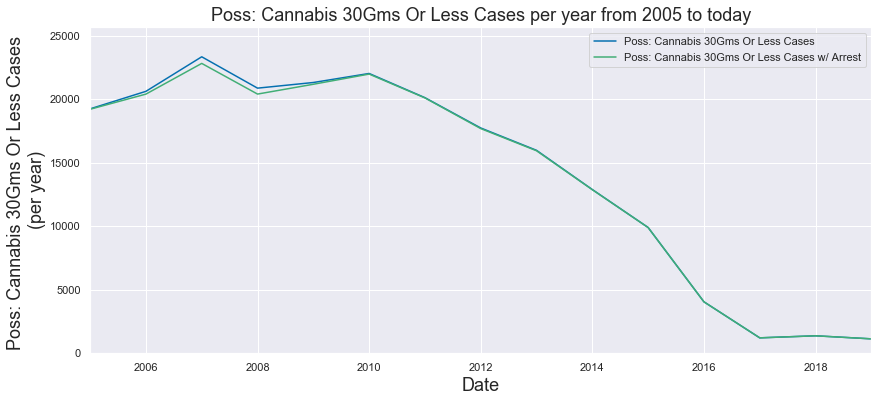

In [166]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

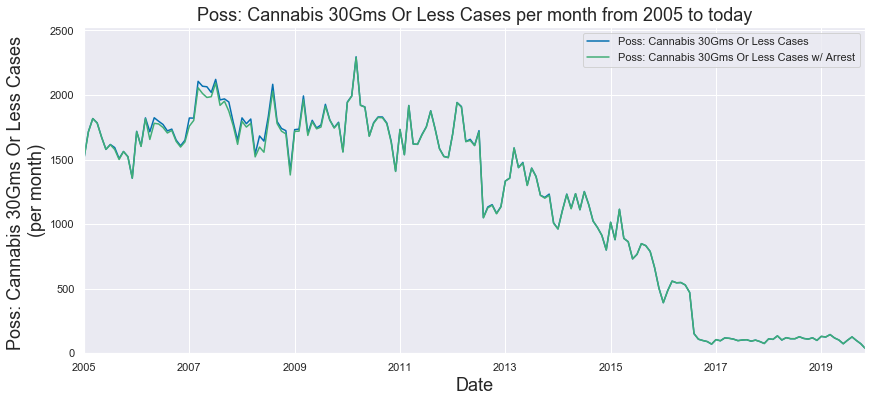

In [167]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

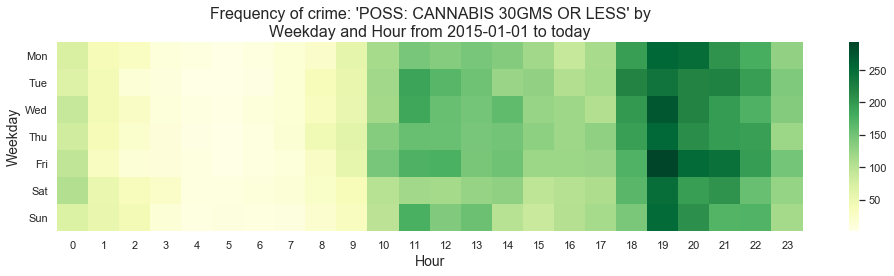

In [168]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

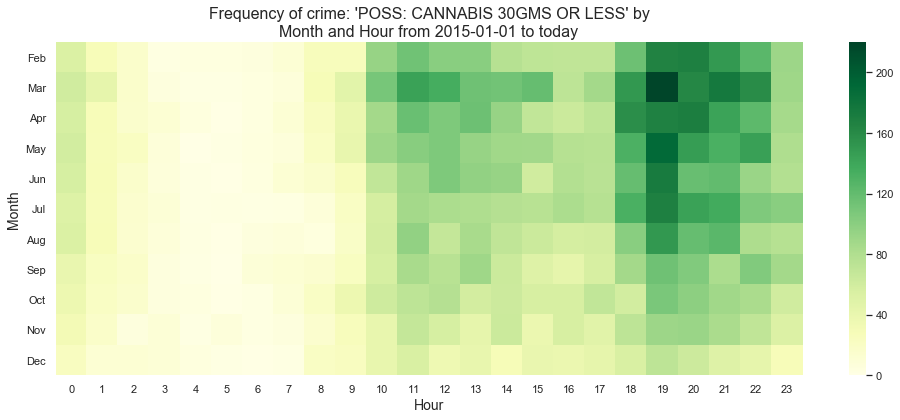

In [169]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

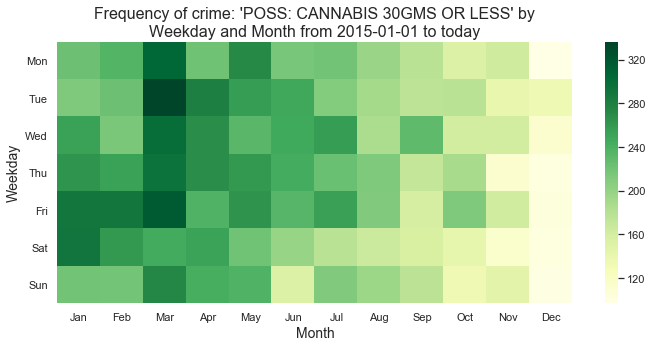

In [170]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

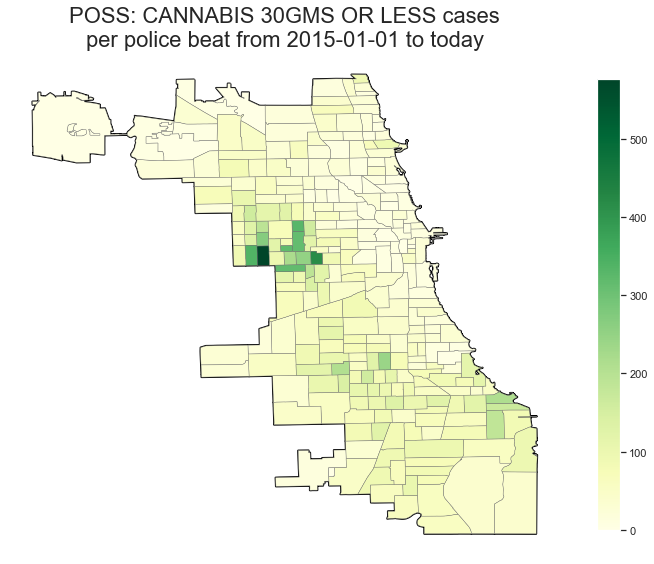

In [171]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics: Crack Possession

In [172]:
crime_descr='POSS: CRACK'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

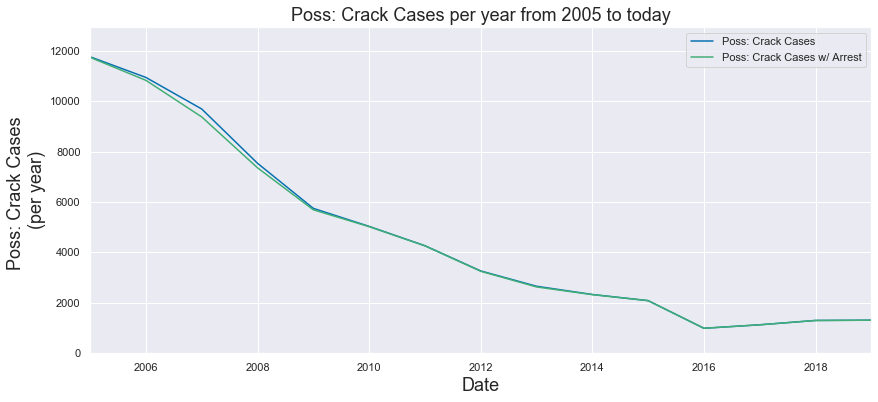

In [173]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

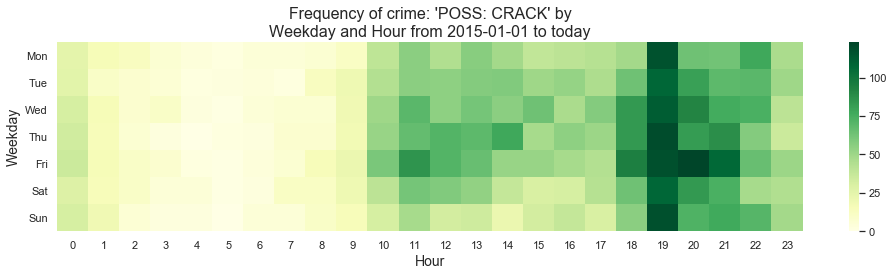

In [174]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

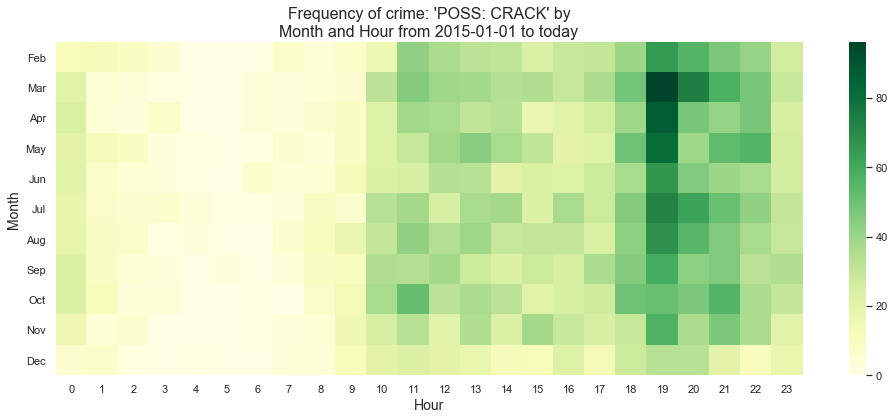

In [175]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

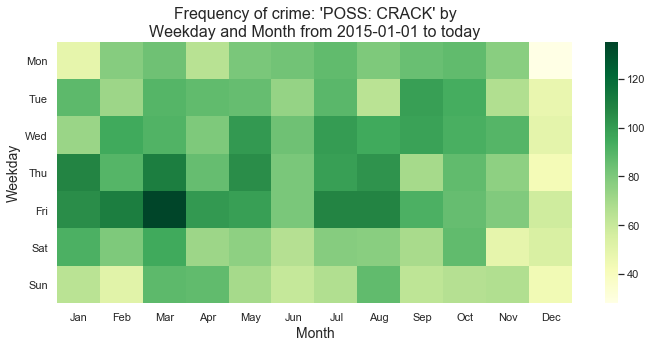

In [176]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

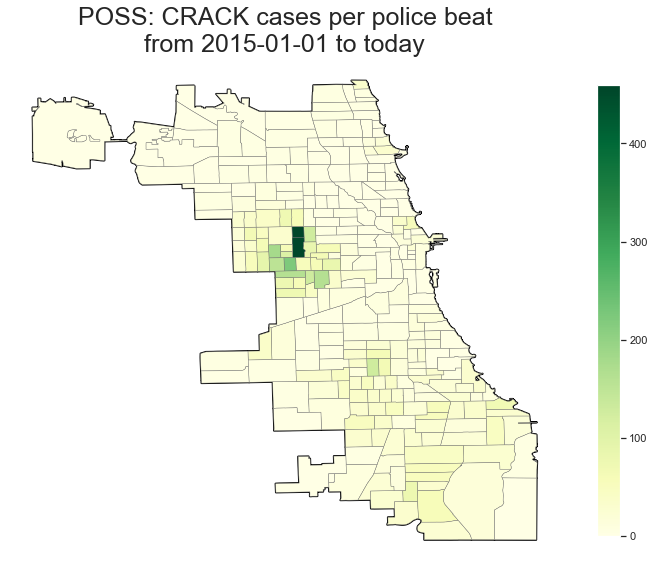

In [177]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics: Heroin Possession

In [178]:
crime_descr='POSS: HEROIN(WHITE)'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

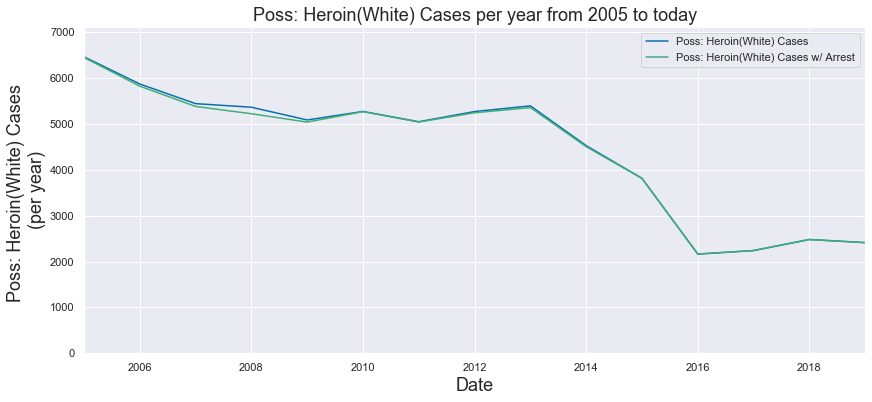

In [179]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

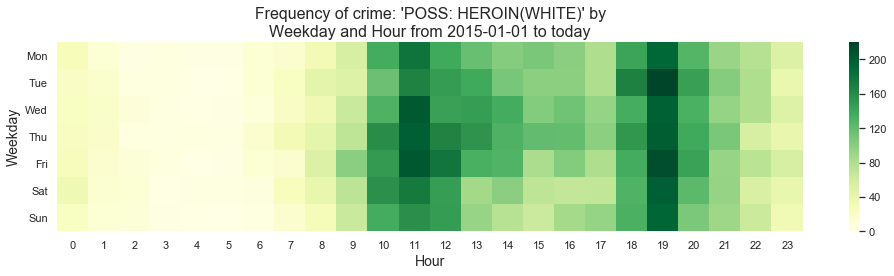

In [180]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

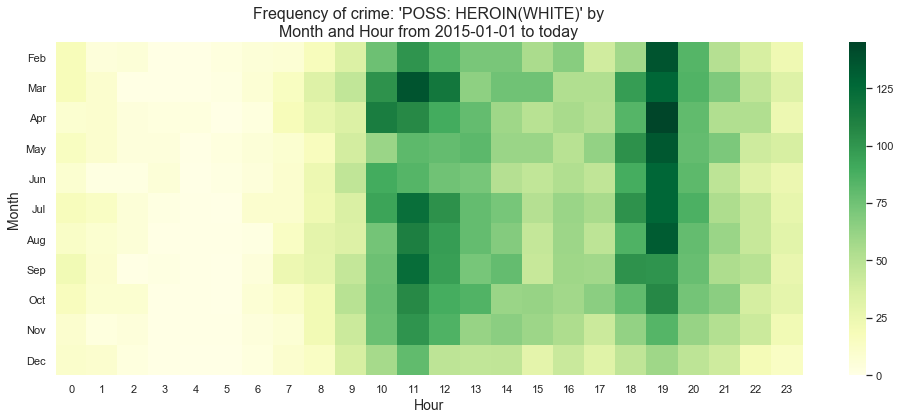

In [181]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

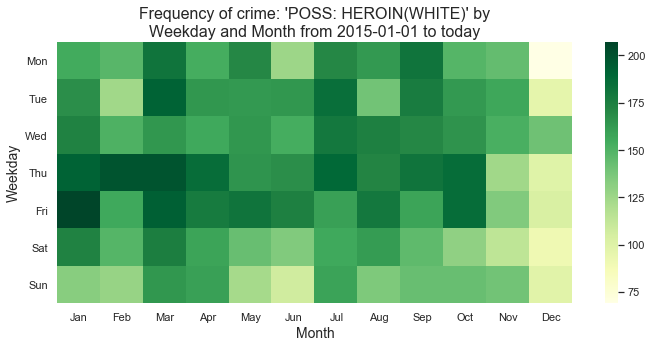

In [182]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

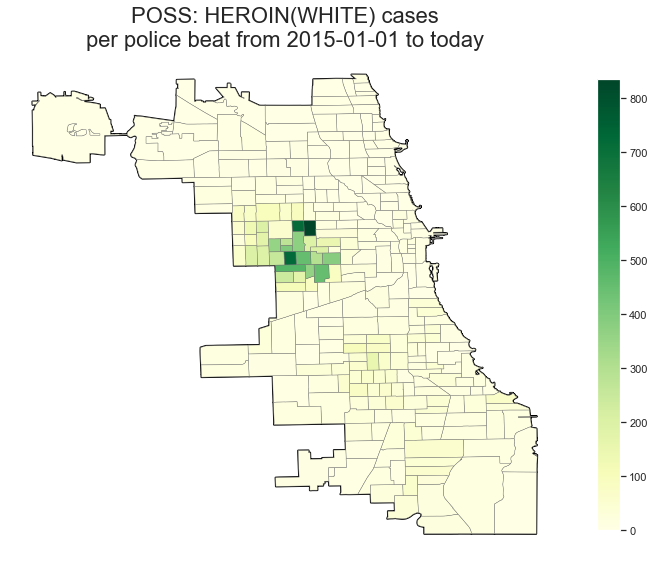

In [183]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics: Cocaine Possession

In [184]:
crime_descr='POSS: COCAINE'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

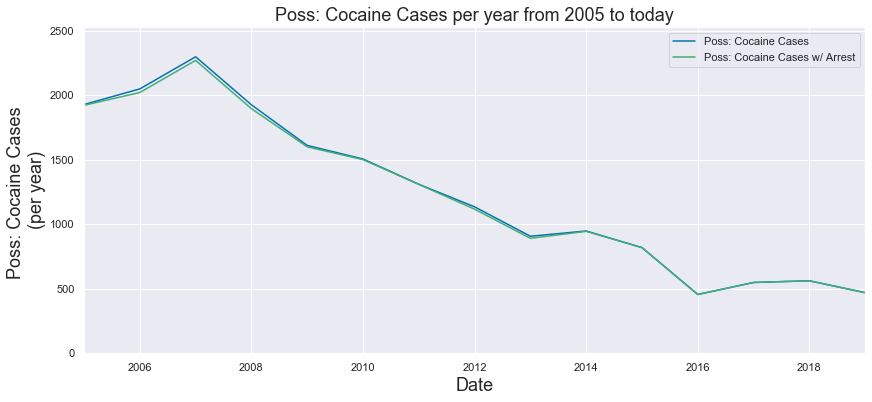

In [185]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

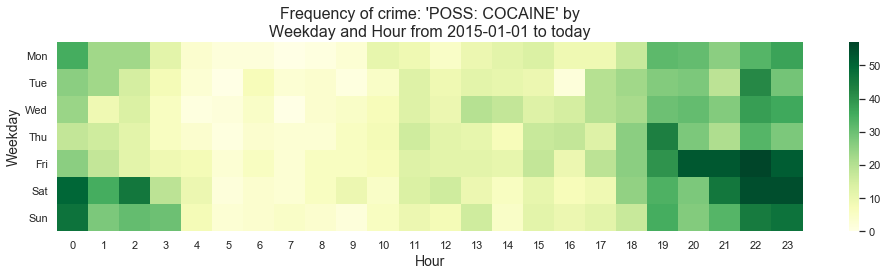

In [186]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

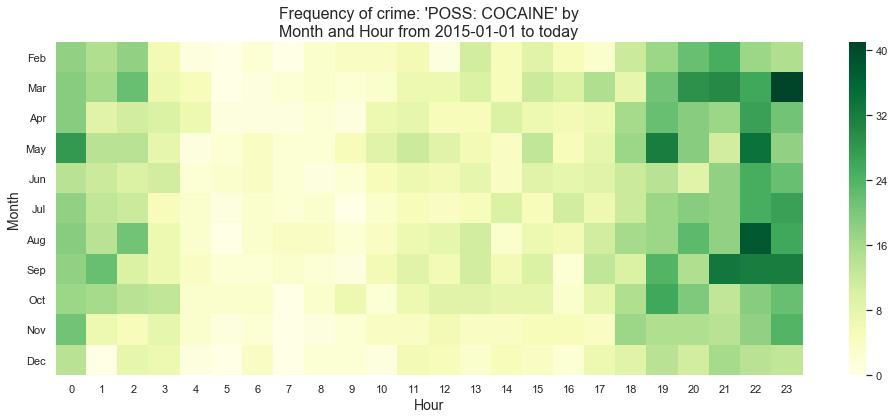

In [187]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

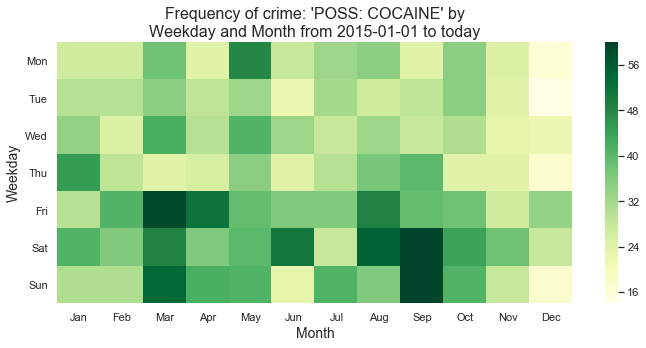

In [188]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

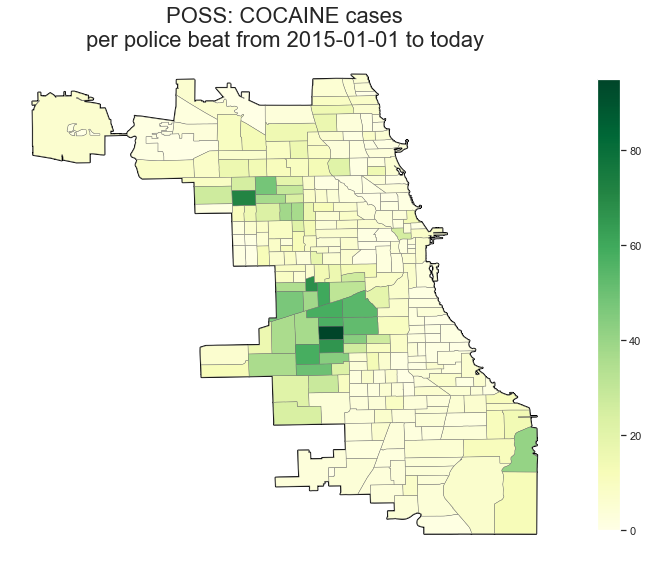

In [189]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics: Crack Possession

In [190]:
crime_descr='POSS: SYNTHETIC DRUGS'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

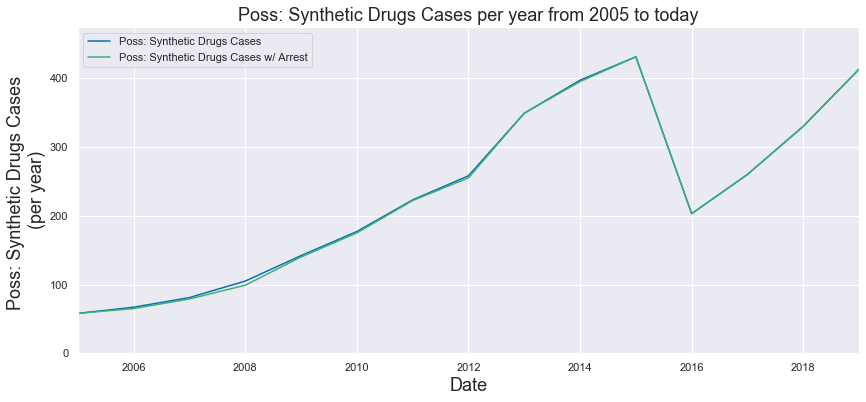

In [191]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

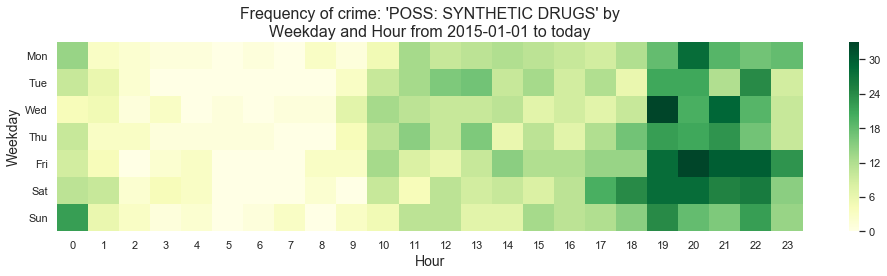

In [192]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

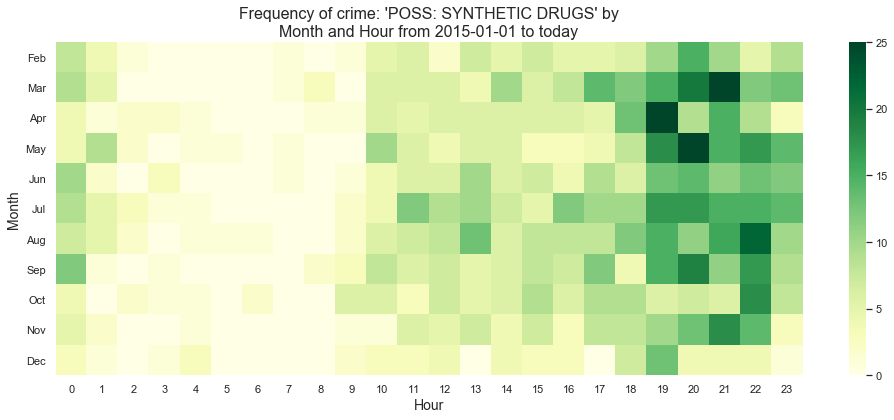

In [193]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

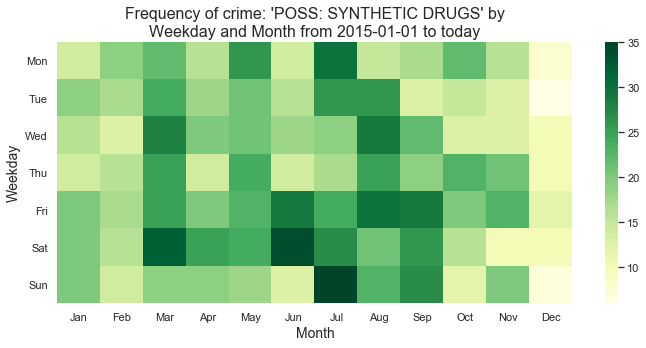

In [194]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

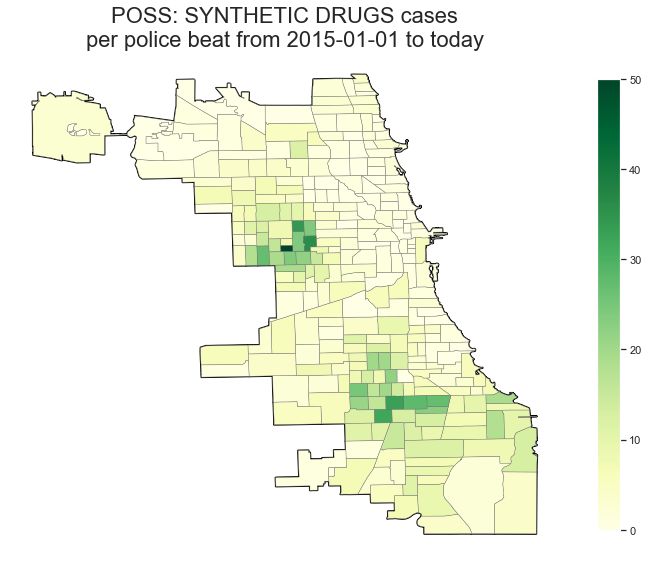

In [195]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

### Narcotics:  Soliciting narcotics in public

In [196]:
crime_descr='SOLICIT NARCOTICS ON PUBLICWAY'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

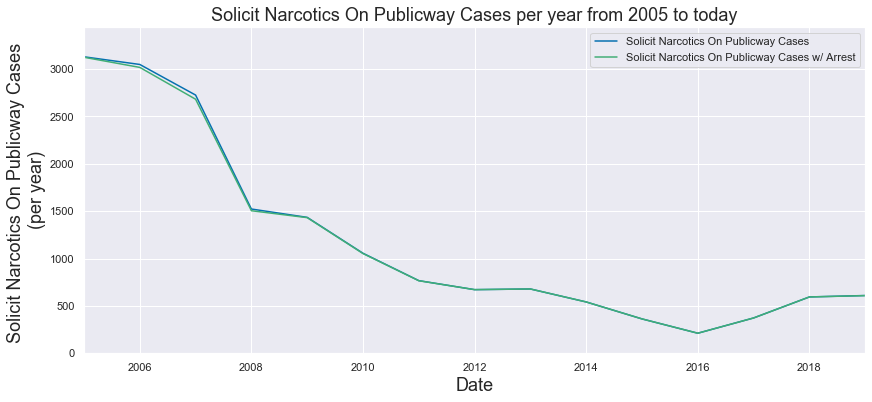

In [197]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

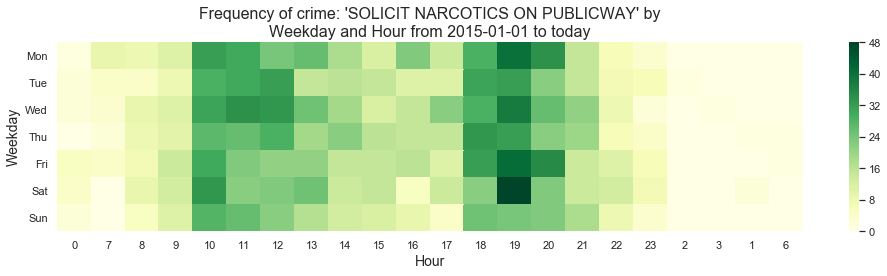

In [198]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

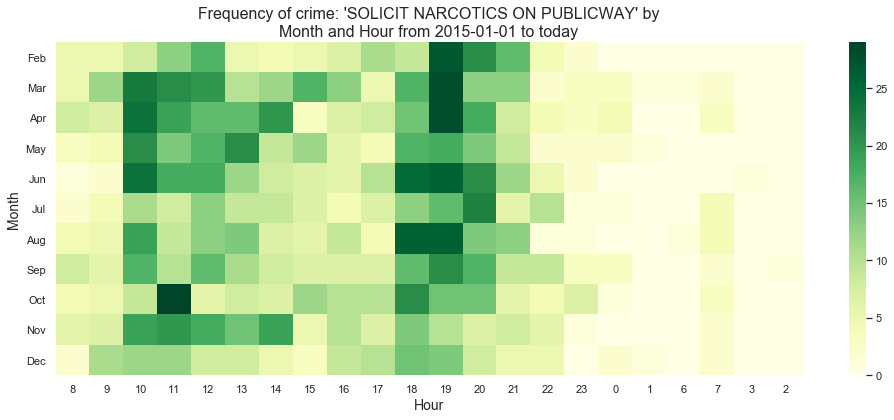

In [199]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

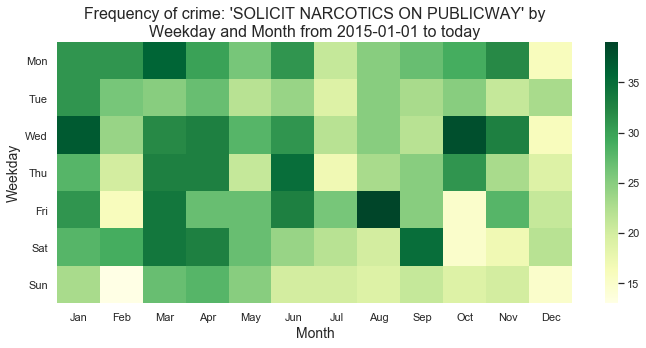

In [200]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

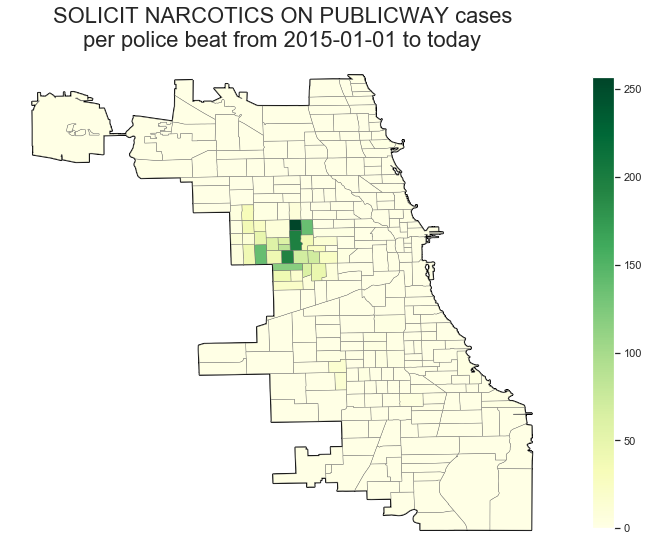

In [201]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## THEFT: All

In [202]:
crime_descr='THEFT'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [203]:
# Number of Theft Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

$500 AND UNDER                      570226
OVER $500                           363347
FROM BUILDING                       237657
RETAIL THEFT                        178062
FINANCIAL ID THEFT: OVER $300        44531
POCKET-PICKING                       35560
PURSE-SNATCHING                      17187
FINANCIAL ID THEFT:$300 &UNDER       15206
ATTEMPT THEFT                        11613
ATTEMPT FINANCIAL IDENTITY THEFT      2955
AGG: FINANCIAL ID THEFT               2901
FROM COIN-OP MACHINE/DEVICE           1111
DELIVERY CONTAINER THEFT               925
Name: Description, dtype: int64

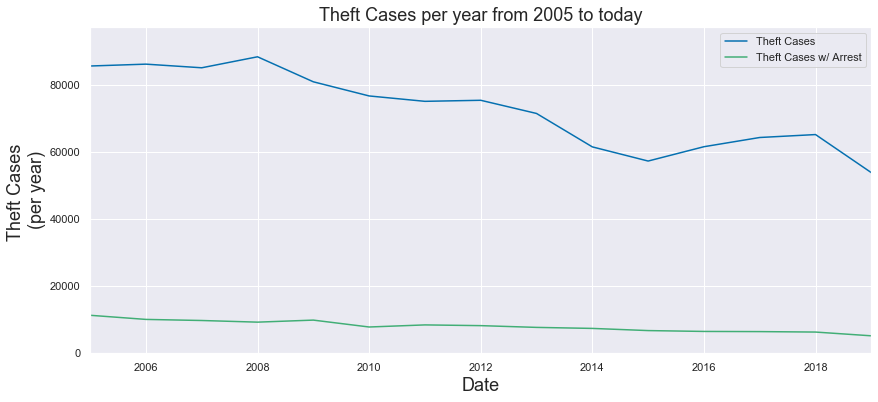

In [204]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

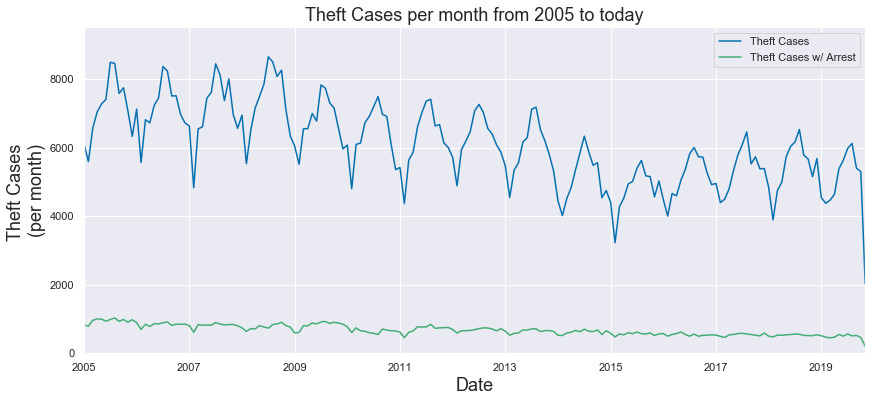

In [205]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

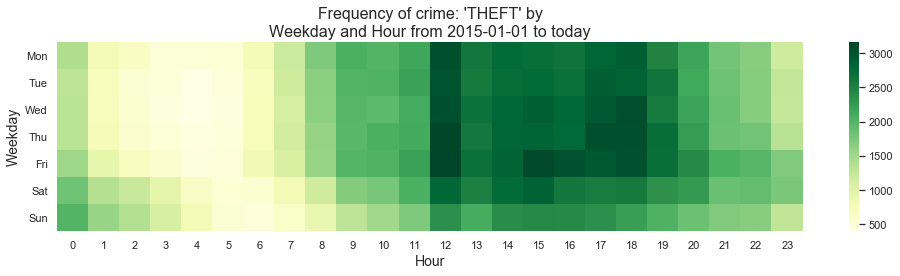

In [206]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

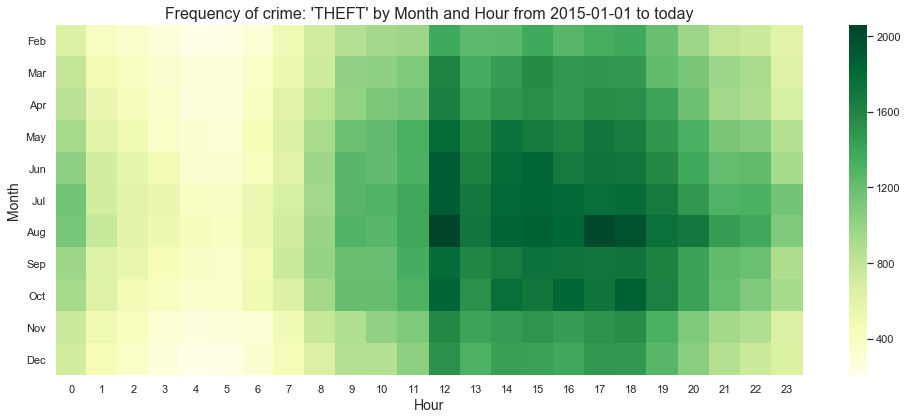

In [207]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

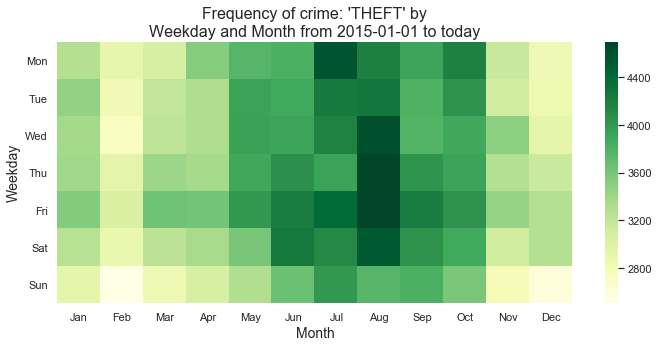

In [208]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

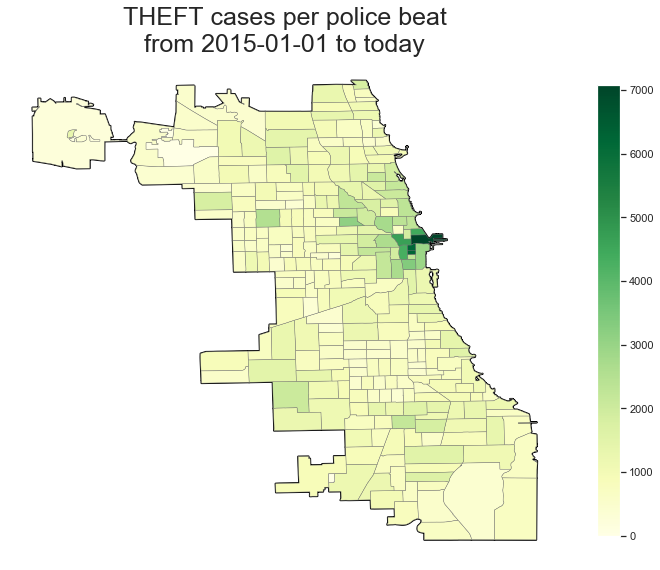

In [209]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## THEFT: Petty (under \$500)

In [210]:
crime_descr='$500 AND UNDER'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

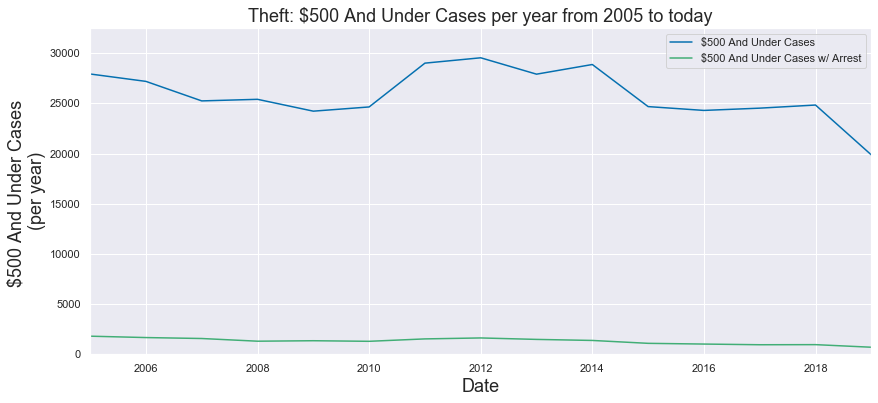

In [211]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', more_label='Theft: ')

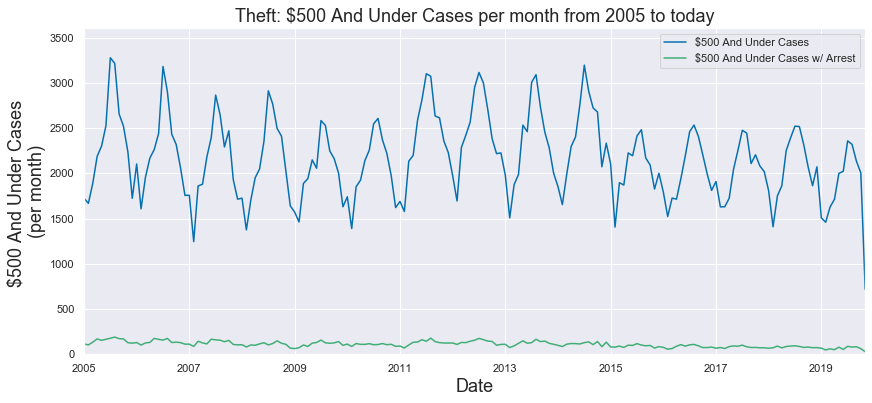

In [212]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005', more_label='Theft: ')

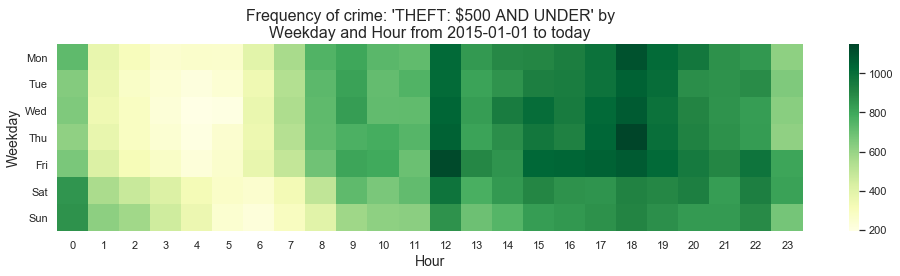

In [213]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='THEFT: ')

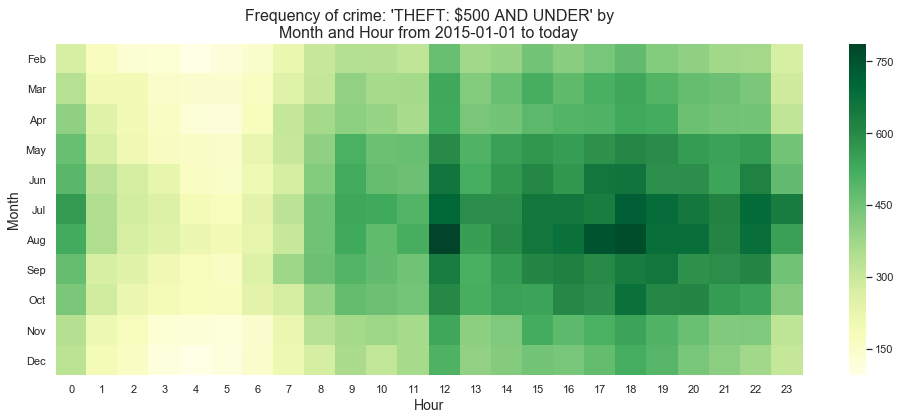

In [214]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='THEFT: ')

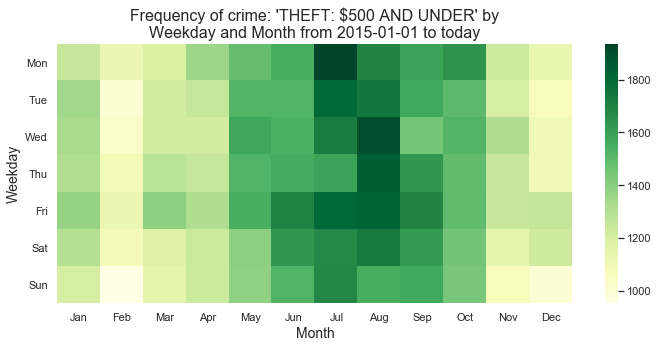

In [215]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='THEFT: ')

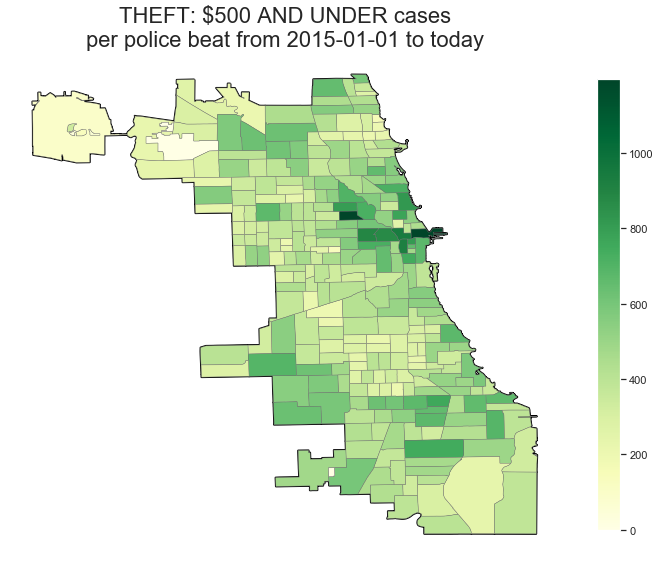

In [216]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, 
           scale=0.65, more_label='THEFT: ')

## THEFT: Pocket Picking

In [217]:
crime_descr='POCKET-PICKING'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

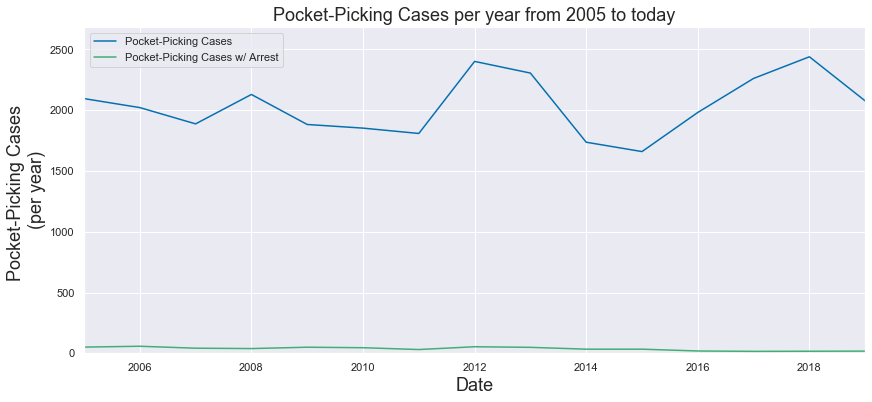

In [218]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

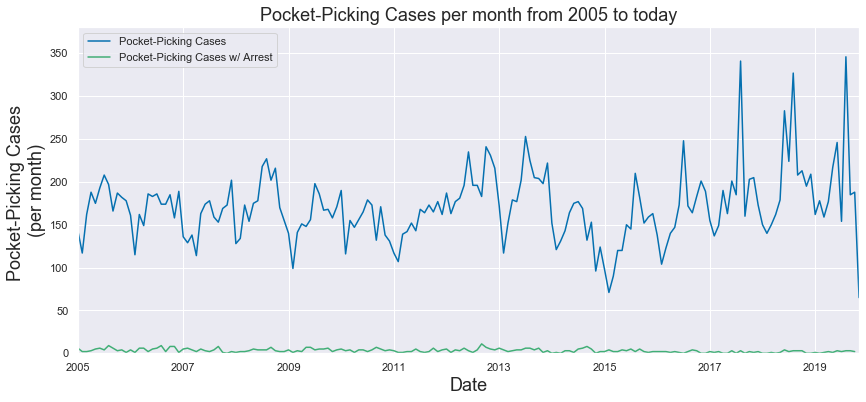

In [219]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

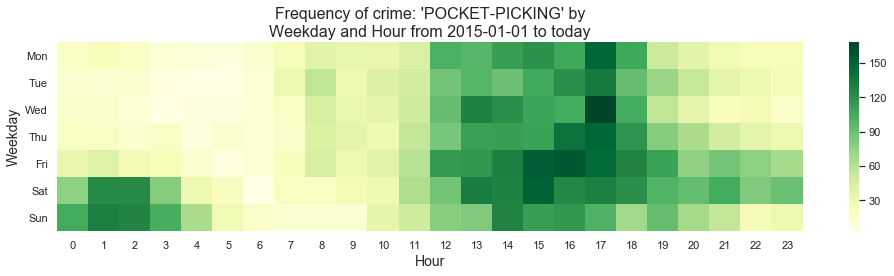

In [220]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

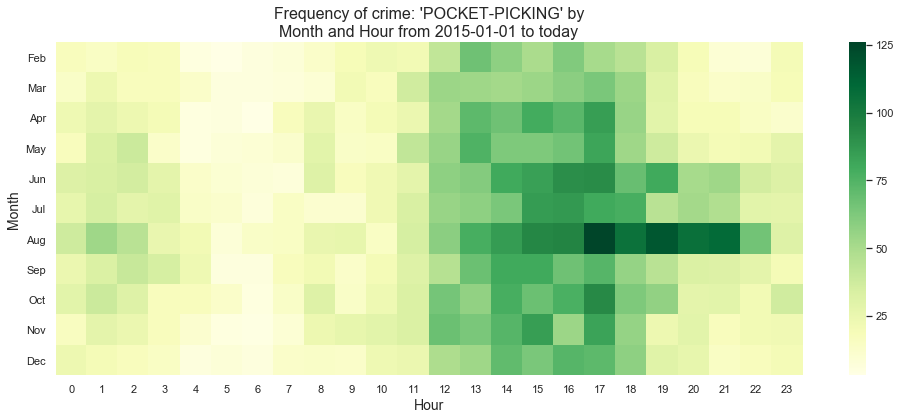

In [221]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

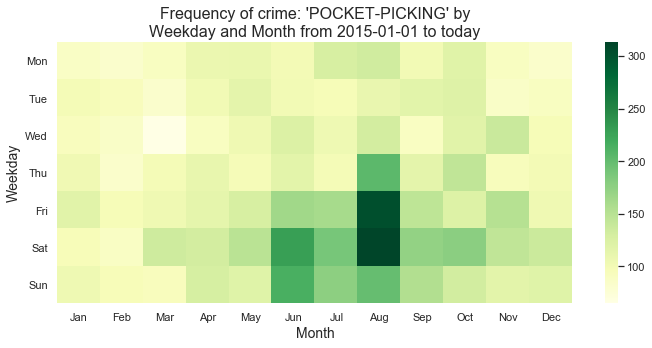

In [222]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

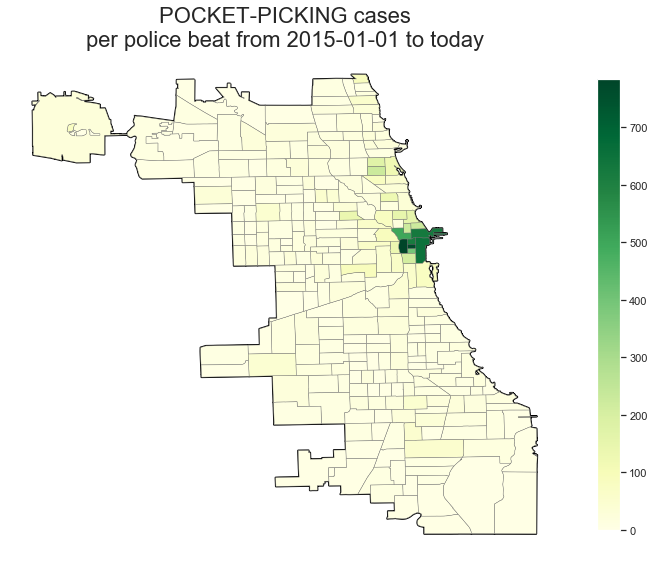

In [223]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## THEFT: Purse snatching

In [224]:
crime_descr='PURSE-SNATCHING'
crime_col='Description'
start_date='2016-01-01'
end_date='today'

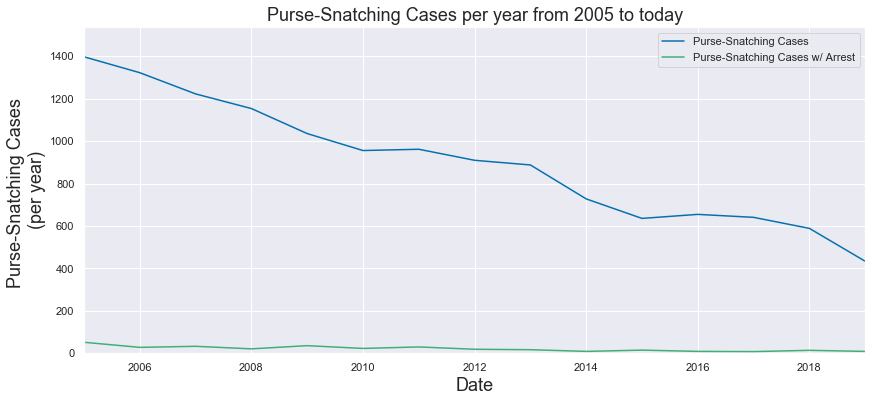

In [225]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

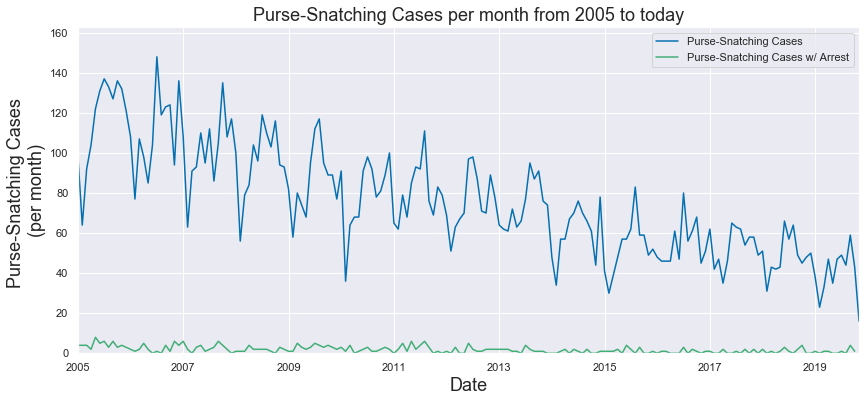

In [226]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

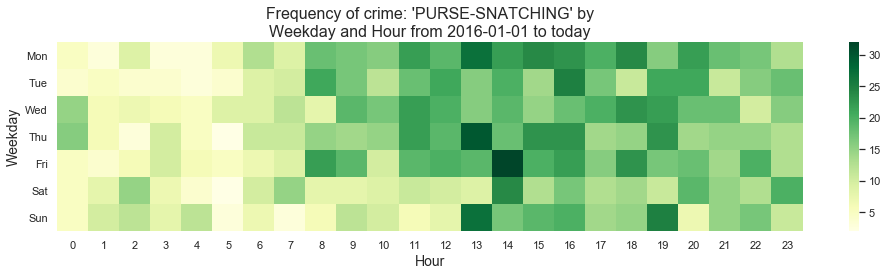

In [227]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

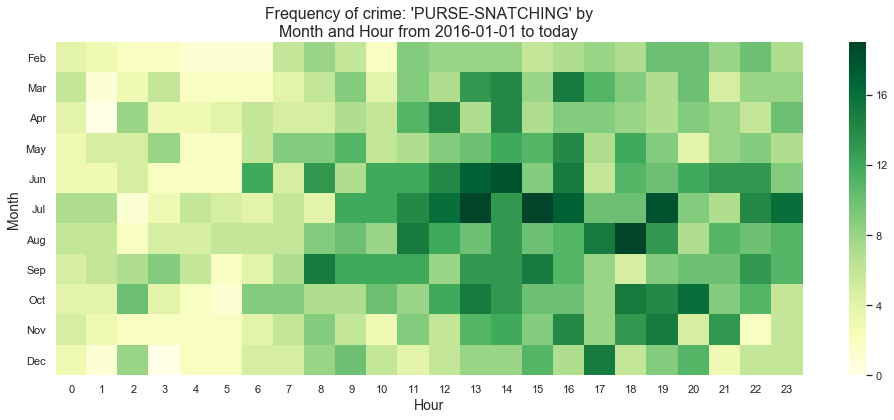

In [228]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

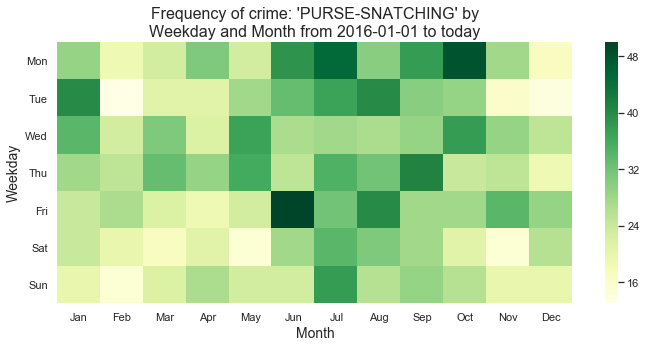

In [229]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

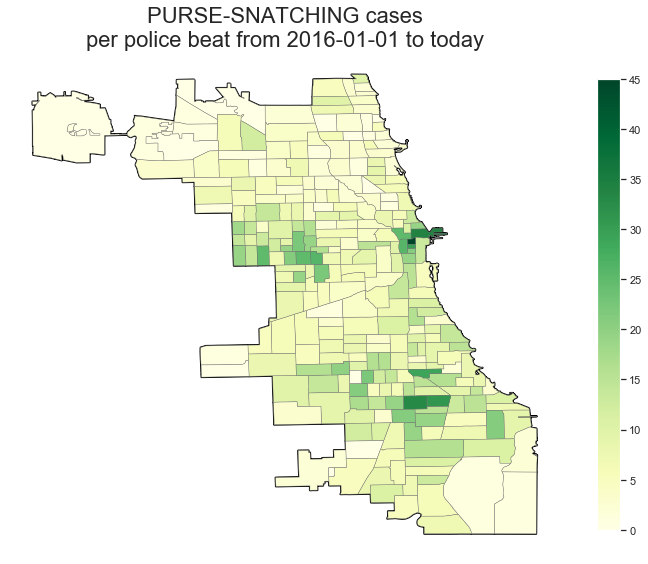

In [230]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## BURGLARY: All

In [231]:
crime_descr='BURGLARY'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [232]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

FORCIBLE ENTRY            268683
UNLAWFUL ENTRY            106472
ATTEMPT FORCIBLE ENTRY     17439
HOME INVASION               5303
Name: Description, dtype: int64

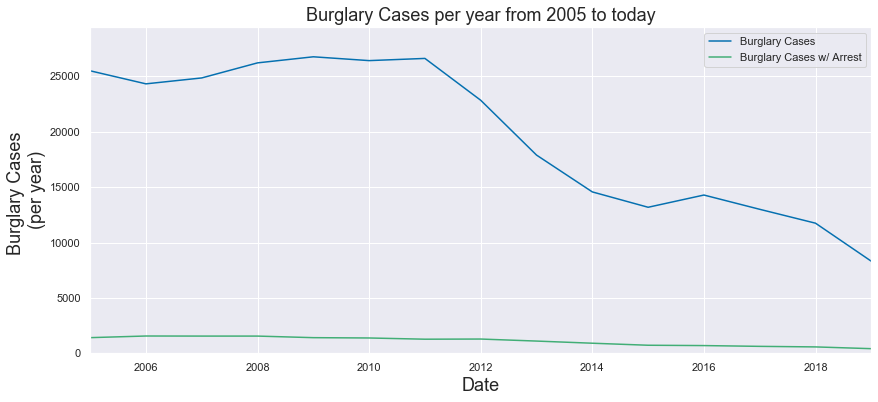

In [233]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

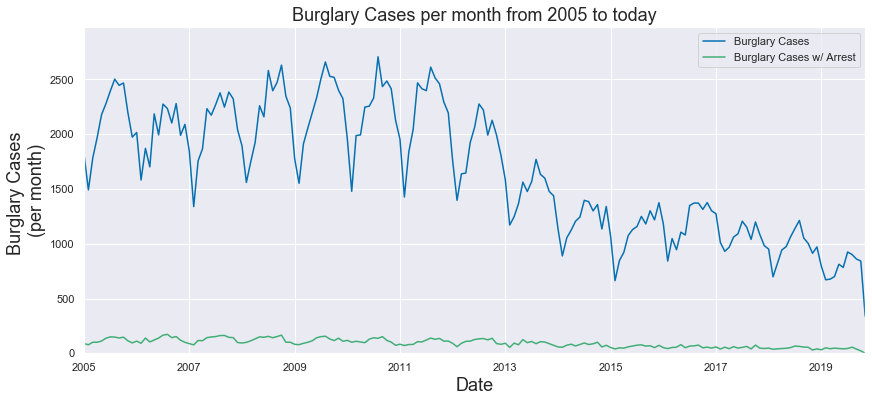

In [234]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

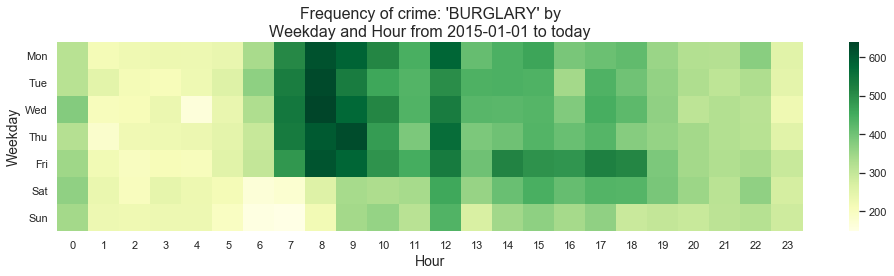

In [235]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

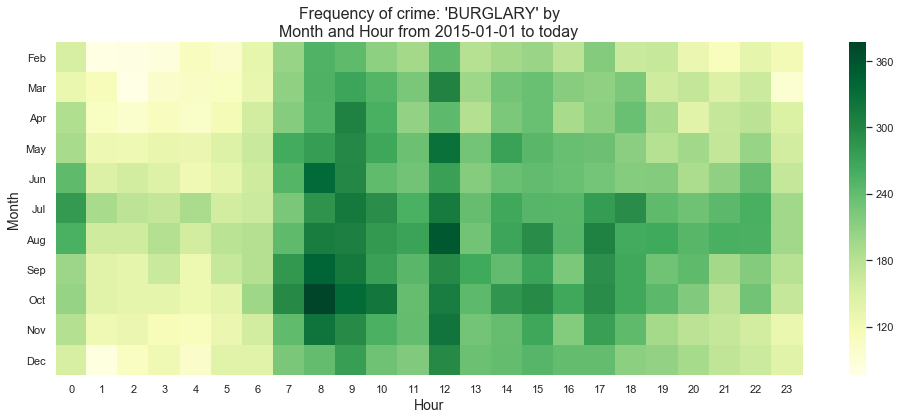

In [236]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

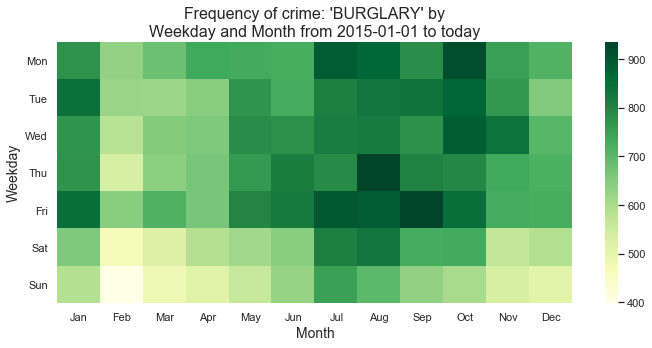

In [237]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

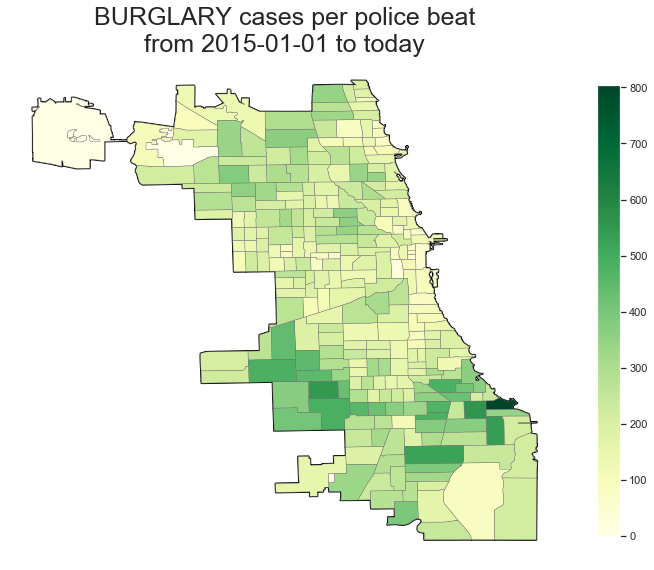

In [238]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## PROSTITUTION: All

In [239]:
crime_descr='PROSTITUTION'
crime_col='Primary Type'
start_date='2015-01-01'
end_date='today'

In [240]:
# Number of Battery Cases by description since 2001
query = chi_crimes.loc[(chi_crimes['Primary Type'] == crime_descr), 'Description'].value_counts()
query[(query > 500) & (query < 1000000)]

SOLICIT ON PUBLIC WAY       47829
SOLICIT FOR BUSINESS        14750
CALL OPERATION               2367
SOLICIT FOR PROSTITUTE       2186
PATRONIZING A PROSTITUTE      812
Name: Description, dtype: int64

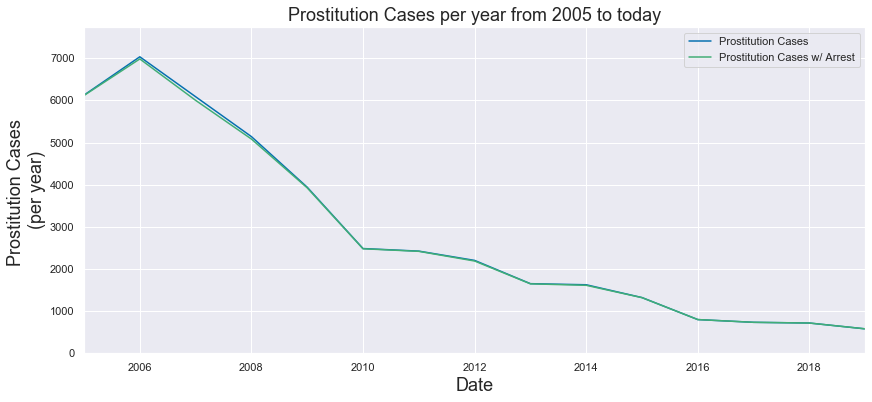

In [241]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005')

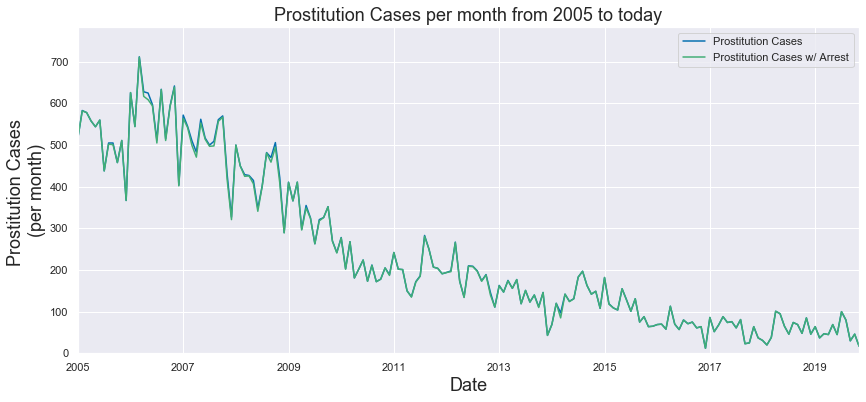

In [242]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005')

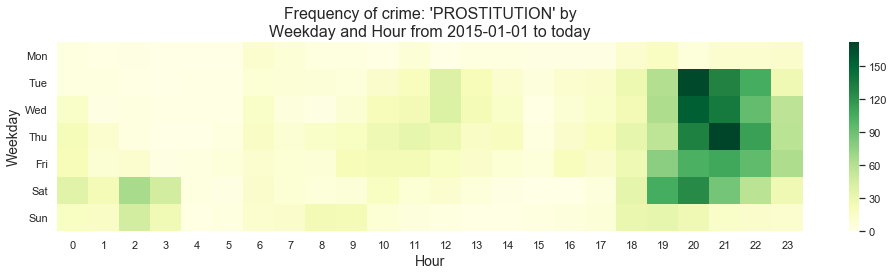

In [243]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date)

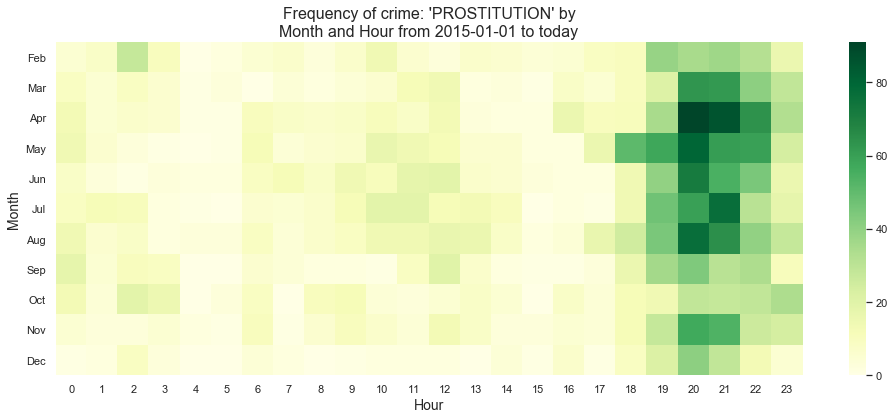

In [244]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date)

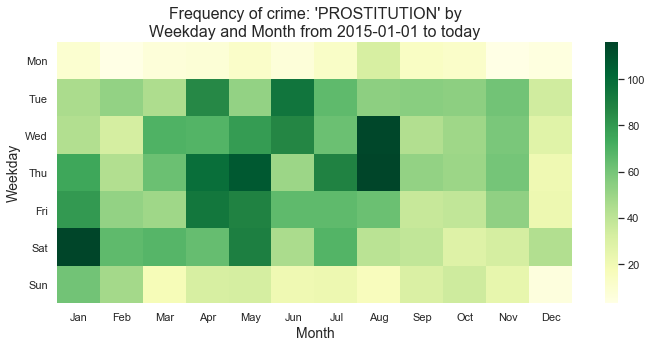

In [245]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5))

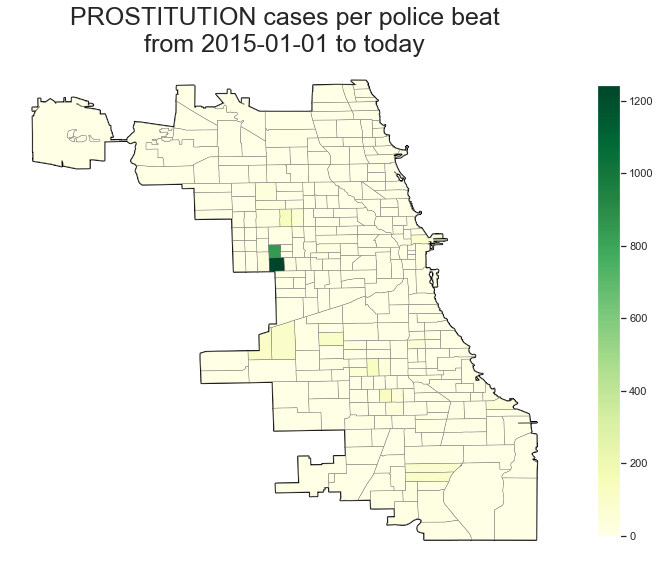

In [246]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65)

## PROSTITUTION: Call operation

In [247]:
crime_descr='CALL OPERATION'
crime_col='Description'
start_date='2015-01-01'
end_date='today'

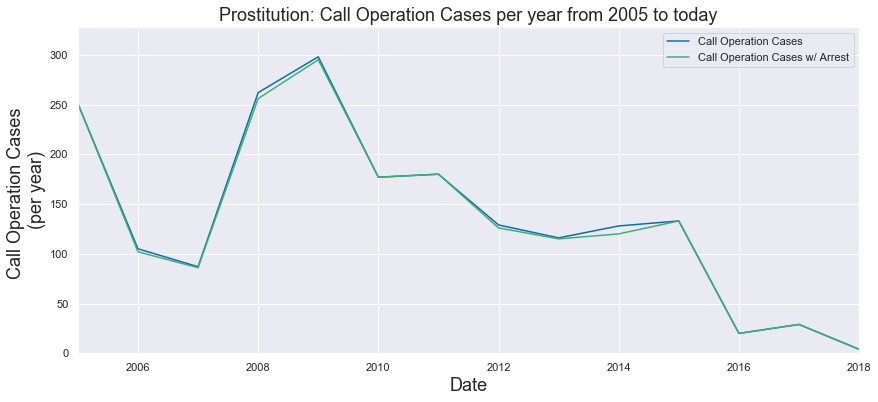

In [248]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='year', start_date='2005', 
            more_label='Prostitution: ')

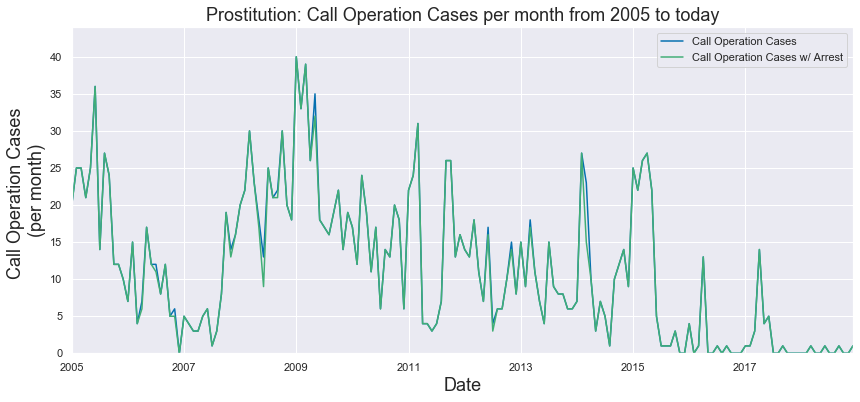

In [249]:
arrest_plot(crime_descr=crime_descr, crime_col=crime_col, frequency='month', start_date='2005',
            more_label='Prostitution: ')

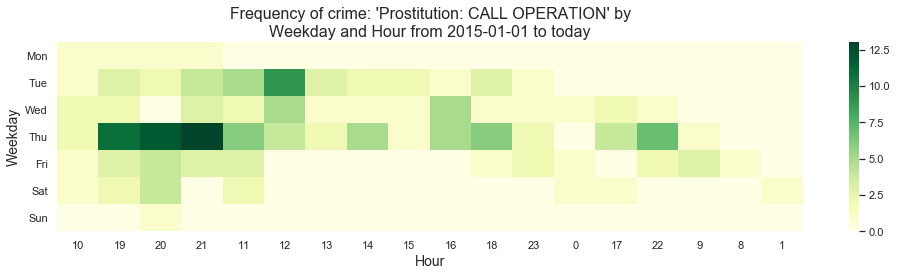

In [250]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, more_label='Prostitution: ')

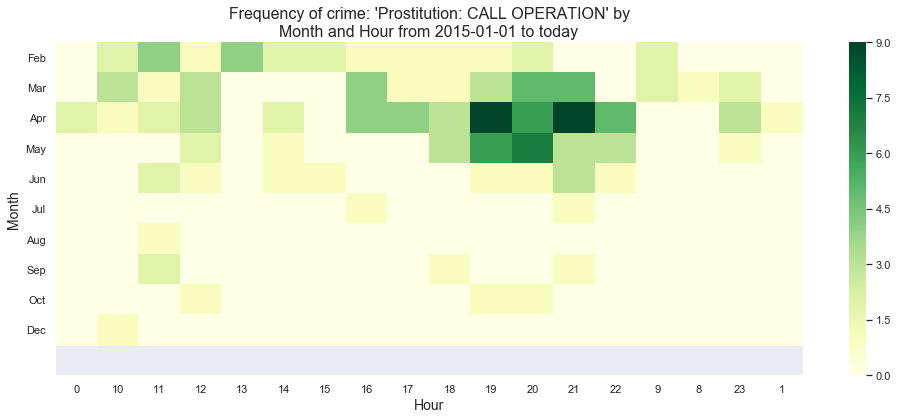

In [251]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Hour', y_ax='Month', 
                        start_date=start_date, end_date=end_date, more_label='Prostitution: ')

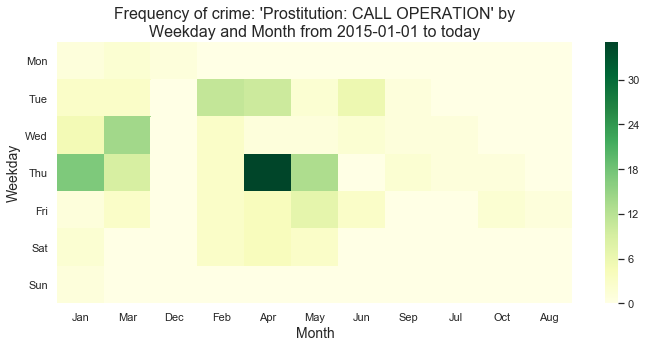

In [252]:
plot_crime_freq_heatmap(crime_descr=crime_descr, crime_col=crime_col, x_ax='Month', y_ax='Weekday', 
                        start_date=start_date, end_date=end_date, figsize=(10,5), more_label='Prostitution: ')

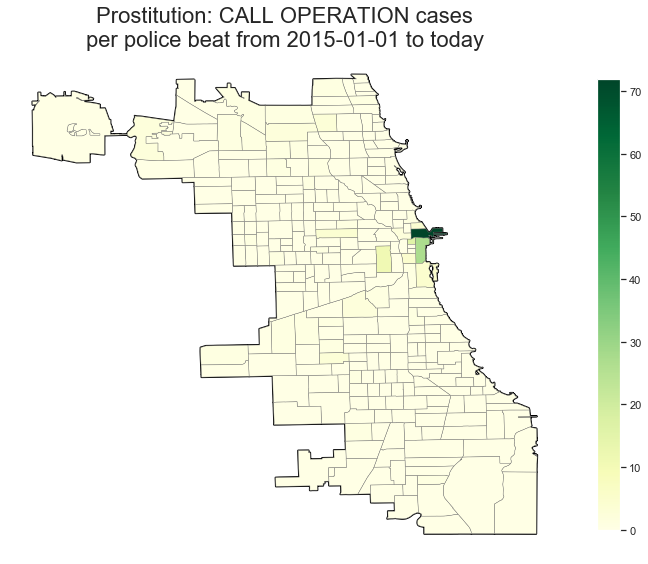

In [253]:
map_counts(crime_descr=crime_descr, crime_col=crime_col, start_date=start_date, end_date=end_date, scale=0.65, more_label='Prostitution: ')